DNA HotEncoder Difussion adapted from the Annotated diffusion notebook (https://huggingface.co/blog/annotated-diffusion)


Training is taking a lot wihout A100 GPU

-Non bit diffusion implementation  


Contributions   
Lucas Ferreira da Silva  
Luca Pinello  

Tasks

---


 - Transfer task annotation from the diffusion notebook 
 - Reimplement the cell conditional diffusion
 - Fix the architecture to lower the metrics 
 - Is this the best metric (kl motifs absence and presence)?




---
 - remove the comments from OVERFIT to train the model using only one sequence
 - The model is learning since I'm not enforcing the intermediarie steps follow the -1 / + 1 hotencoding constraint. In the last diffusion steps we can notice this convergence (only one 1(+1) and 3 (-1))



# Installs and Downloads

In [1]:
#!pip install einops

In [2]:
# #downloading data
# !wget https://www.dropbox.com/s/db6up7c0d4jwdp4/train_all_classifier_WM20220916.csv.gz?dl=2
# #changing name
# !mv   train_all_classifier_WM20220916.csv.gz?dl=2 train_all_classifier_WM20220916.csv.gz
# #unpcaking 
# !gunzip -d /train_all_classifier_WM20220916.csv.gz?dl=2 train_all_classifier_WM20220916.csv
# #new seqs


In [3]:
# !pip install gimmemotifs    #can takes around 10 minutes
# !genomepy install hg38

# Importing

In [1]:
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
from IPython.display import display
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
from tqdm import tqdm_notebook
import seaborn as sns
import matplotlib.pyplot as plt
from torch.nn.modules.activation import ReLU
from torch.optim import Adam
from tqdm import tqdm_notebook
from torchvision.utils import save_image
import matplotlib
import math
from inspect import isfunction
from functools import partial
import scipy
from scipy.special import rel_entr
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.animation as animation
import matplotlib.image as mpimg
import glob
from PIL import Image

%matplotlib inline


# Utils

In [2]:
nucleotides = ['A', 'C', 'T', 'G']

def one_hot_encode(seq, alphabet, max_seq_len):
    """One-hot encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros((max_seq_len, len(alphabet)))
    for i in range(seq_len):
        seq_array[i, alphabet.index(seq[i])] = 1
    return seq_array



def encode(seq, alphabet):
    """Encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros(len(alphabet))
    for i in range(seq_len):
        seq_array[alphabet.index(seq[i])] = 1
    
    return seq_array






def show_seq(dataloader_seq):
    for i_image in dataloader_seq:
      for image in i_image:
        image = image.numpy().reshape(4,200)
        print (image)
        plt.rcParams["figure.figsize"] = (20,1)
        pd_seq = pd.DataFrame(image)
        pd_seq.index = nucleotides
        sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
        plt.show()

class SequenceDataset(Dataset):
    'Characterizes a dataset for PyTorch'
    def __init__(self, ims):
      'Initialization'
      self.ims = ims
    def __len__(self):
      'Denotes the total number of samples'
      return len(self.ims)
    def __getitem__(self, index):
      'Generates one sample of data'
      # Select sample
      image = self.ims[index]
      X = self.transform(image)
      return X
            
    transform = T.Compose([ T.ToTensor()])
    



## Motif Metric

In [3]:
def sampling_to_metric():
  # Sampling regions using the trained  model
    final_sequences=[]
    for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences
      #sampled_images = bit_diffusion.sample(batch_size = 4)
      sampled_images = sample(model, image_size=image_size, batch_size=10, channels=1)
      for n_b, x in enumerate(sampled_images[-1]):
        #x = x[-1]
        #print(x.shape)
        seq_final = f'>seq_test_{n_a}_{n_b}\n' +''.join([nucleotides[s] for s in np.argmax(x.reshape(4,200), axis=0)]) 
        final_sequences.append(seq_final)



    save_motifs_syn = open('synthetic_motifs.fasta', 'w')

    save_motifs_syn.write('\n'.join(final_sequences))
    save_motifs_syn.close()
    #Scan for motifs
    !gimme scan synthetic_motifs.fasta -p   JASPAR2020_vertebrates -g hg38 > syn_results_motifs.bed
    df_results_syn = pd.read_csv('syn_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_syn['motifs'] = df_results_syn[8].apply(lambda x: x.split( 'motif_name "')[1].split('"')[0]   )
    df_results_syn[0] = df_results_syn[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_motifs_count_syn = df_results_syn[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_motifs_count_syn.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.show()

    return df_motifs_count_syn
    
# Not using the total number of motifs but the count of the occurence aka: percentage of the sequences with a given motif.
def compare_motif_list(df_motifs_a, df_motifs_b):
  # Using KL divergence to compare motifs lists distribution
    set_all_mot = set(df_motifs_a.index.values.tolist() + df_motifs_b.index.values.tolist())
    create_new_matrix = []
    for x in set_all_mot:
        list_in = []
        list_in.append(x) # adding the name
        if x in df_motifs_a.index:
            list_in.append(df_motifs_a.loc[x][0])
        else:
             list_in.append(1)
                
        if x in df_motifs_b.index:
            list_in.append(df_motifs_b.loc[x][0])
        else:
             list_in.append(1)
        
        create_new_matrix.append(list_in)    
  

    df_motifs = pd.DataFrame(create_new_matrix, columns=['motif', 'motif_a', 'motif_b'])
    
    df_motifs['motif_a'] = df_motifs['motif_a'] / df_motifs['motif_a'].sum()  
    df_motifs['motif_b'] = df_motifs['motif_b'] / df_motifs['motif_b'].sum()
    plt.rcParams["figure.figsize"] = (3,3)
    sns.regplot(x='motif_a',  y='motif_b',data=df_motifs)
    plt.xlabel('Diffusion Seqs')
    plt.ylabel('Training Seqs')
    plt.title('Motifs Probs')
    plt.show()

    display(df_motifs) 
    kl_pq = rel_entr(df_motifs['motif_a'].values, df_motifs['motif_b'].values )
    return    np.sum(kl_pq)

#compare_motif_list(synt_df, df_results_seq_guime_count)

Alternative Metric

---
  - Are our synthetic regulatory regions predicted as enhancers in a orthogonal model?  
  - Can we predict it? (This is a metric similar to the critical actor on a GAN but not forcing it during training or inference time  (we could!)) 
  - This paper is using gans to do the same thing than us and using a classifier to guide the creation (https://www.biorxiv.org/content/10.1101/2022.07.26.501466v1.full.pdf)
   - DeepFlyBrain? what are they using? (sequeces-> cell type --> base contribution-> use negative score to represent important mutations (repressive motifs))
   

```
Background model
To	 compare	 against	 the	 GAN-generated	 sequences,	 we	
generated	 random	 sequences	in	 different	 orders	 by	 using	
the	 CreateBackgroundModel function	 from	 the	 INCLUSive	
package	62 based	on	the	same	genomic	regions	that	we	used	
to	train	GANs.
```




 - https://github.com/khanhlee/bert-enhancer
 - https://bmcbioinformatics.biomedcentral.com/articles/10.1186/s12859-017-1878-3#Ack1

<img src='https://raw.githubusercontent.com/pinellolab/DNA-Diffusion/dna-diffusion/other_files/Predicting%20enhancers%20with%20deep%20convolutional%20neural%20networks%20_%20BMC%20Bioinformatics%20_%20Full%20Text.png'>

<img src='https://github.com/khanhlee/bert-enhancer/raw/main/figures/flowchart.png'>



# Diffusion

In [4]:
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    #print (x.shape, 'x_shape')
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)
    
    
    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)
    imgs = []
    
    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img = p_sample(model, img, torch.full((b,), i, device=device, dtype=torch.long), i)
        imgs.append(img.cpu().numpy())
    return imgs

@torch.no_grad()
def sample(model, image_size, batch_size=16, channels=3):
    return p_sample_loop(model, shape=(batch_size, channels, 4, image_size))






### schedule

In [5]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

def linear_beta_schedule(timesteps, beta_end=0.005):
    beta_start = 0.0001

    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

### Foward diffusion


In [6]:

# forward diffusion
def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )   

    #print  (sqrt_alphas_cumprod_t , sqrt_one_minus_alphas_cumprod_t , t)

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise



### Loss

In [7]:
def p_losses(denoise_model, x_start, t, noise=None, loss_type="l1"):   # 
    if noise is None:
        noise = torch.randn_like(x_start) #  guass noise 
    x_noisy = q_sample(x_start=x_start, t=t, noise=noise) #this is the auto generated noise given t and Noise
    # print('max_q_sample', x_noisy.max(), 'mean_q_sample',x_noisy.mean() )
    predicted_noise = denoise_model(x_noisy, t)   # this is the predicted noise given the model and step t
    # print('max_predicted', x_noisy.max(), 'mean_predicted',x_noisy.mean() )

    # #predicted is ok (clipped)
    # print ('predited inside loss')
    # print (predicted_noise)
    # print ('this is the noise generated by the p_losses')
    # print (noise)
    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        # print (noise.shape, 'noise' )
        # print (predicted_noise.shape, 'pred') 
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

# Models

### Simple CNND2

In [8]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class ResBlock(nn.Module):

    """
    Iniialize a residual block with two convolutions followed by batchnorm layers
    """
    def __init__(self, in_size:int, hidden_size:int, out_size:int):
        super().__init__()
        self.conv1 = nn.Conv2d(in_size, hidden_size, 3, padding=1)
        self.conv2 = nn.Conv2d(hidden_size, out_size, 3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(hidden_size)
        self.batchnorm2 = nn.BatchNorm2d(out_size)

    def convblock(self, x):
        x = F.relu(self.batchnorm1(self.conv1(x)))
        x = F.relu(self.batchnorm2(self.conv2(x)))
        return x
   
    """
    Combine output with the original input
    """
    def forward(self, x): return x + self.convblock(x) # skip connection






class ConvBlock_2d(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4 ,padding=2 ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 4,1,1
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

        self._init_weights()
        
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.zeros_(m.bias)
        
    def forward(self, x):
        #print ('x', x.shape)
        x = self.conv1(x)
        #print ('conv1', x.shape)
        x = self.conv2(x)
        #print ('conv2', x.shape)
        #x = F.avg_pool2d(x, 2)
        
        return x



class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        


        self.res = nn.Sequential( ResBlock(1,2,1),
                                 ResBlock(1,2,1),
                                 ResBlock(1,2,1) ,
                                 ResBlock(1,2,1))
        


        self.conv = nn.Sequential(
            ConvBlock_2d(in_channels=1, out_channels=2),
            nn.ReLU(),
            nn.BatchNorm2d(2),
            ConvBlock_2d(in_channels=2, out_channels=4),
            nn.ReLU(),
            nn.BatchNorm2d(4),
            ConvBlock_2d(in_channels=4, out_channels=1),
            nn.BatchNorm2d(1)
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
        )
        
        self.fc = nn.Sequential(
            nn.Linear(800, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),     #ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.BatchNorm1d(400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
         
        )


        self.fc2 = nn.Sequential(
            nn.Linear(400, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),     #ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
         
        )

        time_dim = 200 * 4
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

        self.time_mlp_out = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

    def forward(self, x, y):
        #print (x.shape, 'inside model x ')
        x_a = x.clone()
        # y_a = y.clone()
        x = self.res(x)
        
        #print ('to_full', x.shape)
    
        y_emb = self.time_mlp(y)
        # y_emb_out = self.time_mlp_out(y_a)
        
        x = x.view(-1,800)

        
        x_a = x.view(-1,800)
        x_a = self.fc(x_a)
        

        x = x + y_emb.view(-1,800) * x_a

        
        #x = self.fc2(x)
        #x = x + y_emb_out.view(-1,400) + x_a

        #x = torch.clip(x, min=-1, max=1) 
        x = x.view(-1,1,4,200)
        
        #x = x.view(-1,1,200,4)

        
        
        #print (x.shape)
        #The cliping is working already checked
        return x



### UNET and UTILS

In [9]:


def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d

def cycle(dl):
    while True:
        for data in dl:
            yield data

def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num

def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

def convert_image_to(img_type, image):
    if image.mode != img_type:
        return image.convert(img_type)
    return image

def l2norm(t):
    return F.normalize(t, dim = -1)

# small helper modules


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d



class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim, dim_out = None):
    return nn.Sequential(
        nn.Upsample(scale_factor = 2, mode = 'nearest'),
        nn.Conv2d(dim, default(dim_out, dim), 3, padding = 1)
    )

def Downsample(dim, dim_out = None):
    return nn.Conv2d(dim, default(dim_out, dim), 4, 2, 1)

class LayerNorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3
        var = torch.var(x, dim = 1, unbiased = False, keepdim = True)
        mean = torch.mean(x, dim = 1, keepdim = True)
        return (x - mean) * (var + eps).rsqrt() * self.g

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

# positional embeds

class LearnedSinusoidalPosEmb(nn.Module):
    """ following @crowsonkb 's lead with learned sinusoidal pos emb """
    """ https://github.com/crowsonkb/v-diffusion-jax/blob/master/diffusion/models/danbooru_128.py#L8 """

    def __init__(self, dim):
        super().__init__()
        assert (dim % 2) == 0
        half_dim = dim // 2
        self.weights = nn.Parameter(torch.randn(half_dim))

    def forward(self, x):
        x = rearrange(x, 'b -> b 1')
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim = -1)
        fouriered = torch.cat((x, fouriered), dim = -1)
        return fouriered

# building block modules

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim = None, groups = 8):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_emb_dim, dim_out * 2)
        ) if exists(time_emb_dim) else None

        self.block1 = Block(dim, dim_out, groups = groups)
        self.block2 = Block(dim_out, dim_out, groups = groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb = None):

        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim = 1)

        h = self.block1(x, scale_shift = scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32):
        super().__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)

        self.to_out = nn.Sequential(
            nn.Conv2d(hidden_dim, dim, 1),
            LayerNorm(dim)
        )

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        q = q.softmax(dim = -2)
        k = k.softmax(dim = -1)

        q = q * self.scale
        v = v / (h * w)

        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b (h c) x y', h = self.heads, x = h, y = w)
        return self.to_out(out)

class Attention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32, scale = 10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        q, k = map(l2norm, (q, k))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim = -1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x = h, y = w)
        return self.to_out(out)

# model

# bit diffusion class

def log(t, eps = 1e-20):
    return torch.log(t.clamp(min = eps))

def right_pad_dims_to(x, t):
    padding_dims = x.ndim - t.ndim
    if padding_dims <= 0:
        return t
    return t.view(*t.shape, *((1,) * padding_dims))

def beta_linear_log_snr(t):
    return -torch.log(expm1(1e-4 + 10 * (t ** 2)))

def alpha_cosine_log_snr(t, s: float = 0.008):
    return -log((torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** -2) - 1, eps = 1e-5) # not sure if this accounts for beta being clipped to 0.999 in discrete version

def log_snr_to_alpha_sigma(log_snr):
    return torch.sqrt(torch.sigmoid(log_snr)), torch.sqrt(torch.sigmoid(-log_snr))







class Unet_lucas(nn.Module):
    def __init__(
        self,
        dim,
        init_dim = None,
        dim_mults=(1, 2, 4),
        channels = 1,
        resnet_block_groups = 8,
        learned_sinusoidal_dim = 16
    ):
        super().__init__()

        # determine dimensions

        channels =1
        self.channels = channels

        input_channels = channels * 2
        #print ('input channels',input_channels)




        init_dim = default(init_dim, dim)
        print (init_dim, 'init_dim')
        #self.init_conv = nn.Conv2d(input_channels, init_dim, 7, padding = 3) # original
        self.init_conv = nn.Conv2d(input_channels, init_dim, (7,7), padding = 3) #How to  

        #print (self.init_conv)
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        #print (dims)


        in_out = list(zip(dims[:-1], dims[1:]))
        #print (in_out)
        block_klass = partial(ResnetBlock, groups = resnet_block_groups)

        # time embeddings

        time_dim = dim * 4

        sinu_pos_emb = LearnedSinusoidalPosEmb(learned_sinusoidal_dim)
        fourier_dim = learned_sinusoidal_dim + 1

        self.time_mlp = nn.Sequential(
            sinu_pos_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim)
        )

        # layers

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(nn.ModuleList([
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                Downsample(dim_in, dim_out) if not is_last else nn.Conv2d(dim_in, dim_out, 3, padding = 1)
            ]))

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out)):
            is_last = ind == (len(in_out) - 1)

            self.ups.append(nn.ModuleList([
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                Upsample(dim_out, dim_in) if not is_last else  nn.Conv2d(dim_out, dim_in, 3, padding = 1)
            ]))

        self.final_res_block = block_klass(dim * 2, dim, time_emb_dim = time_dim)
        #self.final_res_block = block_klass(1, dim, time_emb_dim = time_dim)

        #self.final_conv = nn.Conv2d(dim, channels, 1)
        self.final_conv = nn.Conv2d(dim, 1, 1)
        #print('self.final_conv' , self.final_conv)


        print ('final',dim, channels, self.final_conv)

    def forward(self, x, time, x_self_cond = None):
        #print (x.shape ,'in_shape')
        x_self_cond = default(x_self_cond, lambda: torch.zeros_like(x))
        x = torch.cat((x_self_cond, x), dim = 1)

        x = self.init_conv(x)
        #print ('init_conv', x.shape)
        r = x.clone()

        t = self.time_mlp(time)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            h.append(x)

            x = block2(x, t)
            x = attn(x)
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim = 1)
            x = block1(x, t)

            x = torch.cat((x, h.pop()), dim = 1)
            x = block2(x, t)
            x = attn(x)

            x = upsample(x)

        
        #print('x torch_after_upsamples',x.shape)

        x = torch.cat((x, r), dim = 1)
        #print('x tochcat', x.shape)

        x = self.final_res_block(x, t)
        #print(self.final_res_block)
        #print('x from res_block before final_conv',x.shape)
        #print (self.final_conv(x).shape)
        x = self.final_conv(x)
        #print ('FINAL X', x.shape)
        return x









# Loading data and generating fasta files and motifs

In [10]:
#Loading Dataset
df = pd.read_csv("train_all_classifier_WM20220916.csv", sep="\t")
df.head()
df = df.sample(1000) # Using 4000k cells

In [11]:
df

,Unnamed: 0,seqname,start,end,DHS_width,summit,total_signal,numsamples,numpeaks,C1,...,C10,C11,C12,C13,C14,C15,C16,raw_sequence,component,proportion
62877,1464498,chr18,56677288,56677500,212,56677390,4.265845,7,7,0.0,...,0.000000,0.000000,0.000000,0.000000,0.044697,0.000000,0.000000,TCTCCCCTGGCCTGTAAGATTTCCACTGAAAAGTCTGGTTCCAGAC...,13,1.000000
113619,1358151,chr17,57902480,57902700,220,57902570,6.882346,5,5,0.0,...,0.002313,0.008008,0.000000,0.002468,0.017114,0.000000,0.000000,ATTCATGCTACCTTTGTGTATGGTGAACCTGTGTGCATGTGCAAAA...,13,0.545109
5203,3383764,chr9,86084280,86084520,240,86084400,5.469601,6,6,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.038160,0.000000,TTCTATTACATGAAGAATTCTGGCAGATGCCACCTTAGCCACATGT...,14,0.995899
57679,603298,chr11,91970714,91970920,206,91970830,5.545640,6,6,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000359,0.000000,GATTACAATGAGGAAAAAGTCAGTGAAAGGTTGGCACTGGAGCCCA...,5,0.670304
1660,503963,chr11,10579240,10579500,260,10579370,0.509520,1,1,0.0,...,0.000000,0.000209,0.000383,0.000000,0.000268,0.000000,0.000000,CCTATCCATTTTGCTTCTAATCTTCACTTCATTACCTATTTGTTGC...,3,0.863770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36046,2339059,chr4,10463900,10464100,200,10463990,0.729355,1,1,0.0,...,0.000000,0.000000,0.000000,0.000487,0.000000,0.000399,0.000000,GGCATGAGCCACCGCACCCGGCCGCAAGTATATTTTATCTTACTAG...,3,0.818975
149451,1512560,chr19,12261020,12261304,284,12261170,16.466999,7,7,0.0,...,0.000000,0.000000,0.004431,0.000000,0.000000,0.004207,0.000000,GGCCTCTCAAGCAGGTGGGAAATGGCTTAAAAAAGCAAGGAAGGGA...,1,0.436050
147371,485025,chr10,132398680,132398900,220,132398790,0.551050,1,1,0.0,...,0.000850,0.000000,0.007024,0.000000,0.000000,0.000000,0.000364,CGCCTCCCCTTCATGGAAAAAACCAGGCCCGATGGGACCCCCGGCG...,11,0.704675
133723,800704,chr12,110010920,110011140,220,110011050,7.330868,6,6,0.0,...,0.000000,0.000000,0.000000,0.044910,0.000182,0.000000,0.000000,TTTAAAAAGTTTTTACAGGCTGGGCATGGTGGCTCATGCCTTTAAT...,12,0.980561


In [12]:
#Save the Fasta to compute the motifs in the training sequences
save_fasta= open('fastq_train_component.fasta', 'w')
write_fasta_component = '\n'.join(df[['Unnamed: 0', 'raw_sequence', 'component']].apply(lambda x : f'>{x[0]}_component_{x[2]}\n{x[1]}', axis=1).values.tolist())
save_fasta.write(write_fasta_component)
save_fasta.close()

In [13]:

def generate_heatmap_motifs(df_results_seq_matrix):
  print ('Generating Matrix....')
  all_motifs =  { m_init:0 for m_init in set(df_results_seq_matrix['motifs'].values)}
  sequen_dic = {seq_init:all_motifs.copy()  for seq_init in  set(df_results_seq_matrix[0].values)  }


  for k,v in df_results_seq_matrix.groupby([0, 'motifs']):
    sequen_dic[k[0]][k[1]] =   v.count()[0]

  df_motifs_matrix = pd.DataFrame(sequen_dic).T
  df_motifs_matrix['comps'] = [int(comp_i.split('_')[-1]) for comp_i in  df_motifs_matrix.index.values]
  df_motifs_matrix = df_motifs_matrix.sort_values(['comps'])
  comp_rows =  df_motifs_matrix['comps'].values
  del df_motifs_matrix['comps']
  df_motifs_matrix

  pal_hls = sns.hls_palette(16).as_hex()
  {e:c for  e,c in  enumerate(pal_hls[:])}
  sns.clustermap( df_motifs_matrix,cmap='Reds', row_cluster=True, row_colors = [pal_hls[c_extract] for c_extract in  comp_rows])
  plt.show()


Computing Motifs....
scanning: 100%|█████████████████████| 1000/1000 [00:12<00:00, 81.82 sequences/s]
Generating Matrix....


/srv/local/fast_anaconda/envs/dna-diffusion/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


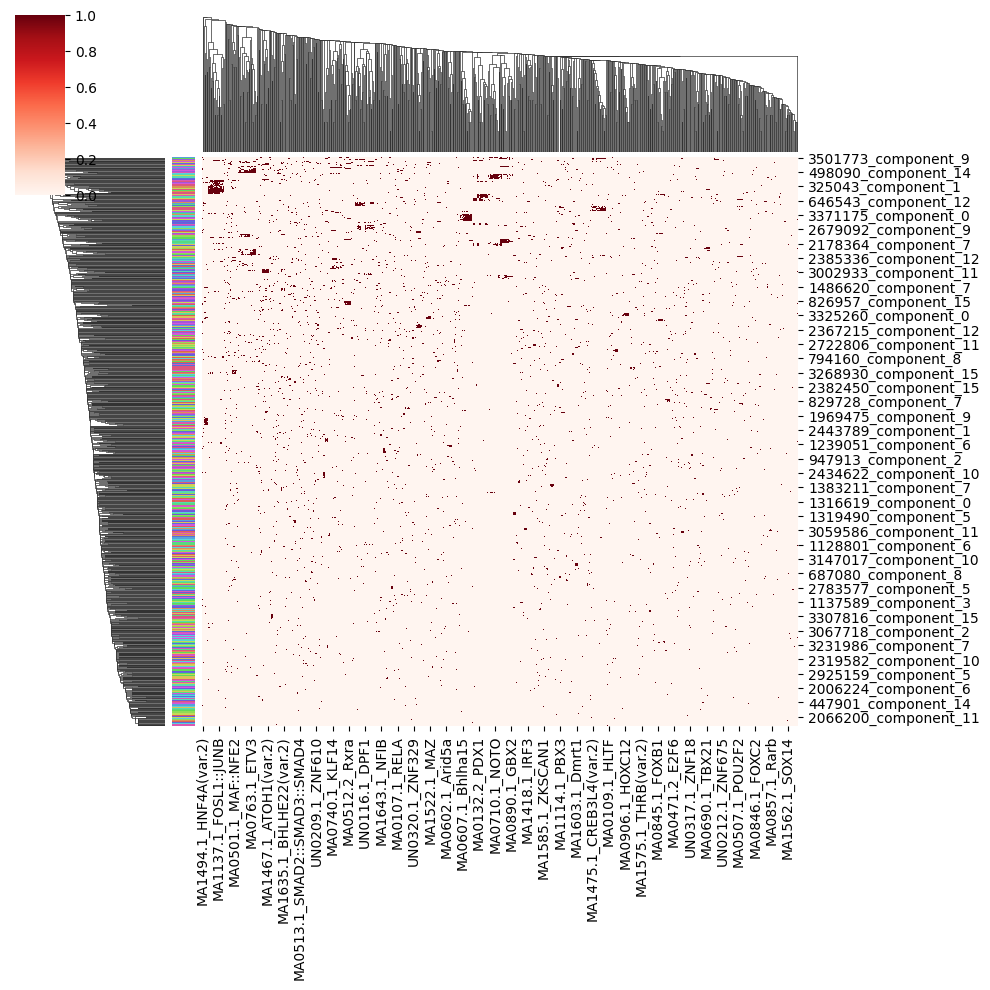

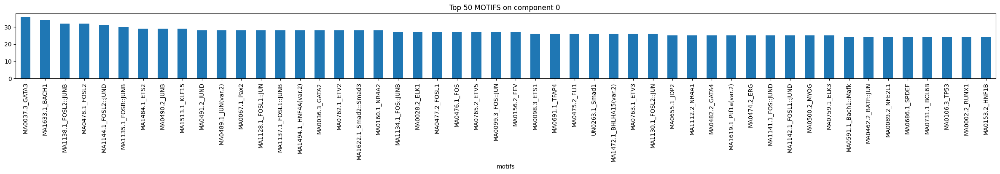

In [14]:
def motifs_from_fasta(fasta):
    print ('Computing Motifs....')
    !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
    df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
    generate_heatmap_motifs(df_results_seq_guime)

    df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.title('Top 50 MOTIFS on component 0 ')
    plt.show()
    return df_results_seq_guime_count_out

# df_results_seq_guime_count wil be used to compute the motifs distances
df_results_seq_guime_count = motifs_from_fasta('fastq_train_component.fasta')

In [15]:
dna_alphabet = ['A', 'C', 'T', 'G']
x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['raw_sequence']) if 'N' not in x ])
X_train = x_train_seq
X_train = np.array([x.T.tolist()  for x in X_train])
X_train[X_train == 0] = -1
X_train.shape

/tmp/ipykernel_246567/853115864.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['raw_sequence']) if 'N' not in x ])


  0%|          | 0/1000 [00:00<?, ?it/s]

(1000, 4, 200)

## OVERFIT

In [16]:
# #Case want to test overfiiting (1500epochs)
# X_OVERFIT = np.array(X_train[0].tolist() * 200).reshape(-1,4,200)
# X_train = X_OVERFIT

# Train initialize and Training loop

In [18]:
batch_size = 34
seq_dataset = SequenceDataset(ims=X_train)
train_dl = DataLoader(seq_dataset, batch_size, shuffle=True, num_workers=3, pin_memory=True)
#show_seq(train_dl)

In [25]:
timesteps = 300

# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.05)
#betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )


# define alphas 
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
#sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod) 



# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

0


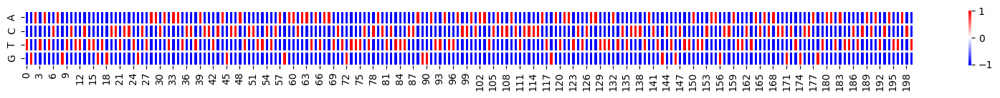

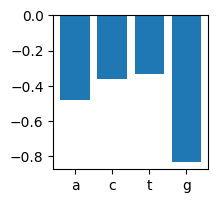

10


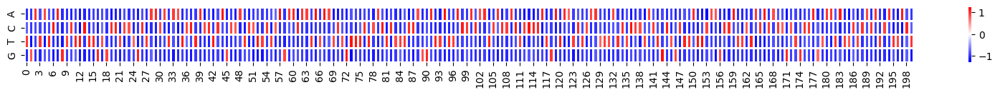

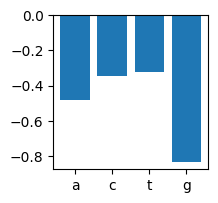

20


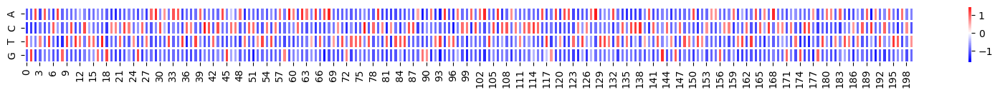

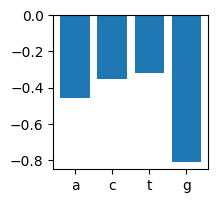

30


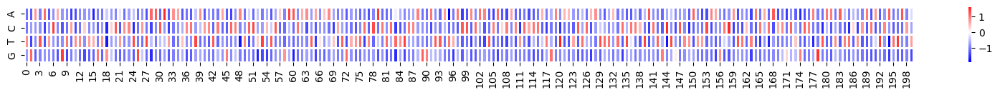

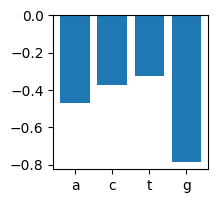

40


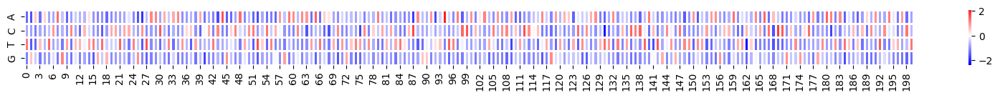

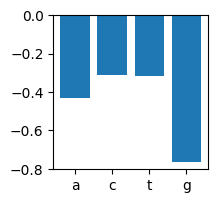

50


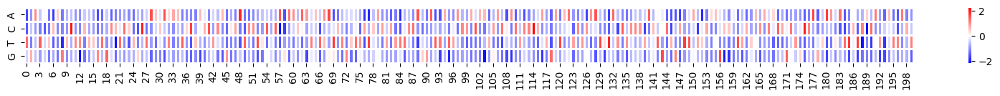

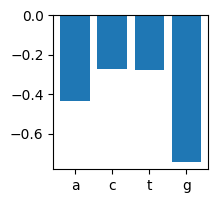

60


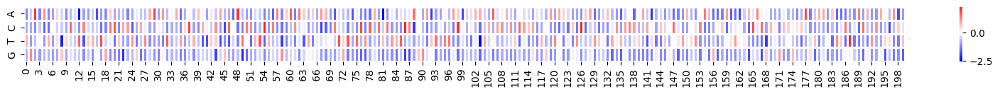

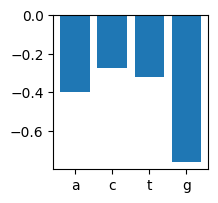

70


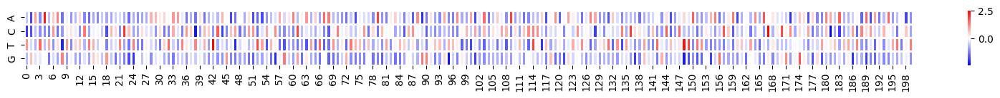

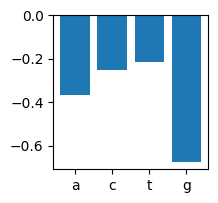

80


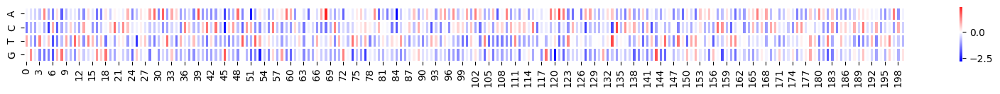

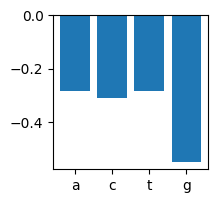

90


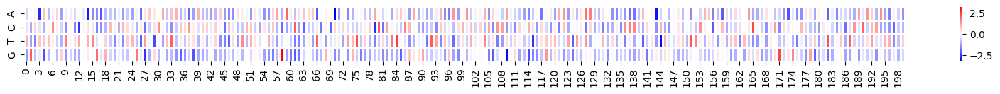

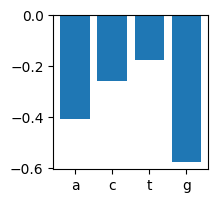

100


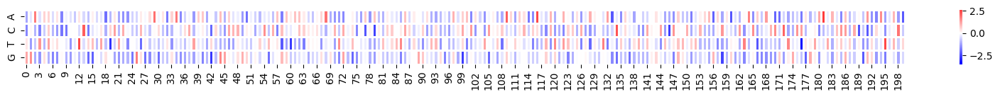

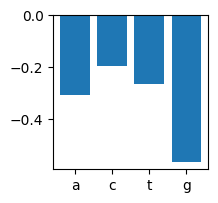

110


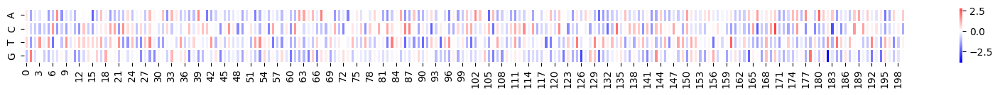

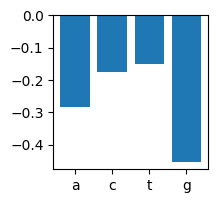

120


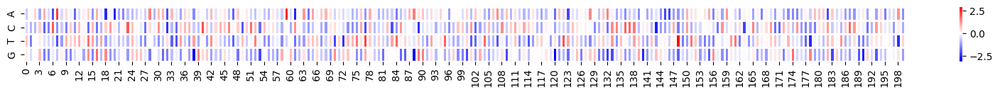

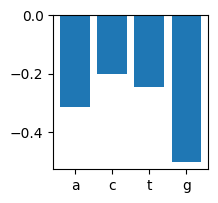

130


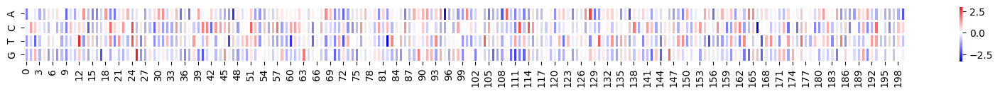

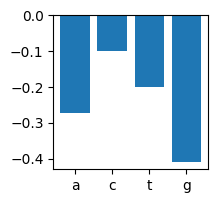

140


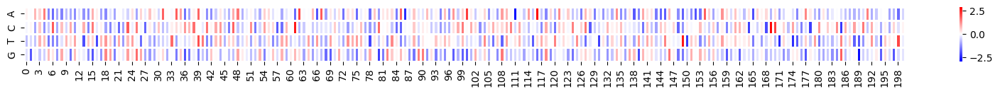

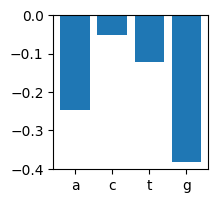

150


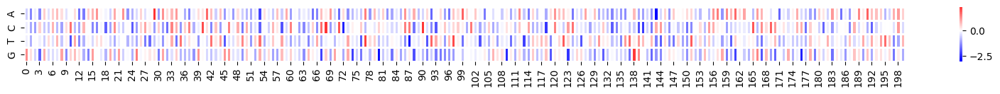

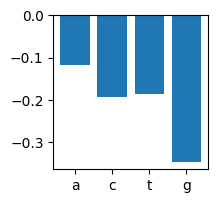

160


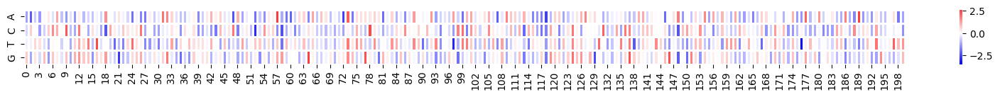

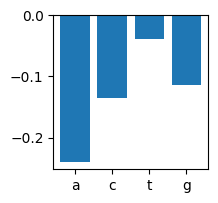

170


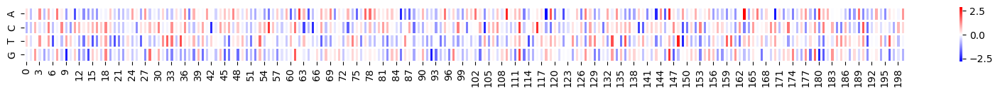

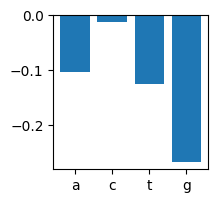

180


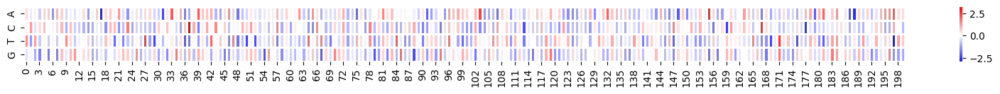

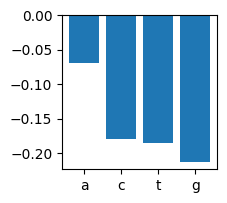

190


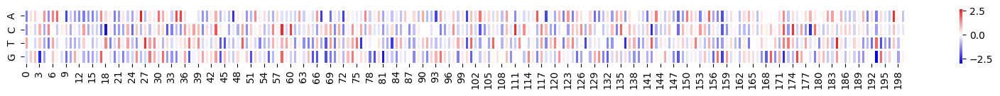

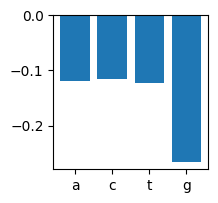

200


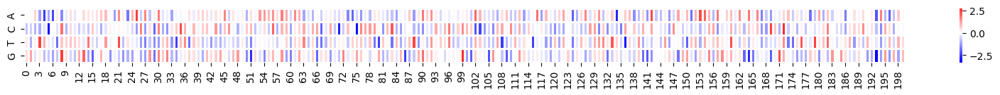

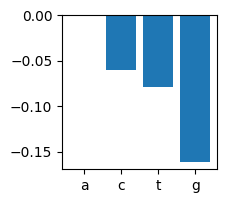

210


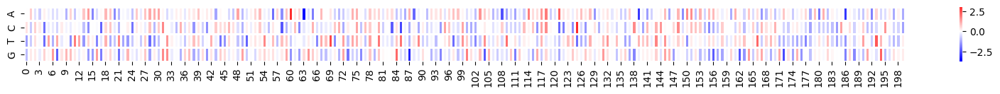

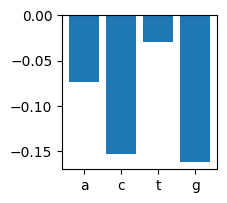

220


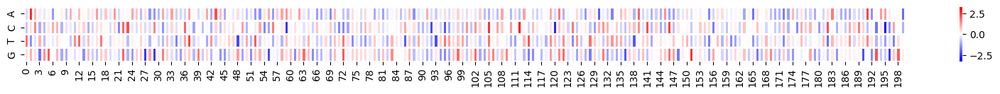

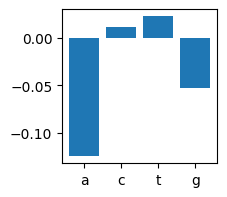

230


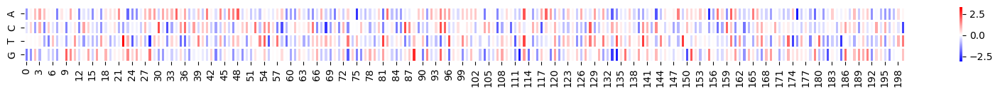

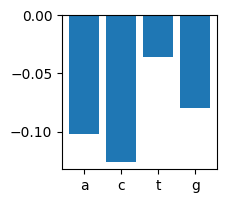

240


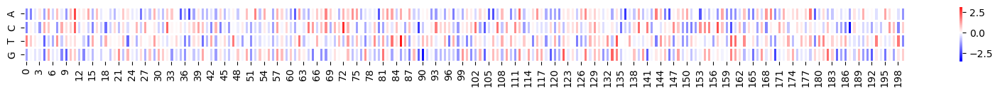

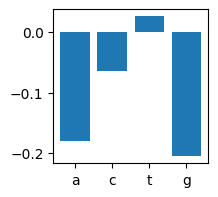

250


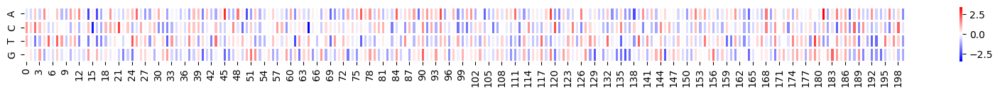

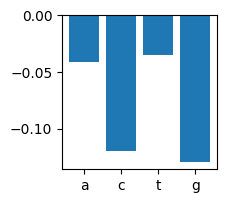

260


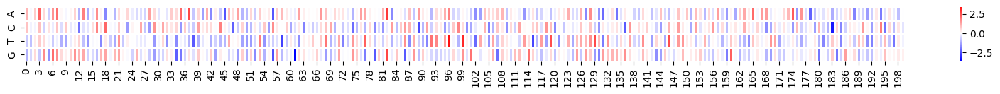

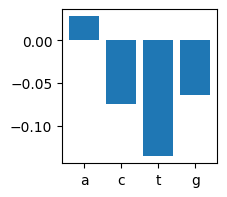

270


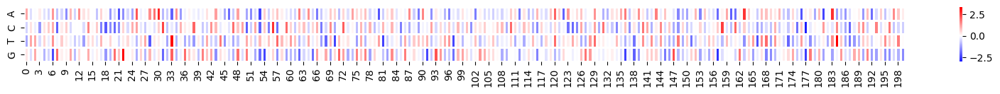

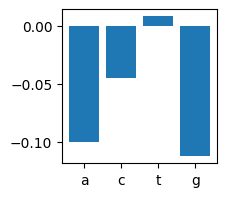

280


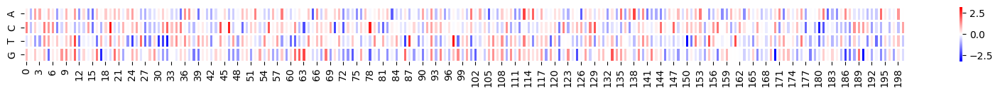

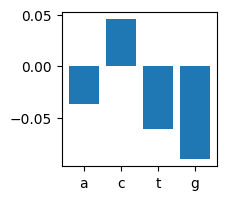

290


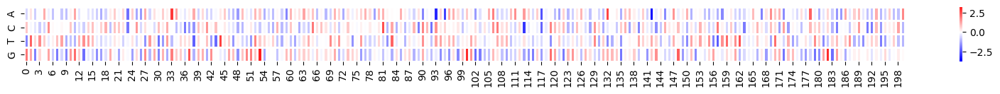

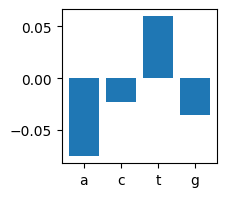

In [26]:
#Ploting images for a  foward pass example
for img_x_show in train_dl:
  
  for i in range(0,timesteps):
    if (i % 10) == 0:
      print (i)
      image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
      image_use_numpy = image_use.numpy()
      
      plt.rcParams["figure.figsize"] = (20,1)
      pd_seq = pd.DataFrame(image_use_numpy.reshape(4,200))
      
      pd_seq.index = nucleotides
      sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
      plt.show()
      plt.rcParams["figure.figsize"] = (2,2)

      plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
      plt.show()


  break


In [112]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [113]:

print (device)
image_size = 200
channels = 1





model = Unet_lucas(

    dim = 200,
        channels = 1,
    dim_mults = (1,2,4),
  resnet_block_groups = 1,


).cuda()

# model = Classifier() # 2d conv

model.to(device)

optimizer = Adam(model.parameters(), lr=1e-4)

cuda
200 init_dim
final 200 1 Conv2d(200, 1, kernel_size=(1, 1), stride=(1, 1))


/tmp/ipykernel_182858/3027471842.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm_notebook(range(epochs)):


  0%|          | 0/10000 [00:00<?, ?it/s]

 Epoch 0 Loss: 0.15944601595401764
 Epoch 10 Loss: 0.05003177747130394
 Epoch 20 Loss: 0.05874423310160637
 Epoch 30 Loss: 0.09193731844425201
 Epoch 40 Loss: 0.12028711289167404
 Epoch 50 Loss: 0.021038636565208435
 Epoch 60 Loss: 0.048277925699949265
 Epoch 70 Loss: 0.04246417433023453
 Epoch 80 Loss: 0.017691917717456818
 Epoch 90 Loss: 0.006574119906872511
 Epoch 100 Loss: 0.013881648890674114
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

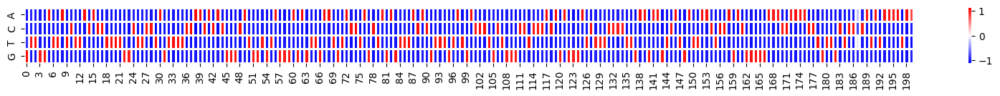

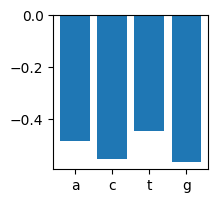

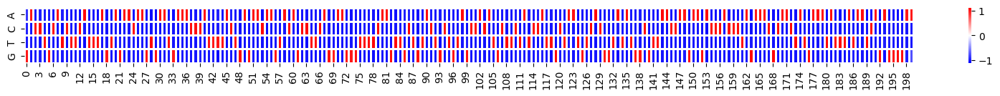

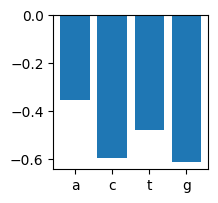

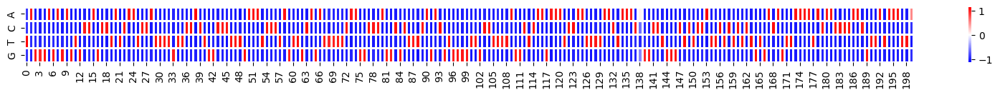

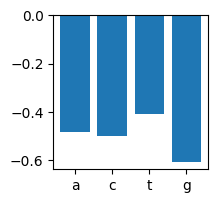

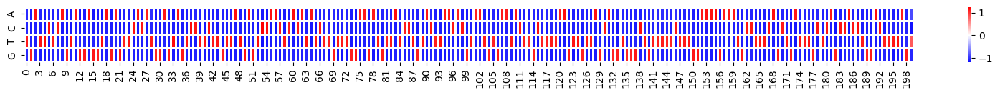

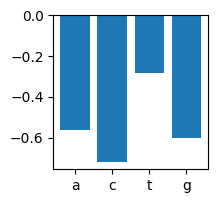

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.51 sequences/s]


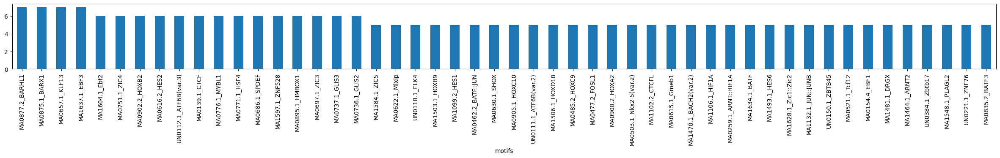

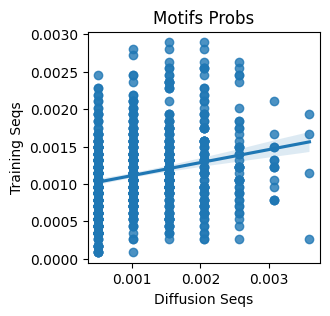

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001025,0.001052
1,MA0106.3_TP53,0.001025,0.002104
2,MA0816.1_Ascl2,0.002049,0.001490
3,MA0831.2_TFE3,0.000512,0.001666
4,MA0635.1_BARHL2,0.001025,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000512,0.001315
878,MA1538.1_NR2F1(var.3),0.001537,0.000877
879,MA0608.1_Creb3l2,0.000512,0.001841
880,MA1530.1_NKX6-3,0.000512,0.000701


0.22056649898970904 KL
 Epoch 110 Loss: 0.01062368880957365
 Epoch 120 Loss: 0.00410460215061903
 Epoch 130 Loss: 0.01550352107733488
 Epoch 140 Loss: 0.004888016730546951
 Epoch 150 Loss: 0.01872626133263111
 Epoch 160 Loss: 0.051542479544878006
 Epoch 170 Loss: 0.11595439165830612
 Epoch 180 Loss: 0.11327654123306274
 Epoch 190 Loss: 0.009783661924302578
 Epoch 200 Loss: 0.024265872314572334
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

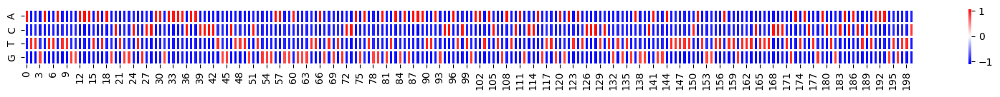

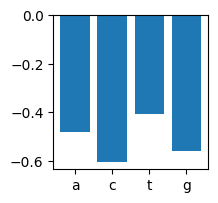

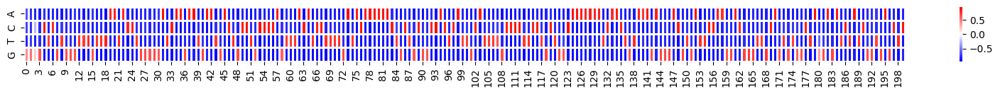

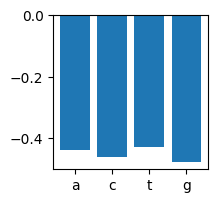

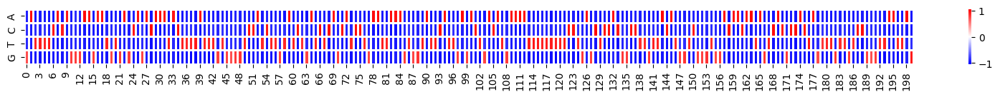

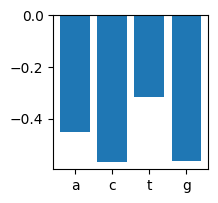

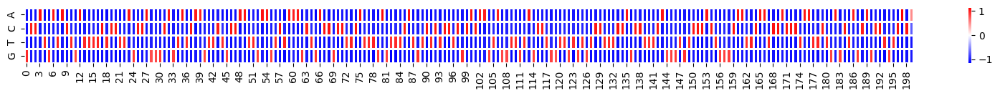

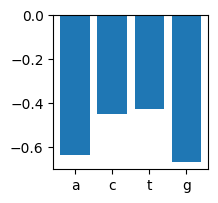

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:08<00:00, 24.30 sequences/s]


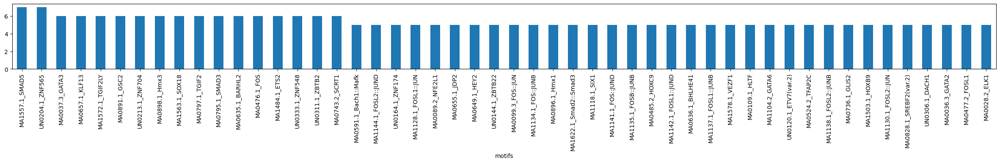

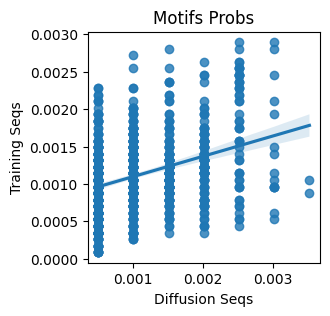

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001508,0.001052
1,MA0106.3_TP53,0.000503,0.002104
2,MA0816.1_Ascl2,0.001005,0.001490
3,MA0831.2_TFE3,0.001005,0.001666
4,MA0635.1_BARHL2,0.003015,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001005,0.001315
878,MA1538.1_NR2F1(var.3),0.001005,0.000877
879,MA0608.1_Creb3l2,0.000503,0.001841
880,MA1530.1_NKX6-3,0.001508,0.000701


0.18230969416296613 KL
 Epoch 210 Loss: 0.05484700947999954
 Epoch 220 Loss: 0.01976899243891239
 Epoch 230 Loss: 0.08361560106277466
 Epoch 240 Loss: 0.10877086222171783
 Epoch 250 Loss: 0.004269481170922518
 Epoch 260 Loss: 0.026962222531437874
 Epoch 270 Loss: 0.029881564900279045
 Epoch 280 Loss: 0.002756698988378048
 Epoch 290 Loss: 0.01013957243412733
 Epoch 300 Loss: 0.02630196139216423
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

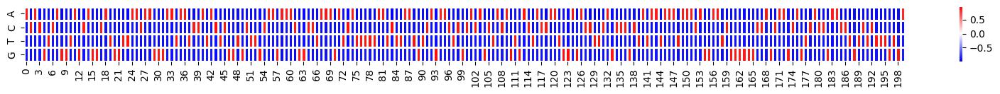

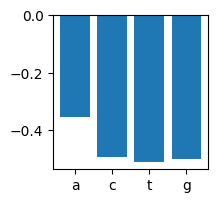

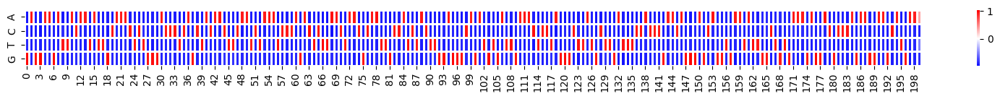

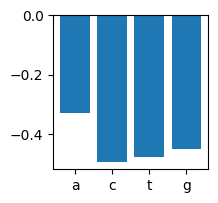

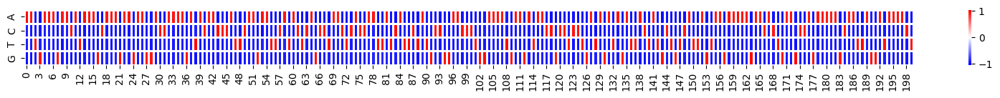

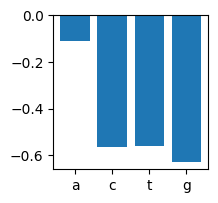

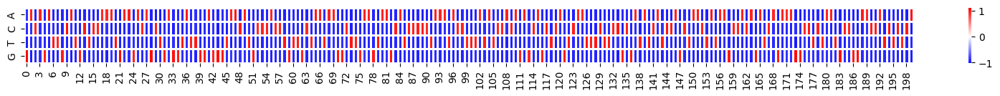

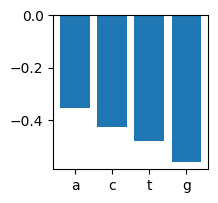

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 33.95 sequences/s]


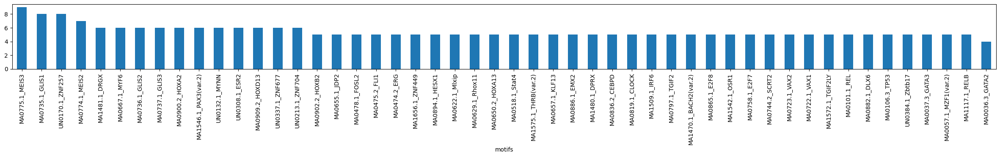

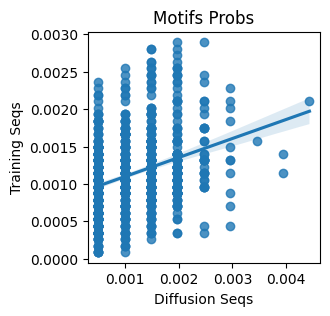

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000493,0.001052
1,MA0106.3_TP53,0.002465,0.002104
2,MA0816.1_Ascl2,0.000493,0.001490
3,MA0831.2_TFE3,0.001972,0.001666
4,MA0635.1_BARHL2,0.001972,0.000964
...,...,...,...
877,MA1538.1_NR2F1(var.3),0.000986,0.000877
878,MA0608.1_Creb3l2,0.000986,0.001841
879,MA1654.1_ZNF16,0.000493,0.001315
880,MA1530.1_NKX6-3,0.000493,0.000701


0.18297245585722738 KL
 Epoch 310 Loss: 0.10280060023069382
 Epoch 320 Loss: 0.05327662453055382
 Epoch 330 Loss: 0.009532381780445576
 Epoch 340 Loss: 0.0029862348455935717
 Epoch 350 Loss: 0.005762728396803141
 Epoch 360 Loss: 0.004359049256891012
 Epoch 370 Loss: 0.031034639105200768
 Epoch 380 Loss: 0.007846617139875889
 Epoch 390 Loss: 0.042841214686632156
 Epoch 400 Loss: 0.0043588439002633095
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

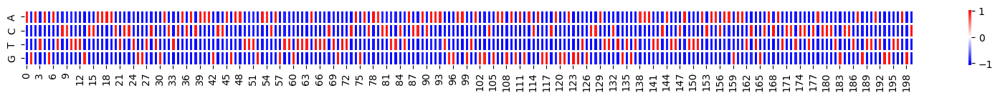

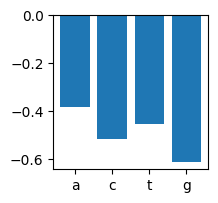

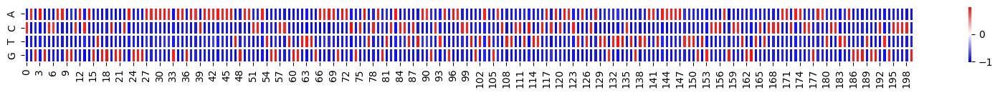

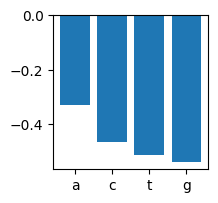

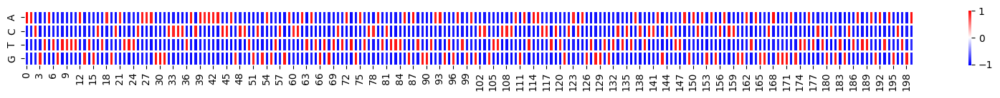

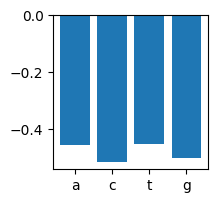

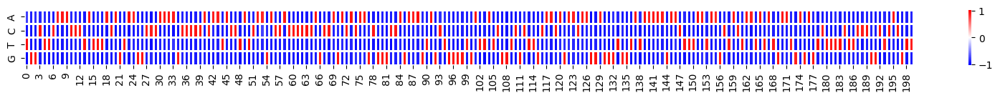

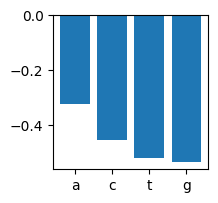

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.64 sequences/s]


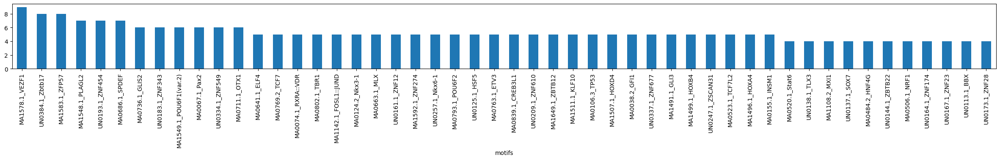

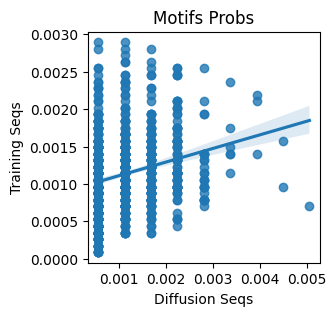

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002804,0.001052
1,MA0106.3_TP53,0.002804,0.002104
2,MA0816.1_Ascl2,0.001122,0.001490
3,MA0831.2_TFE3,0.000561,0.001666
4,MA0635.1_BARHL2,0.000561,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001683,0.001315
878,MA1538.1_NR2F1(var.3),0.000561,0.000877
879,MA0608.1_Creb3l2,0.000561,0.001841
880,MA1530.1_NKX6-3,0.001122,0.000701


0.19896371317297543 KL
 Epoch 410 Loss: 0.02112642489373684
 Epoch 420 Loss: 0.005993487313389778
 Epoch 430 Loss: 0.01094583049416542
 Epoch 440 Loss: 0.049757663160562515
 Epoch 450 Loss: 0.016084235161542892
 Epoch 460 Loss: 0.013855495490133762
 Epoch 470 Loss: 0.10008534044027328
 Epoch 480 Loss: 0.10066808015108109
 Epoch 490 Loss: 0.10533802211284637
 Epoch 500 Loss: 0.005075204651802778
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

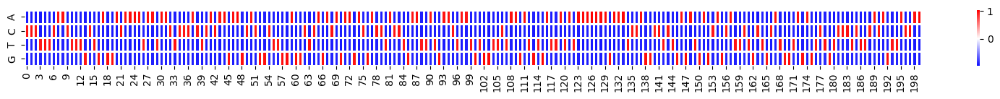

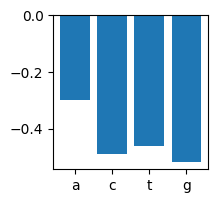

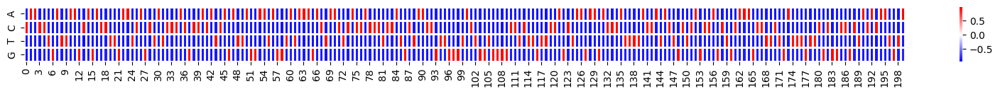

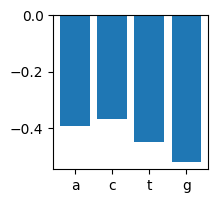

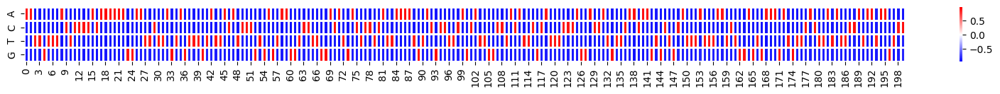

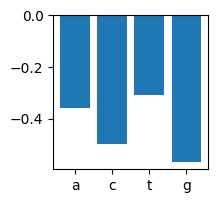

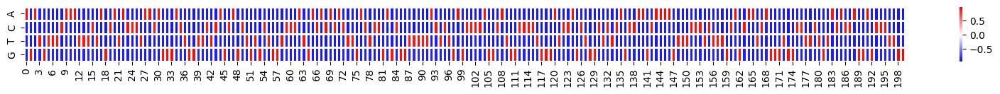

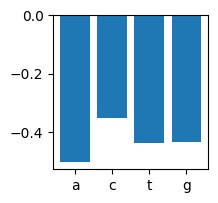

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.57 sequences/s]


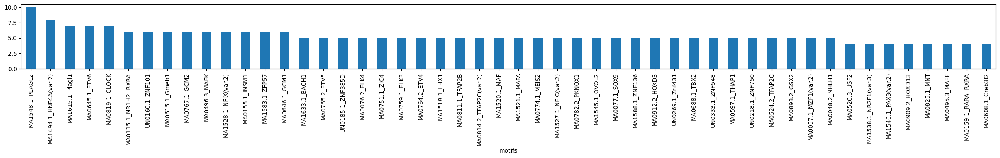

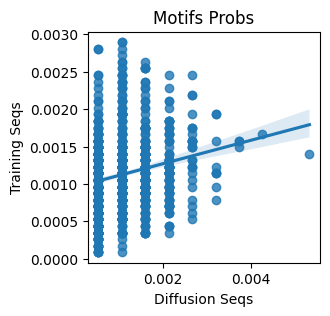

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001065,0.001052
1,MA0106.3_TP53,0.001597,0.002104
2,MA0816.1_Ascl2,0.001065,0.001490
3,MA0831.2_TFE3,0.001065,0.001666
4,MA0635.1_BARHL2,0.001065,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000532,0.001315
878,MA1538.1_NR2F1(var.3),0.002130,0.000877
879,MA0608.1_Creb3l2,0.002130,0.001841
880,MA1530.1_NKX6-3,0.001065,0.000701


0.20980994479813325 KL
 Epoch 510 Loss: 0.01817057654261589
 Epoch 520 Loss: 0.020432285964488983
 Epoch 530 Loss: 0.004533867817372084
 Epoch 540 Loss: 0.10453829169273376
 Epoch 550 Loss: 0.07667513936758041
 Epoch 560 Loss: 0.11253450810909271
 Epoch 570 Loss: 0.014653191901743412
 Epoch 580 Loss: 0.01011152658611536
 Epoch 590 Loss: 0.06647134572267532
 Epoch 600 Loss: 0.08565463125705719
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

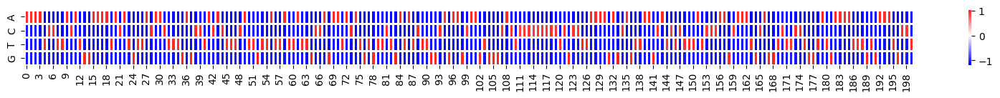

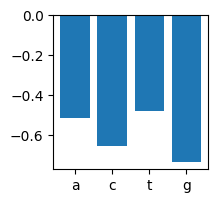

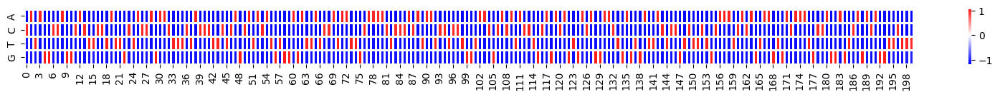

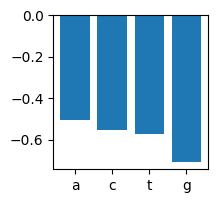

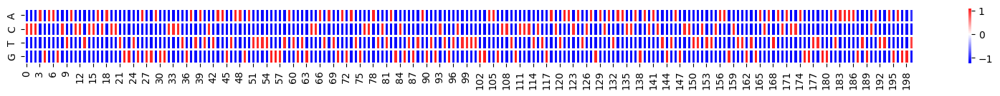

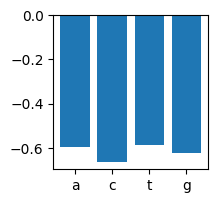

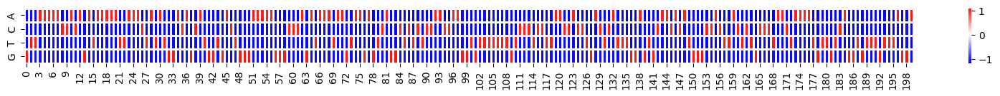

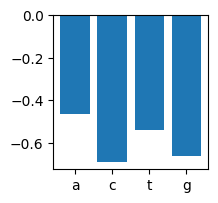

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.29 sequences/s]


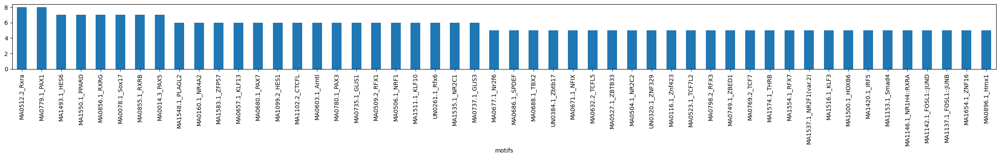

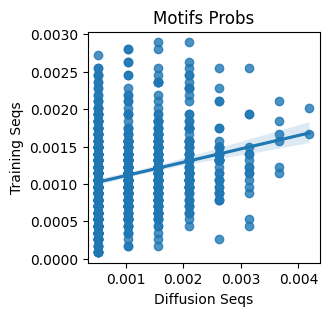

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002096,0.001052
1,MA0106.3_TP53,0.001572,0.002104
2,MA0816.1_Ascl2,0.000524,0.001490
3,MA0831.2_TFE3,0.001572,0.001666
4,MA0635.1_BARHL2,0.000524,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001048,0.001315
878,MA1538.1_NR2F1(var.3),0.001572,0.000877
879,MA0608.1_Creb3l2,0.001572,0.001841
880,MA1530.1_NKX6-3,0.001048,0.000701


0.21105713626105166 KL
 Epoch 610 Loss: 0.01272719819098711
 Epoch 620 Loss: 0.10737115889787674
 Epoch 630 Loss: 0.11238645017147064
 Epoch 640 Loss: 0.031196828931570053
 Epoch 650 Loss: 0.021592216566205025
 Epoch 660 Loss: 0.002866655122488737
 Epoch 670 Loss: 0.08934155851602554
 Epoch 680 Loss: 0.10797001421451569
 Epoch 690 Loss: 0.06228024140000343
 Epoch 700 Loss: 0.045256923884153366
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

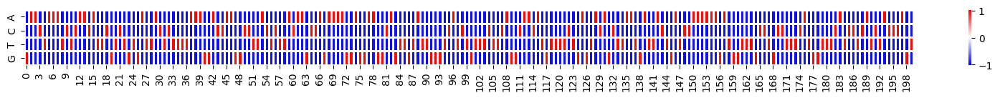

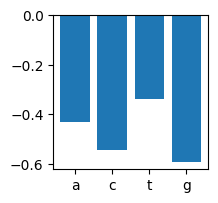

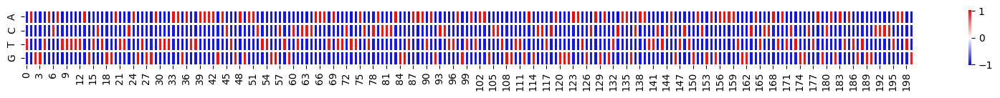

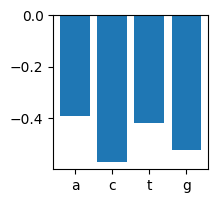

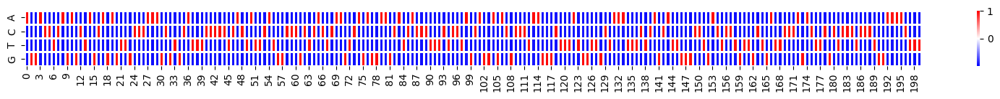

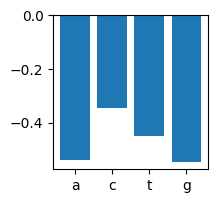

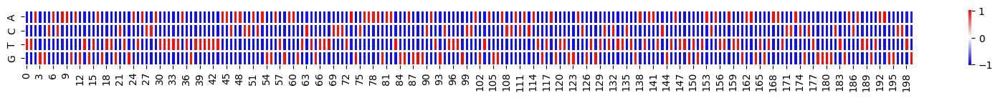

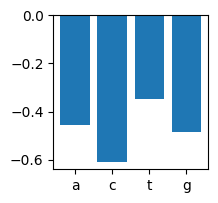

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.71 sequences/s]


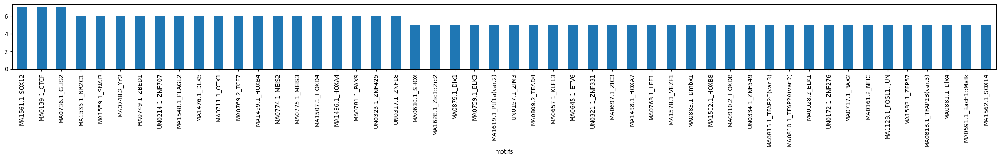

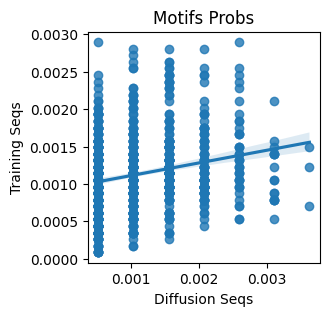

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002073,0.001052
1,MA0106.3_TP53,0.001036,0.002104
2,MA0816.1_Ascl2,0.001036,0.001490
3,MA0831.2_TFE3,0.002073,0.001666
4,MA0635.1_BARHL2,0.000518,0.000964
...,...,...,...
877,MA1538.1_NR2F1(var.3),0.001036,0.000877
878,MA0608.1_Creb3l2,0.001036,0.001841
879,MA1654.1_ZNF16,0.000518,0.001315
880,MA1530.1_NKX6-3,0.000518,0.000701


0.21175515491479954 KL
 Epoch 710 Loss: 0.07695812731981277
 Epoch 720 Loss: 0.039904944598674774
 Epoch 730 Loss: 0.004824209026992321
 Epoch 740 Loss: 0.10103904455900192
 Epoch 750 Loss: 0.008523593656718731
 Epoch 760 Loss: 0.042273521423339844
 Epoch 770 Loss: 0.005939487833529711
 Epoch 780 Loss: 0.009866911917924881
 Epoch 790 Loss: 0.01967543736100197
 Epoch 800 Loss: 0.011421563103795052
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

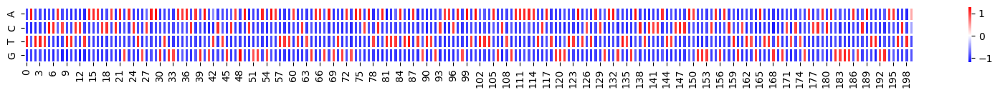

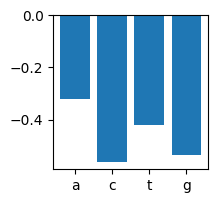

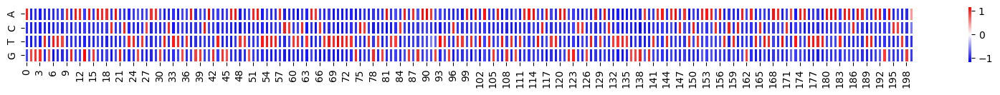

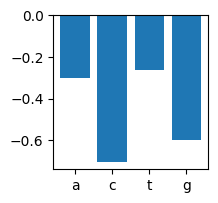

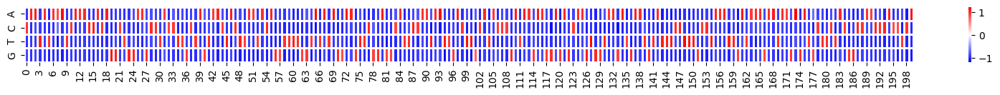

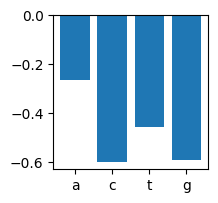

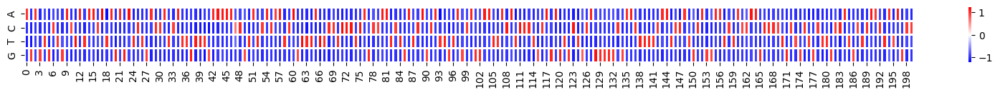

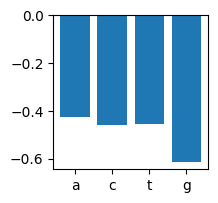

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 33.47 sequences/s]


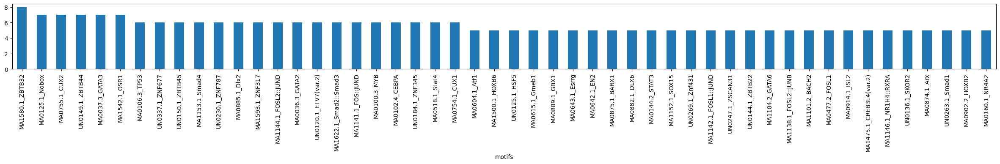

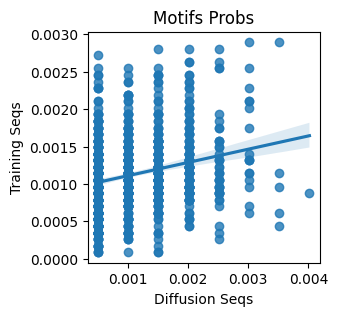

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002511,0.001052
1,MA0106.3_TP53,0.003014,0.002104
2,MA0816.1_Ascl2,0.002009,0.001490
3,MA0831.2_TFE3,0.001005,0.001666
4,MA0635.1_BARHL2,0.000502,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002009,0.001315
878,MA1538.1_NR2F1(var.3),0.002009,0.000877
879,MA0608.1_Creb3l2,0.000502,0.001841
880,MA1530.1_NKX6-3,0.001005,0.000701


0.22196679000462705 KL
 Epoch 810 Loss: 0.019903551787137985
 Epoch 820 Loss: 0.008658121339976788
 Epoch 830 Loss: 0.03798473998904228
 Epoch 840 Loss: 0.00873295683413744
 Epoch 850 Loss: 0.06506969779729843
 Epoch 860 Loss: 0.0063242665491998196
 Epoch 870 Loss: 0.041379403322935104
 Epoch 880 Loss: 0.010225812904536724
 Epoch 890 Loss: 0.09299445152282715
 Epoch 900 Loss: 0.07699494063854218
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

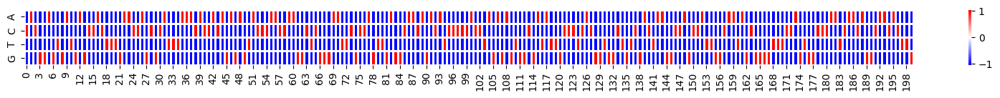

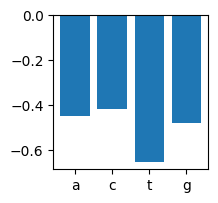

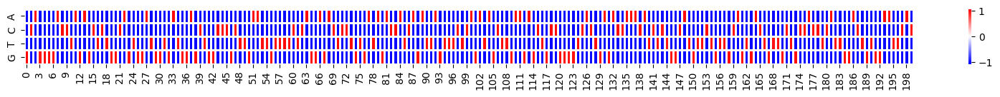

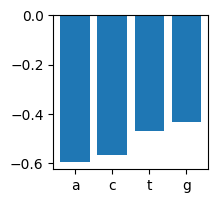

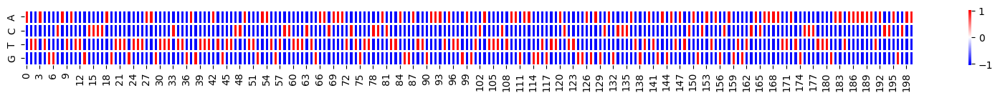

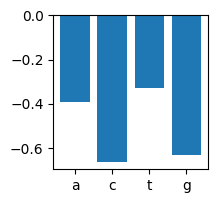

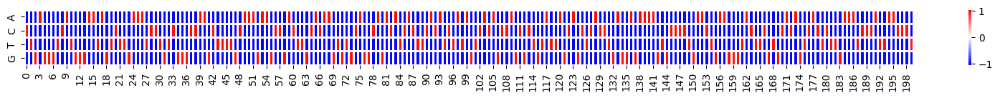

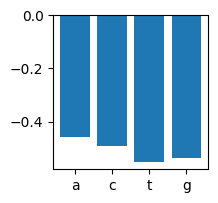

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.99 sequences/s]


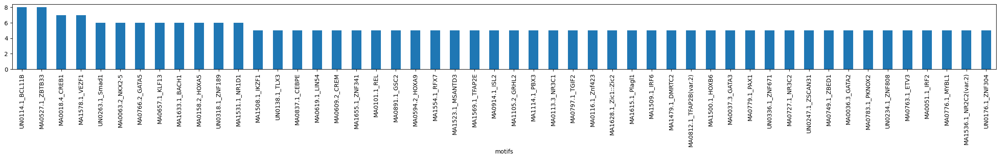

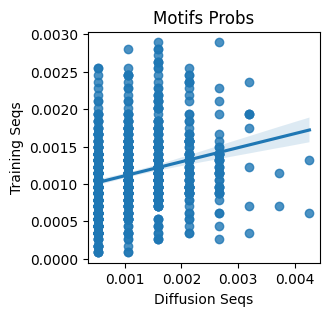

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001064,0.001052
1,MA0106.3_TP53,0.001597,0.002104
2,MA0816.1_Ascl2,0.000532,0.001490
3,MA0831.2_TFE3,0.000532,0.001666
4,MA0635.1_BARHL2,0.000532,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001064,0.001315
878,MA1538.1_NR2F1(var.3),0.000532,0.000877
879,MA0608.1_Creb3l2,0.001597,0.001841
880,MA1530.1_NKX6-3,0.000532,0.000701


0.20981619718204242 KL
 Epoch 910 Loss: 0.056459154933691025
 Epoch 920 Loss: 0.0027326957788318396
 Epoch 930 Loss: 0.04690801724791527
 Epoch 940 Loss: 0.024048684164881706
 Epoch 950 Loss: 0.001831462373957038
 Epoch 960 Loss: 0.09048826992511749
 Epoch 970 Loss: 0.025149822235107422
 Epoch 980 Loss: 0.10984930396080017
 Epoch 990 Loss: 0.0028831828385591507
 Epoch 1000 Loss: 0.0010356692364439368
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

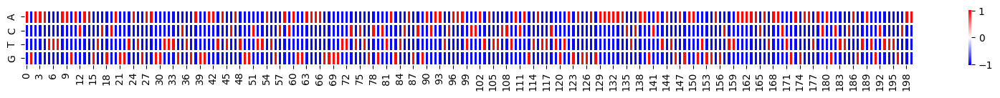

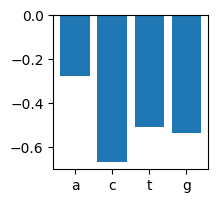

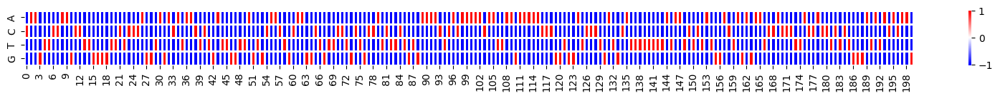

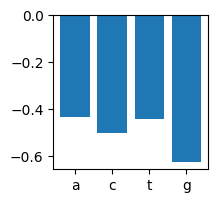

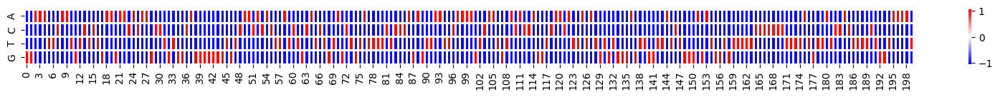

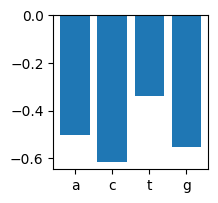

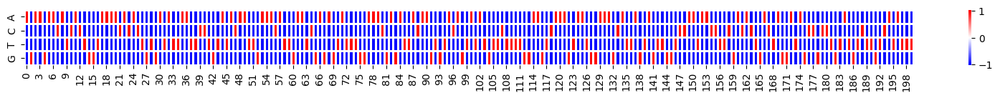

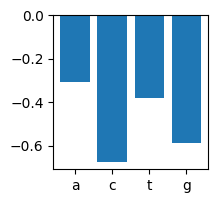

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.11 sequences/s]


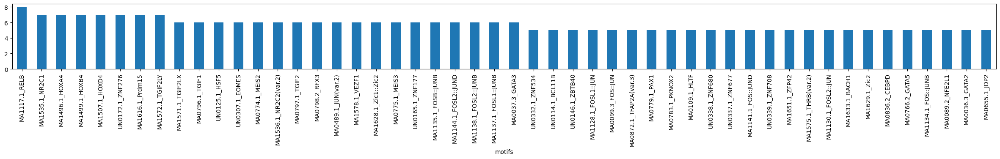

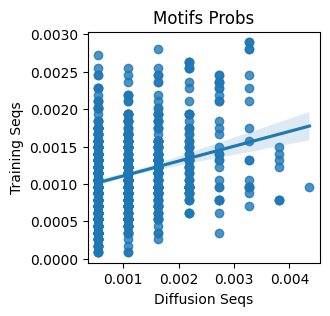

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.003272,0.001052
1,MA0106.3_TP53,0.000545,0.002104
2,MA0816.1_Ascl2,0.000545,0.001490
3,MA0831.2_TFE3,0.001091,0.001666
4,MA0635.1_BARHL2,0.001091,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001091,0.001315
878,MA1538.1_NR2F1(var.3),0.000545,0.000877
879,MA0608.1_Creb3l2,0.001091,0.001841
880,MA1530.1_NKX6-3,0.000545,0.000701


0.20969517479197594 KL
 Epoch 1010 Loss: 0.09624312072992325
 Epoch 1020 Loss: 0.006245574913918972
 Epoch 1030 Loss: 0.034949250519275665
 Epoch 1040 Loss: 0.101761095225811
 Epoch 1050 Loss: 0.016816863790154457
 Epoch 1060 Loss: 0.10750937461853027
 Epoch 1070 Loss: 0.002313275821506977
 Epoch 1080 Loss: 0.0038835592567920685
 Epoch 1090 Loss: 0.0637161135673523
 Epoch 1100 Loss: 0.031207852065563202
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

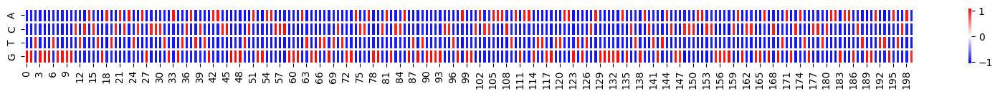

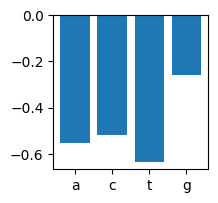

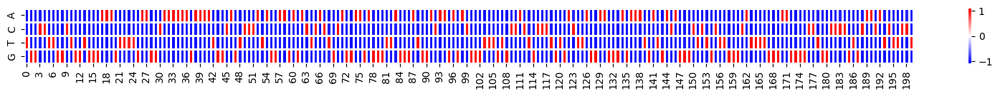

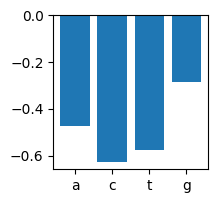

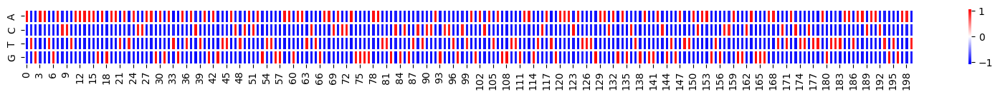

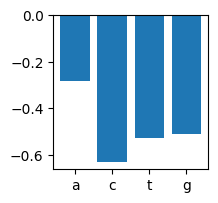

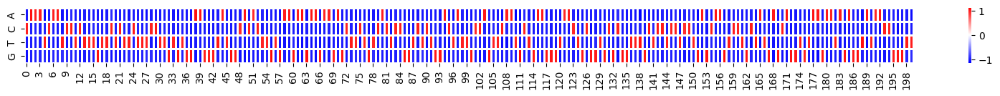

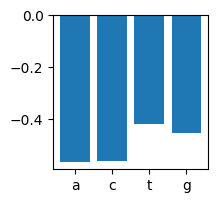

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.12 sequences/s]


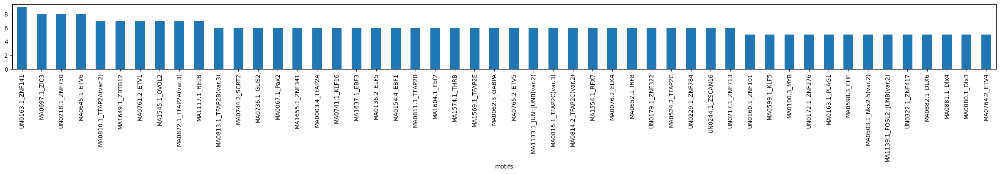

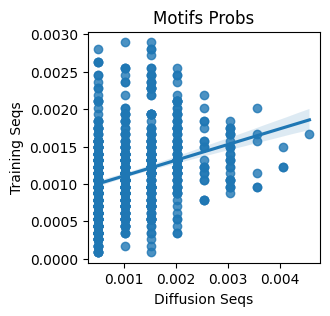

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002541,0.001052
1,MA0106.3_TP53,0.000508,0.002104
2,MA0816.1_Ascl2,0.000508,0.001490
3,MA0831.2_TFE3,0.000508,0.001666
4,MA0635.1_BARHL2,0.000508,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001016,0.001315
878,MA1538.1_NR2F1(var.3),0.001016,0.000877
879,MA0608.1_Creb3l2,0.000508,0.001841
880,MA1530.1_NKX6-3,0.000508,0.000701


0.19834880147263095 KL
 Epoch 1110 Loss: 0.05687849223613739
 Epoch 1120 Loss: 0.012434037402272224
 Epoch 1130 Loss: 0.08090429753065109
 Epoch 1140 Loss: 0.01969272270798683
 Epoch 1150 Loss: 0.07396875321865082
 Epoch 1160 Loss: 0.018094733357429504
 Epoch 1170 Loss: 0.09423521906137466
 Epoch 1180 Loss: 0.005257430486381054
 Epoch 1190 Loss: 0.014514682814478874
 Epoch 1200 Loss: 0.07119374722242355
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

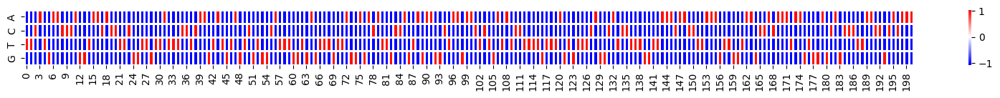

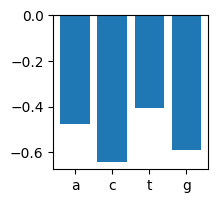

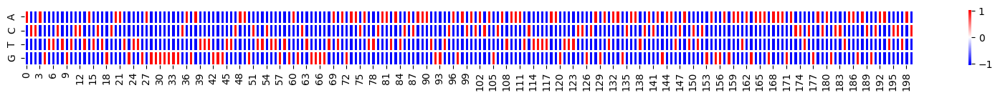

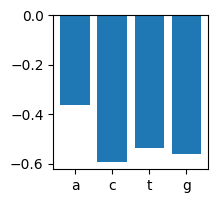

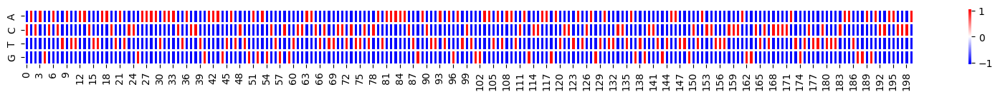

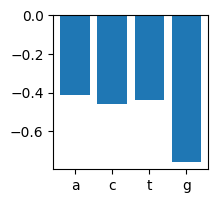

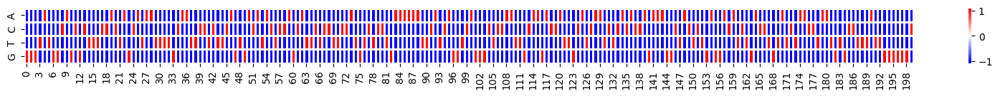

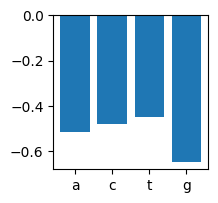

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.94 sequences/s]


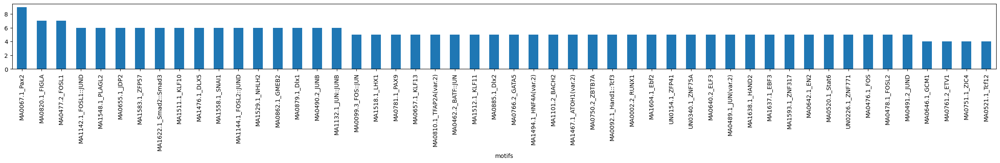

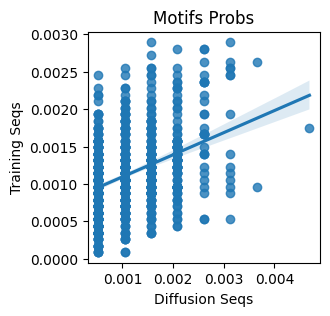

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000521,0.001052
1,MA0106.3_TP53,0.002084,0.002104
2,MA0816.1_Ascl2,0.002084,0.001490
3,MA0831.2_TFE3,0.001042,0.001666
4,MA0635.1_BARHL2,0.001042,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002084,0.001315
878,MA1538.1_NR2F1(var.3),0.001563,0.000877
879,MA0608.1_Creb3l2,0.001042,0.001841
880,MA1530.1_NKX6-3,0.001042,0.000701


0.17370551523287414 KL
 Epoch 1210 Loss: 0.03786567226052284
 Epoch 1220 Loss: 0.009119592607021332
 Epoch 1230 Loss: 0.11209163069725037
 Epoch 1240 Loss: 0.09898003935813904
 Epoch 1250 Loss: 0.0056781950406730175
 Epoch 1260 Loss: 0.048540107905864716
 Epoch 1270 Loss: 0.009523417800664902
 Epoch 1280 Loss: 0.007043539546430111
 Epoch 1290 Loss: 0.02491673082113266
 Epoch 1300 Loss: 0.030486689880490303
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

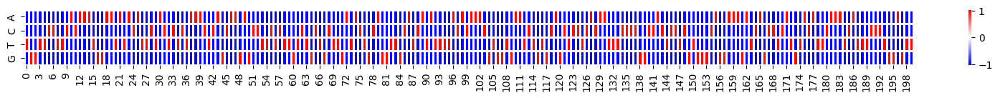

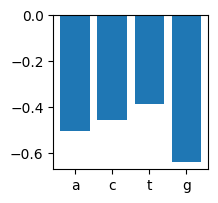

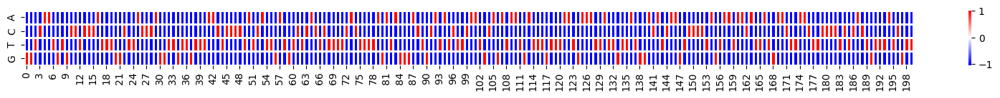

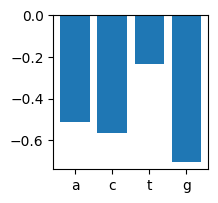

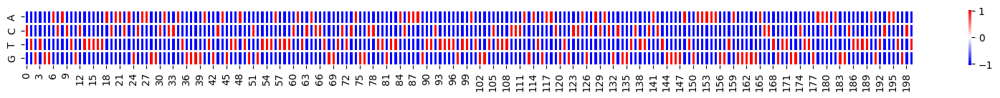

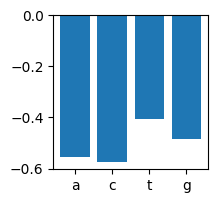

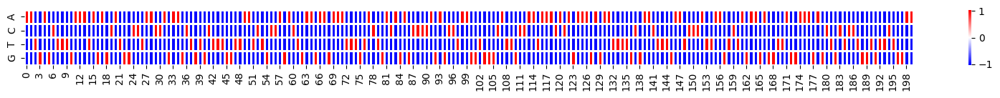

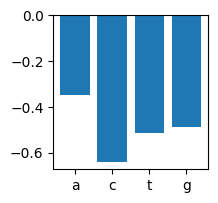

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.91 sequences/s]


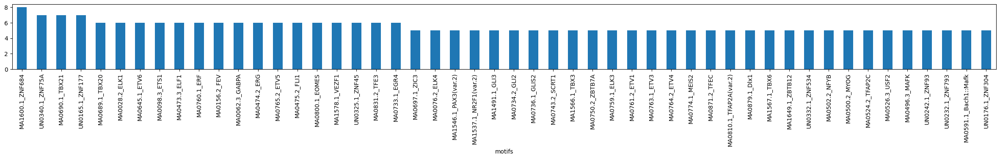

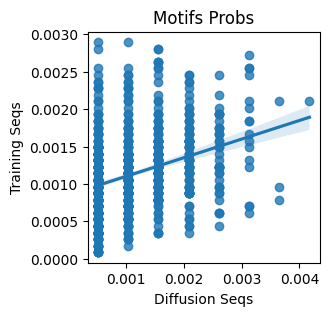

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000522,0.001052
1,MA0106.3_TP53,0.001043,0.002104
2,MA0816.1_Ascl2,0.001043,0.001490
3,MA0831.2_TFE3,0.003130,0.001666
4,MA0635.1_BARHL2,0.000522,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001043,0.001315
878,MA1538.1_NR2F1(var.3),0.001043,0.000877
879,MA0608.1_Creb3l2,0.000522,0.001841
880,MA1530.1_NKX6-3,0.001043,0.000701


0.18301413377942377 KL
 Epoch 1310 Loss: 0.024435320869088173
 Epoch 1320 Loss: 0.011865966953337193
 Epoch 1330 Loss: 0.033780843019485474
 Epoch 1340 Loss: 0.099911630153656
 Epoch 1350 Loss: 0.004267096985131502
 Epoch 1360 Loss: 0.10475389659404755
 Epoch 1370 Loss: 0.0025916732847690582
 Epoch 1380 Loss: 0.005596756003797054
 Epoch 1390 Loss: 0.0030357693322002888
 Epoch 1400 Loss: 0.015834910795092583
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

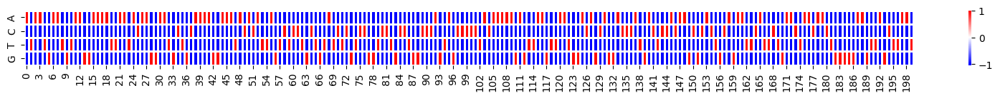

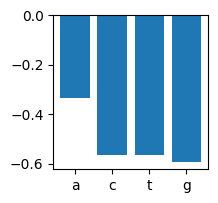

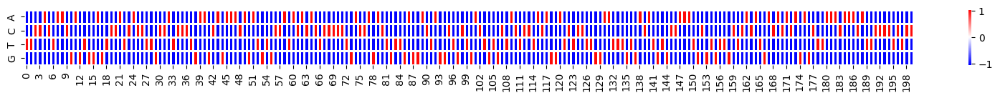

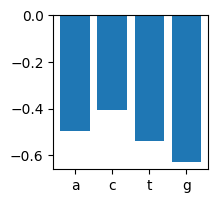

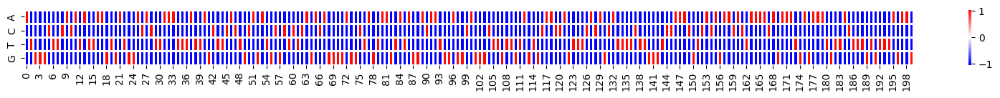

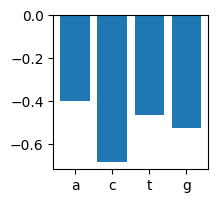

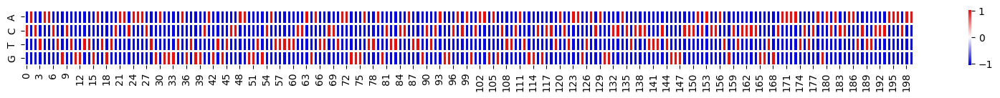

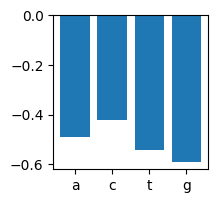

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.77 sequences/s]


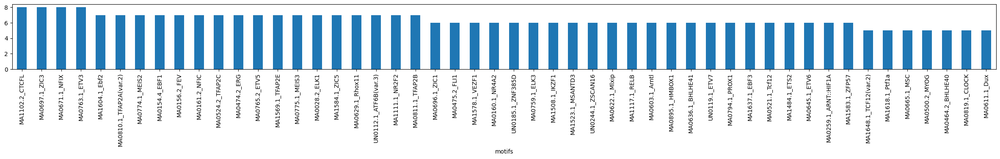

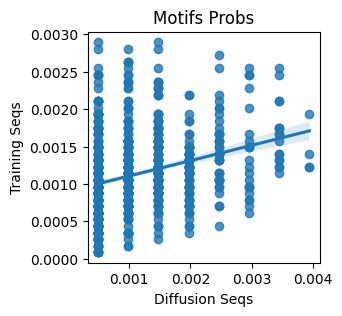

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000493,0.001052
1,MA0106.3_TP53,0.000493,0.002104
2,MA0816.1_Ascl2,0.001478,0.001490
3,MA0831.2_TFE3,0.000985,0.001666
4,MA0635.1_BARHL2,0.000493,0.000964
...,...,...,...
877,MA1538.1_NR2F1(var.3),0.000985,0.000877
878,MA0608.1_Creb3l2,0.000985,0.001841
879,MA1654.1_ZNF16,0.000493,0.001315
880,MA1530.1_NKX6-3,0.000493,0.000701


0.20377434382094678 KL
 Epoch 1410 Loss: 0.054322291165590286
 Epoch 1420 Loss: 0.011508597992360592
 Epoch 1430 Loss: 0.010936162434518337
 Epoch 1440 Loss: 0.0859532281756401
 Epoch 1450 Loss: 0.03396373614668846
 Epoch 1460 Loss: 0.08070190995931625
 Epoch 1470 Loss: 0.03341617062687874
 Epoch 1480 Loss: 0.11071814596652985
 Epoch 1490 Loss: 0.01279617939144373
 Epoch 1500 Loss: 0.012351984158158302
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

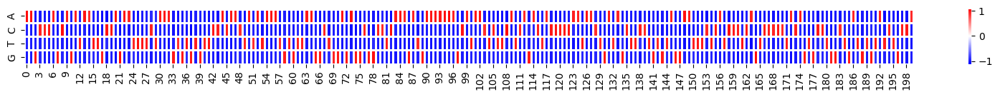

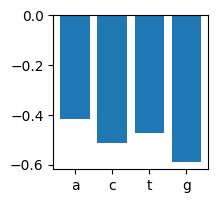

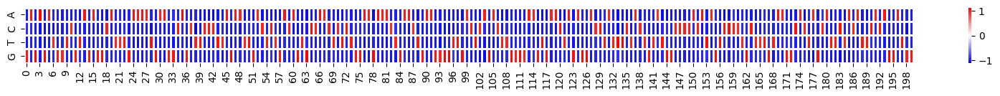

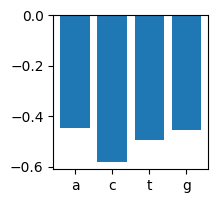

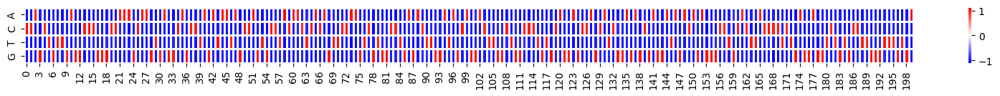

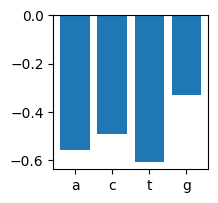

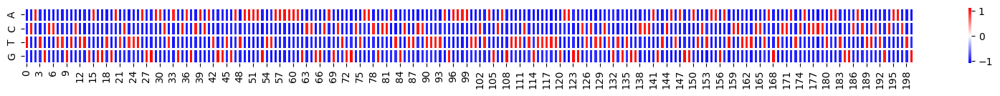

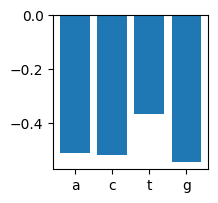

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.76 sequences/s]


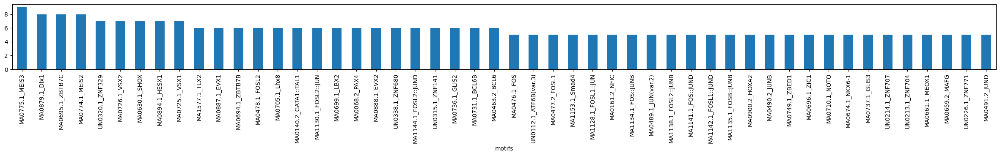

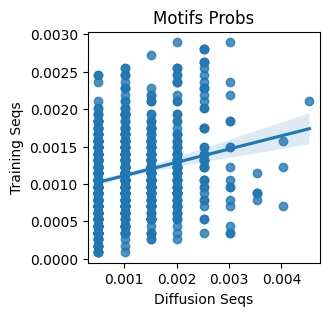

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001512,0.001052
1,MA0106.3_TP53,0.001512,0.002104
2,MA0816.1_Ascl2,0.000504,0.001490
3,MA0831.2_TFE3,0.001512,0.001666
4,MA0635.1_BARHL2,0.000504,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001512,0.001315
878,MA1538.1_NR2F1(var.3),0.000504,0.000877
879,MA0608.1_Creb3l2,0.000504,0.001841
880,MA1530.1_NKX6-3,0.000504,0.000701


0.22222803153070408 KL
 Epoch 1510 Loss: 0.004001792520284653
 Epoch 1520 Loss: 0.09746164828538895
 Epoch 1530 Loss: 0.012907826341688633
 Epoch 1540 Loss: 0.013398456387221813
 Epoch 1550 Loss: 0.004214330576360226
 Epoch 1560 Loss: 0.004353349097073078
 Epoch 1570 Loss: 0.016680723056197166
 Epoch 1580 Loss: 0.027524353936314583
 Epoch 1590 Loss: 0.012170622125267982
 Epoch 1600 Loss: 0.011322256177663803
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

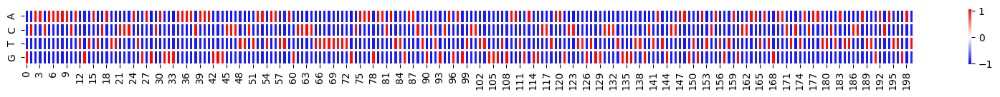

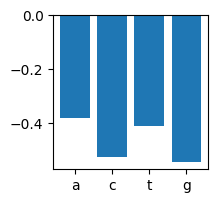

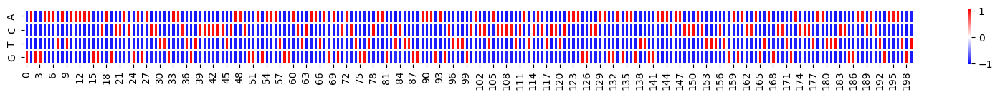

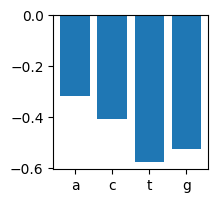

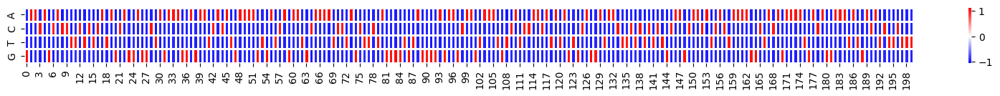

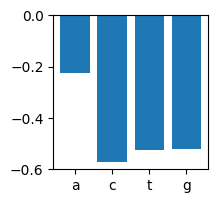

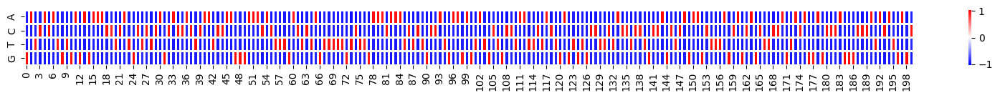

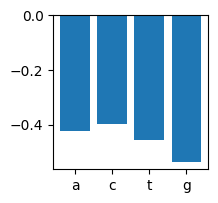

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.46 sequences/s]


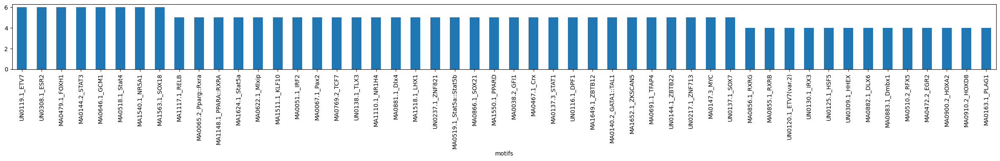

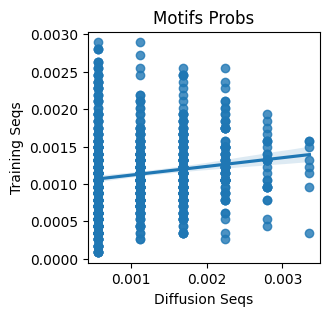

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.00224,0.001052
1,MA0106.3_TP53,0.00112,0.002104
2,MA0816.1_Ascl2,0.00056,0.001490
3,MA0831.2_TFE3,0.00112,0.001666
4,MA0635.1_BARHL2,0.00056,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.00280,0.001315
878,MA1538.1_NR2F1(var.3),0.00224,0.000877
879,MA0608.1_Creb3l2,0.00168,0.001841
880,MA1530.1_NKX6-3,0.00112,0.000701


0.21947405380802826 KL
 Epoch 1610 Loss: 0.008406565524637699
 Epoch 1620 Loss: 0.09384115785360336
 Epoch 1630 Loss: 0.02790677733719349
 Epoch 1640 Loss: 0.11060906201601028
 Epoch 1650 Loss: 0.00740533834323287
 Epoch 1660 Loss: 0.012949482537806034
 Epoch 1670 Loss: 0.10001447051763535
 Epoch 1680 Loss: 0.04705082252621651
 Epoch 1690 Loss: 0.005501804873347282
 Epoch 1700 Loss: 0.035170070827007294
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

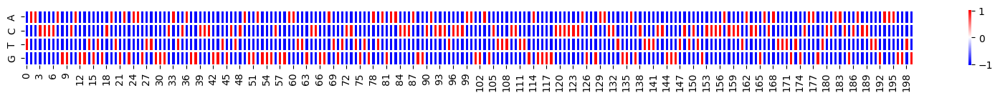

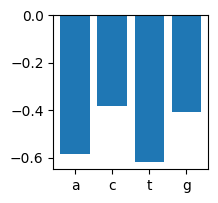

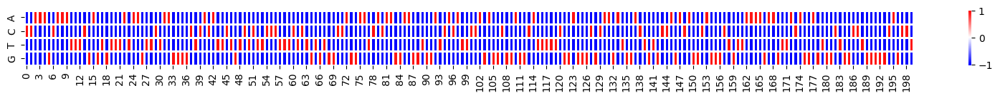

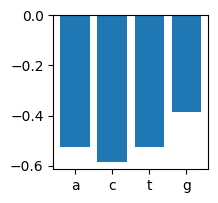

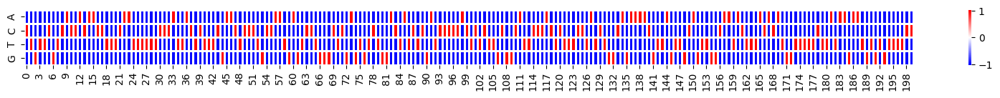

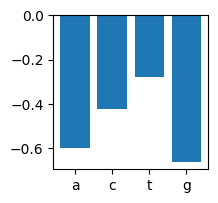

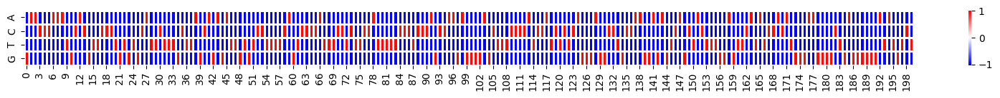

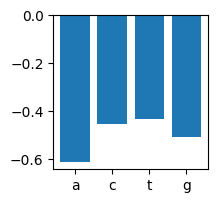

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.09 sequences/s]


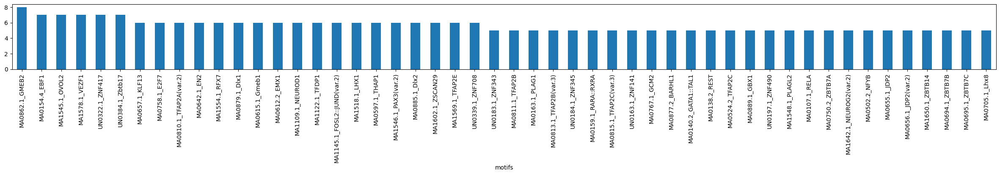

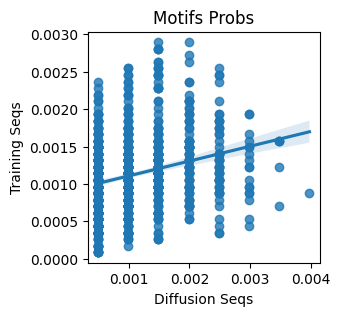

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002485,0.001052
1,MA0106.3_TP53,0.000497,0.002104
2,MA0816.1_Ascl2,0.001491,0.001490
3,MA0831.2_TFE3,0.000497,0.001666
4,MA0635.1_BARHL2,0.001491,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000497,0.001315
878,MA1538.1_NR2F1(var.3),0.000497,0.000877
879,MA0608.1_Creb3l2,0.000497,0.001841
880,MA1530.1_NKX6-3,0.000994,0.000701


0.20335213235579547 KL
 Epoch 1710 Loss: 0.02268955297768116
 Epoch 1720 Loss: 0.00730123370885849
 Epoch 1730 Loss: 0.007956006564199924
 Epoch 1740 Loss: 0.00731819961220026
 Epoch 1750 Loss: 0.038549263030290604
 Epoch 1760 Loss: 0.00597729766741395
 Epoch 1770 Loss: 0.043407291173934937
 Epoch 1780 Loss: 0.09716001152992249
 Epoch 1790 Loss: 0.007384258788079023
 Epoch 1800 Loss: 0.00645844591781497
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

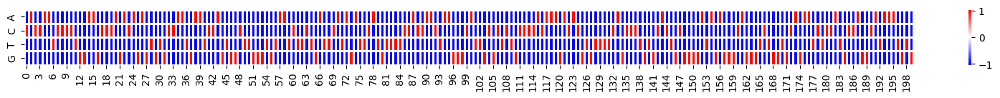

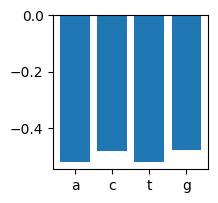

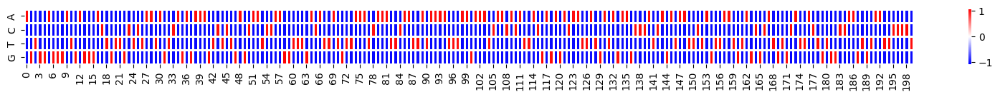

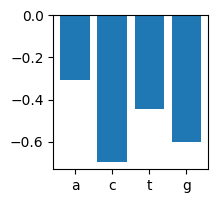

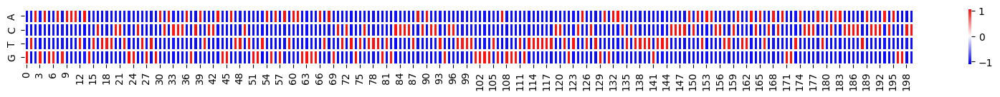

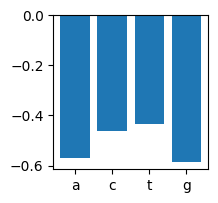

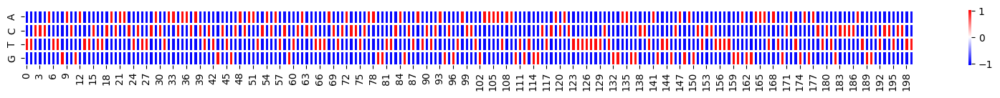

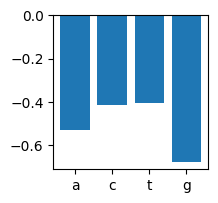

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.13 sequences/s]


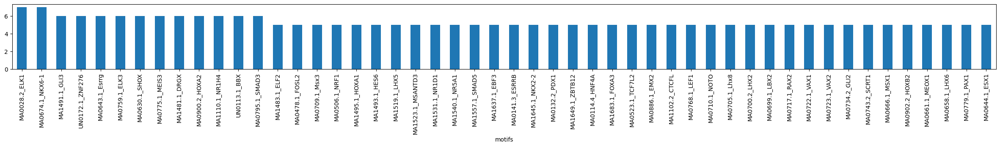

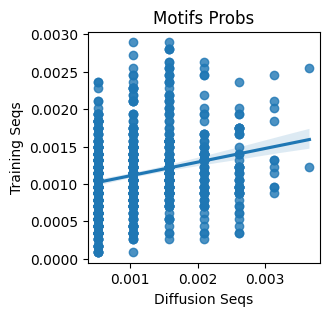

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000522,0.001052
1,MA0106.3_TP53,0.001567,0.002104
2,MA0816.1_Ascl2,0.001044,0.001490
3,MA0831.2_TFE3,0.000522,0.001666
4,MA0635.1_BARHL2,0.000522,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000522,0.001315
878,MA1538.1_NR2F1(var.3),0.001044,0.000877
879,MA0608.1_Creb3l2,0.000522,0.001841
880,MA1530.1_NKX6-3,0.000522,0.000701


0.20847968390652558 KL
 Epoch 1810 Loss: 0.1147567555308342
 Epoch 1820 Loss: 0.09965456277132034
 Epoch 1830 Loss: 0.02322850376367569
 Epoch 1840 Loss: 0.10317088663578033
 Epoch 1850 Loss: 0.0013368745567277074
 Epoch 1860 Loss: 0.0018464355962350965
 Epoch 1870 Loss: 0.08473392575979233
 Epoch 1880 Loss: 0.007426451425999403
 Epoch 1890 Loss: 0.004019488114863634
 Epoch 1900 Loss: 0.04208540916442871
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

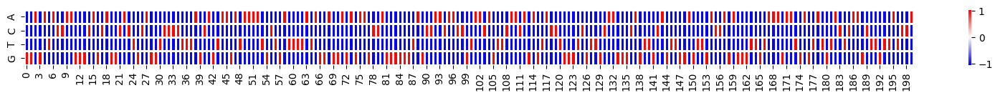

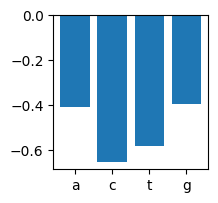

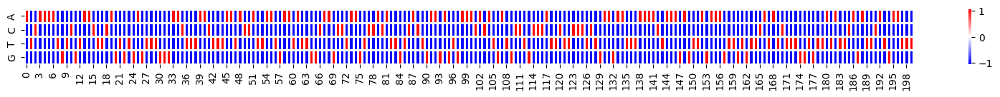

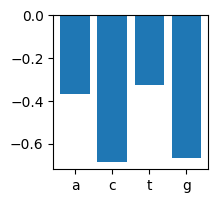

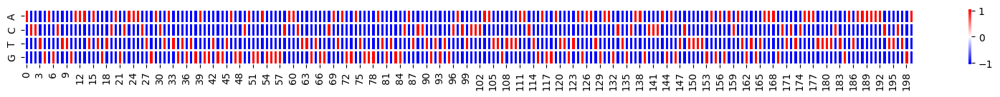

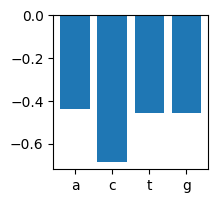

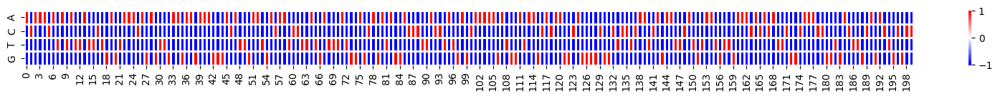

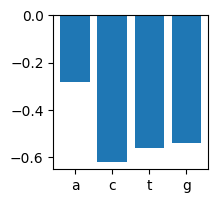

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.89 sequences/s]


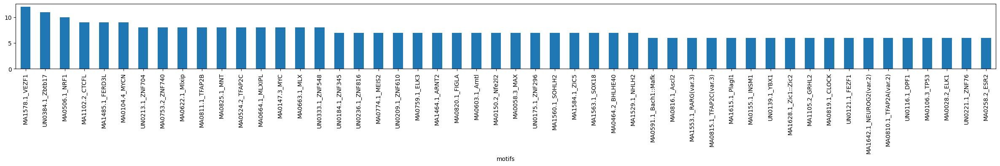

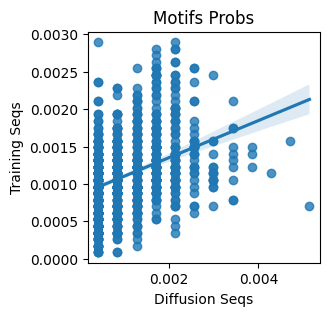

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000857,0.001052
1,MA0106.3_TP53,0.002570,0.002104
2,MA0816.1_Ascl2,0.002570,0.001490
3,MA0831.2_TFE3,0.001285,0.001666
4,MA0635.1_BARHL2,0.000857,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000857,0.001315
878,MA1538.1_NR2F1(var.3),0.001713,0.000877
879,MA0608.1_Creb3l2,0.002141,0.001841
880,MA1530.1_NKX6-3,0.000857,0.000701


0.20017188170264494 KL
 Epoch 1910 Loss: 0.0063796029426157475
 Epoch 1920 Loss: 0.014324679970741272
 Epoch 1930 Loss: 0.1023852527141571
 Epoch 1940 Loss: 0.004622638691216707
 Epoch 1950 Loss: 0.002963210456073284
 Epoch 1960 Loss: 0.06356919556856155
 Epoch 1970 Loss: 0.015545678324997425
 Epoch 1980 Loss: 0.08830112963914871
 Epoch 1990 Loss: 0.08904789388179779
 Epoch 2000 Loss: 0.014510040171444416
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

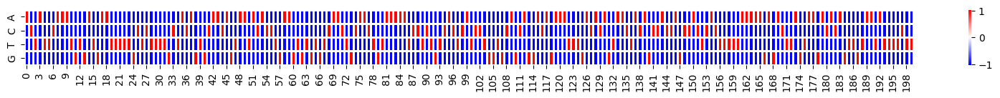

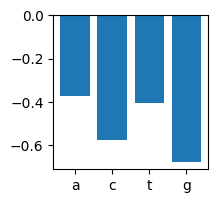

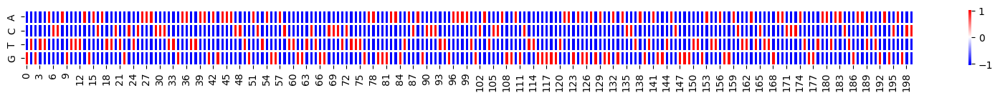

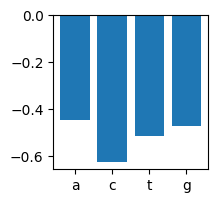

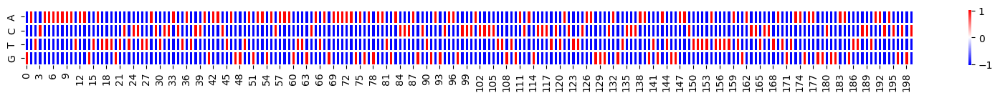

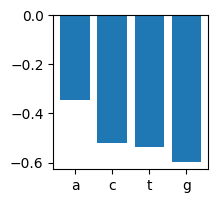

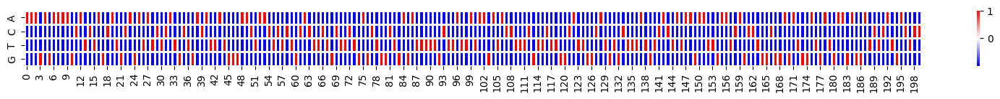

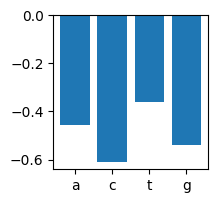

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.75 sequences/s]


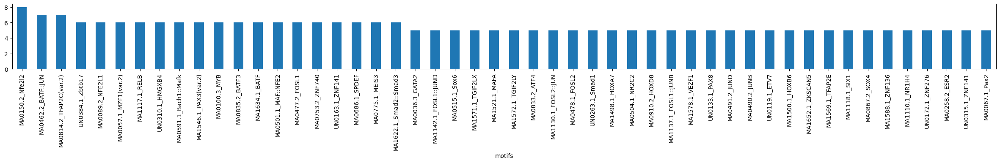

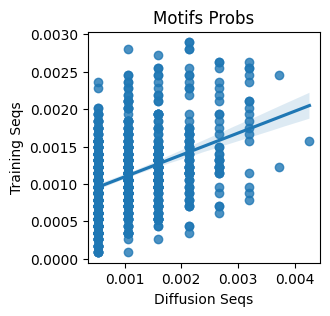

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001598,0.001052
1,MA0106.3_TP53,0.001598,0.002104
2,MA0816.1_Ascl2,0.001598,0.001490
3,MA0831.2_TFE3,0.001066,0.001666
4,MA0635.1_BARHL2,0.001598,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000533,0.001315
878,MA1538.1_NR2F1(var.3),0.000533,0.000877
879,MA0608.1_Creb3l2,0.001066,0.001841
880,MA1530.1_NKX6-3,0.001598,0.000701


0.16981493995667318 KL
 Epoch 2010 Loss: 0.10716907680034637
 Epoch 2020 Loss: 0.19811907410621643
 Epoch 2030 Loss: 0.006703739054501057
 Epoch 2040 Loss: 0.03704856336116791
 Epoch 2050 Loss: 0.10580668598413467
 Epoch 2060 Loss: 0.007156866602599621
 Epoch 2070 Loss: 0.010041370056569576
 Epoch 2080 Loss: 0.0062477136962115765
 Epoch 2090 Loss: 0.0018778579542413354
 Epoch 2100 Loss: 0.022234365344047546
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

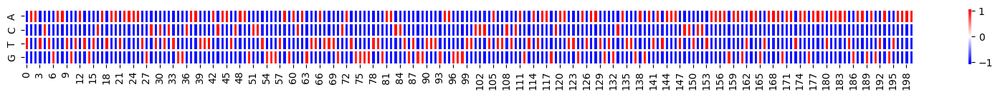

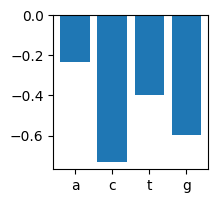

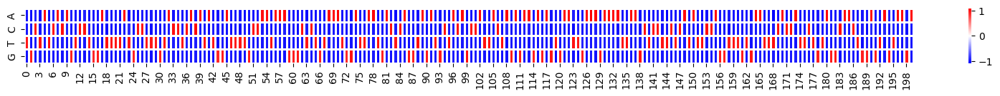

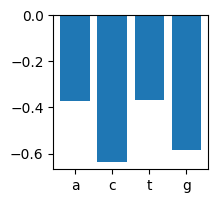

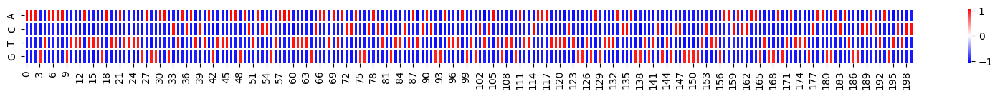

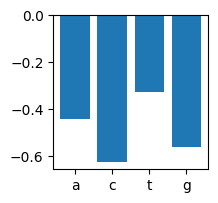

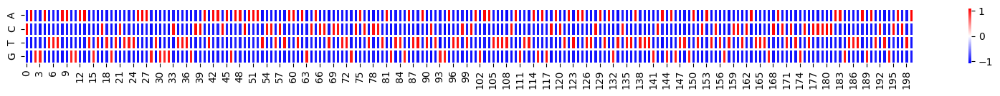

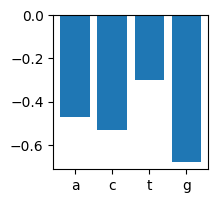

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.09 sequences/s]


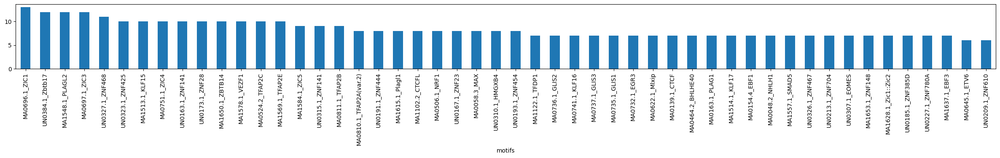

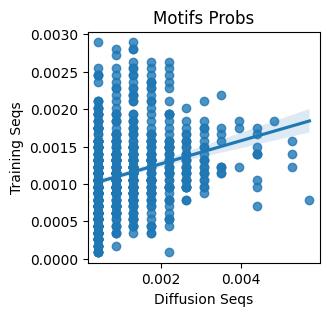

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001315,0.001052
1,MA0106.3_TP53,0.001753,0.002104
2,MA0816.1_Ascl2,0.001315,0.001490
3,MA0831.2_TFE3,0.002191,0.001666
4,MA0635.1_BARHL2,0.000438,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000876,0.001315
878,MA1538.1_NR2F1(var.3),0.000876,0.000877
879,MA0608.1_Creb3l2,0.000876,0.001841
880,MA1530.1_NKX6-3,0.000438,0.000701


0.2619049109982088 KL
 Epoch 2110 Loss: 0.05671631917357445
 Epoch 2120 Loss: 0.030903512611985207
 Epoch 2130 Loss: 0.06644757837057114
 Epoch 2140 Loss: 0.04582667723298073
 Epoch 2150 Loss: 0.10893471539020538
 Epoch 2160 Loss: 0.00301170302554965
 Epoch 2170 Loss: 0.009679559618234634
 Epoch 2180 Loss: 0.04728425294160843
 Epoch 2190 Loss: 0.06106626242399216
 Epoch 2200 Loss: 0.050703294575214386
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

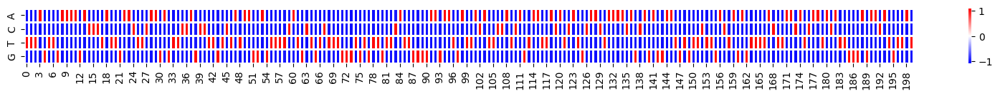

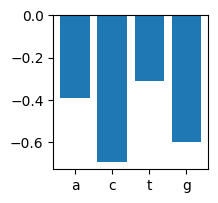

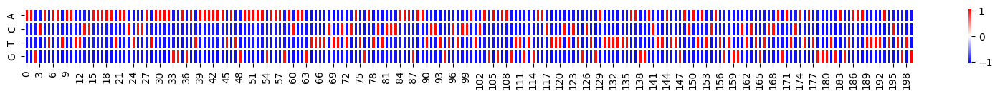

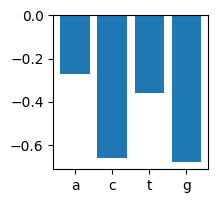

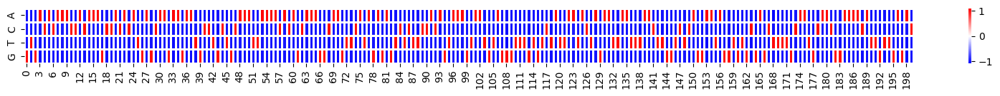

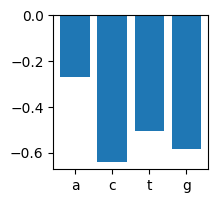

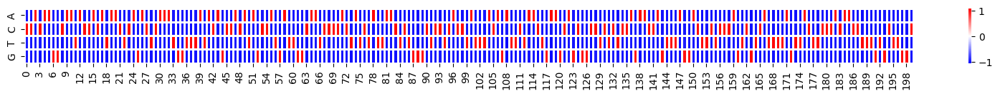

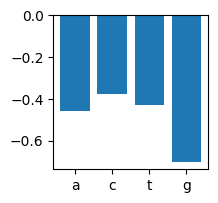

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.23 sequences/s]


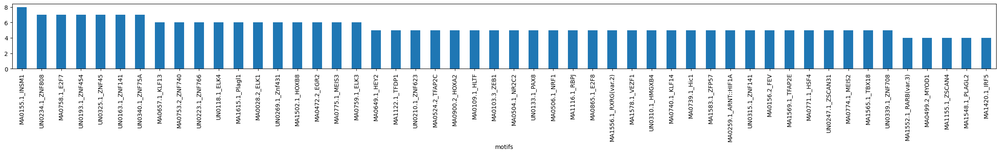

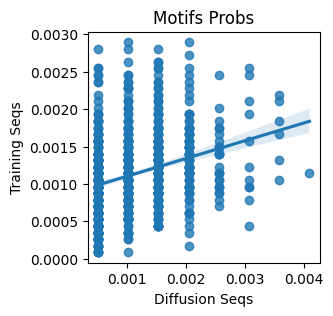

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001025,0.001052
1,MA0106.3_TP53,0.000512,0.002104
2,MA0816.1_Ascl2,0.001537,0.001490
3,MA0831.2_TFE3,0.000512,0.001666
4,MA0635.1_BARHL2,0.000512,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000512,0.001315
878,MA1538.1_NR2F1(var.3),0.001025,0.000877
879,MA0608.1_Creb3l2,0.001025,0.001841
880,MA1530.1_NKX6-3,0.001025,0.000701


0.17988430155417098 KL
 Epoch 2210 Loss: 0.01848534308373928
 Epoch 2220 Loss: 0.007678892929106951
 Epoch 2230 Loss: 0.1037289947271347
 Epoch 2240 Loss: 0.02399374172091484
 Epoch 2250 Loss: 0.015053263865411282
 Epoch 2260 Loss: 0.007264290004968643
 Epoch 2270 Loss: 0.08739480376243591
 Epoch 2280 Loss: 0.11278743296861649
 Epoch 2290 Loss: 0.01944003440439701
 Epoch 2300 Loss: 0.01298653706908226
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

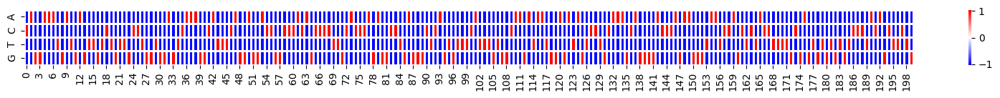

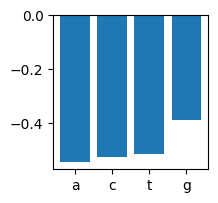

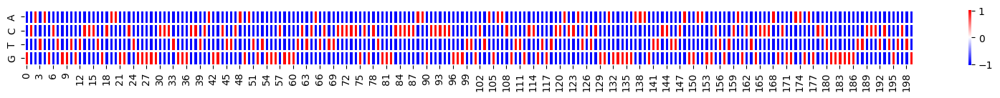

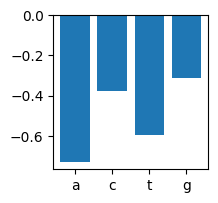

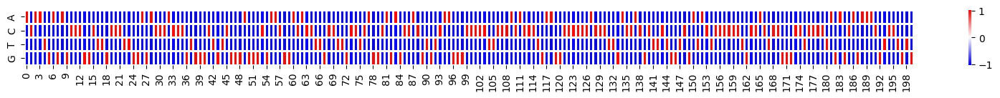

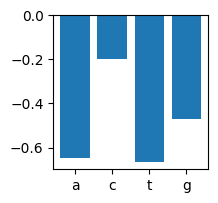

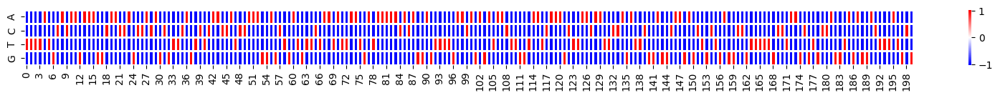

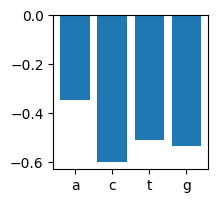

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.86 sequences/s]


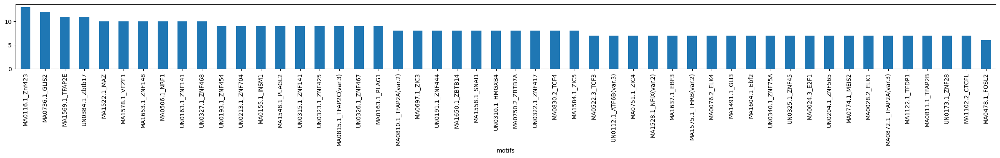

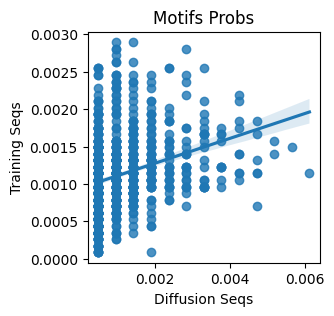

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000472,0.001052
1,MA0106.3_TP53,0.000472,0.002104
2,MA0816.1_Ascl2,0.000472,0.001490
3,MA0831.2_TFE3,0.001415,0.001666
4,MA0635.1_BARHL2,0.000943,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001415,0.001315
878,MA1538.1_NR2F1(var.3),0.001415,0.000877
879,MA0608.1_Creb3l2,0.001415,0.001841
880,MA1530.1_NKX6-3,0.000472,0.000701


0.24973225189806983 KL
 Epoch 2310 Loss: 0.0036048186011612415
 Epoch 2320 Loss: 0.10102451592683792
 Epoch 2330 Loss: 0.0027147408109158278
 Epoch 2340 Loss: 0.029968615621328354
 Epoch 2350 Loss: 0.04990469664335251
 Epoch 2360 Loss: 0.0035830095876008272
 Epoch 2370 Loss: 0.03725580871105194
 Epoch 2380 Loss: 0.09118635952472687
 Epoch 2390 Loss: 0.026977350935339928
 Epoch 2400 Loss: 0.03399721533060074
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

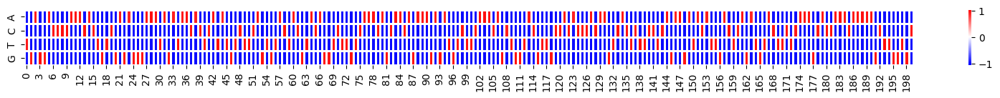

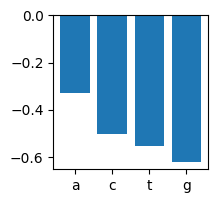

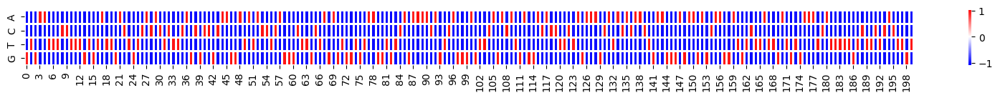

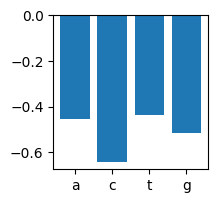

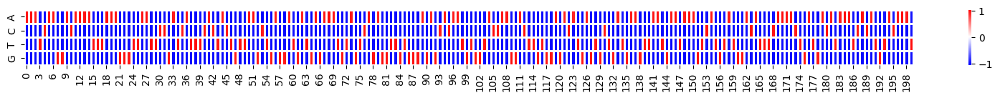

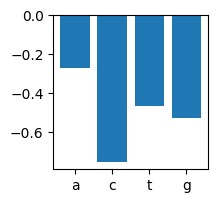

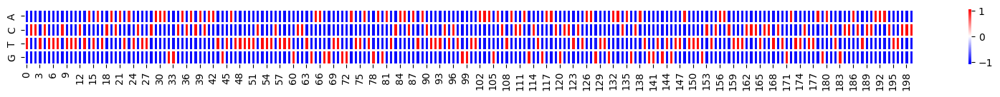

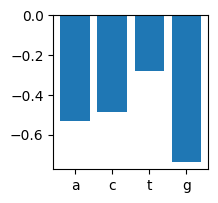

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.70 sequences/s]


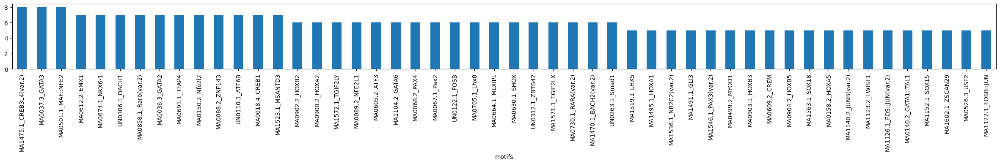

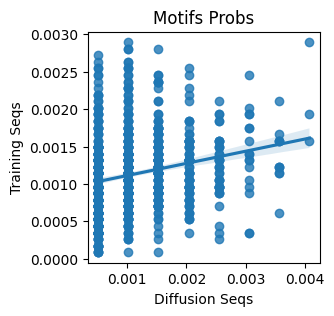

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000510,0.001052
1,MA0106.3_TP53,0.001019,0.002104
2,MA0816.1_Ascl2,0.001529,0.001490
3,MA0831.2_TFE3,0.001529,0.001666
4,MA0635.1_BARHL2,0.000510,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002039,0.001315
878,MA1538.1_NR2F1(var.3),0.002039,0.000877
879,MA0608.1_Creb3l2,0.001019,0.001841
880,MA1530.1_NKX6-3,0.000510,0.000701


0.2194519674318866 KL
 Epoch 2410 Loss: 0.018246756866574287
 Epoch 2420 Loss: 0.011979405768215656
 Epoch 2430 Loss: 0.0047505637630820274
 Epoch 2440 Loss: 0.03902950510382652
 Epoch 2450 Loss: 0.02368098869919777
 Epoch 2460 Loss: 0.00436864560469985
 Epoch 2470 Loss: 0.10193384438753128
 Epoch 2480 Loss: 0.025029752403497696
 Epoch 2490 Loss: 0.07251819223165512
 Epoch 2500 Loss: 0.04707483947277069
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

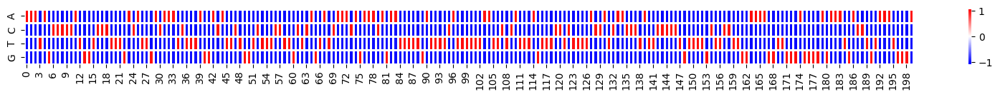

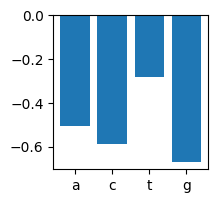

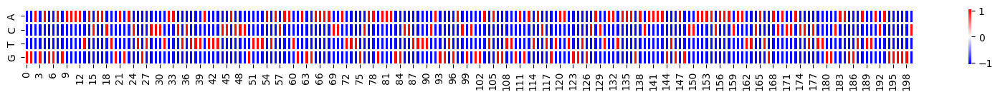

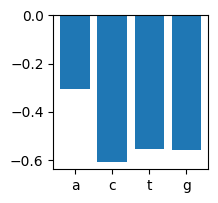

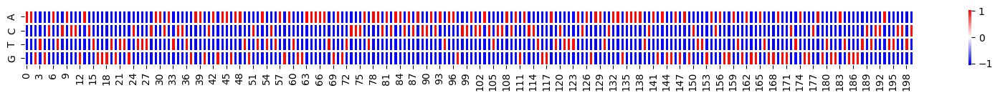

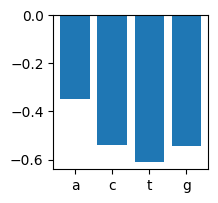

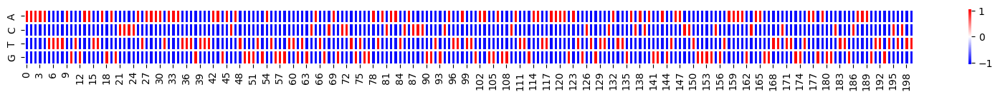

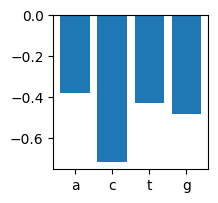

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.78 sequences/s]


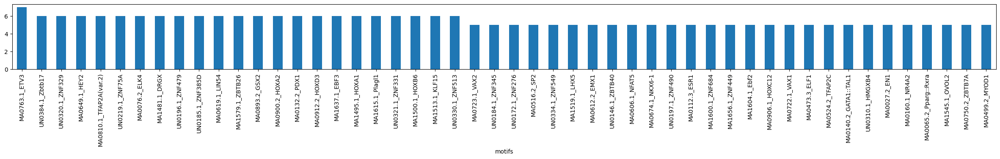

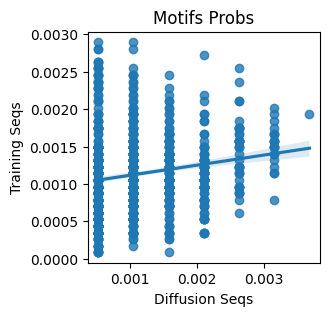

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001576,0.001052
1,MA0106.3_TP53,0.000525,0.002104
2,MA0816.1_Ascl2,0.001051,0.001490
3,MA0831.2_TFE3,0.001576,0.001666
4,MA0635.1_BARHL2,0.001576,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002102,0.001315
878,MA1538.1_NR2F1(var.3),0.000525,0.000877
879,MA0608.1_Creb3l2,0.001051,0.001841
880,MA1530.1_NKX6-3,0.001576,0.000701


0.22380106622231058 KL
 Epoch 2510 Loss: 0.07401623576879501
 Epoch 2520 Loss: 0.11023528128862381
 Epoch 2530 Loss: 0.006641714833676815
 Epoch 2540 Loss: 0.0947795882821083
 Epoch 2550 Loss: 0.0034860221203416586
 Epoch 2560 Loss: 0.0026714056730270386
 Epoch 2570 Loss: 0.00596458138898015
 Epoch 2580 Loss: 0.013025259599089622
 Epoch 2590 Loss: 0.09882550686597824
 Epoch 2600 Loss: 0.01722927950322628
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

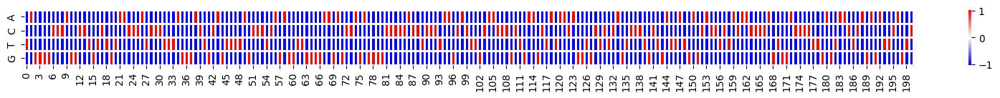

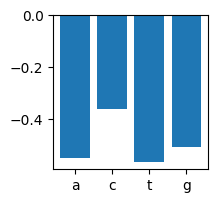

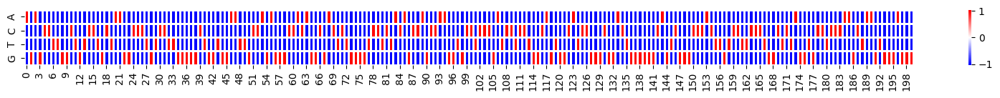

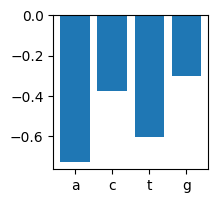

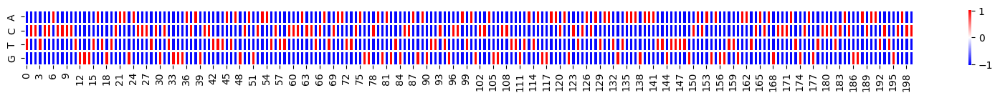

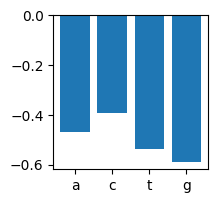

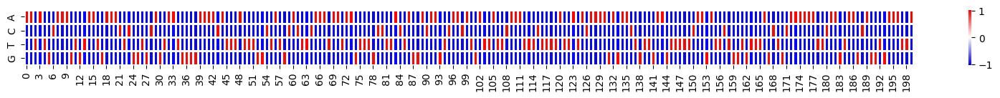

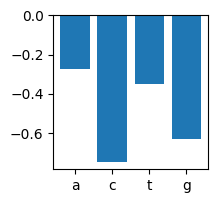

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.83 sequences/s]


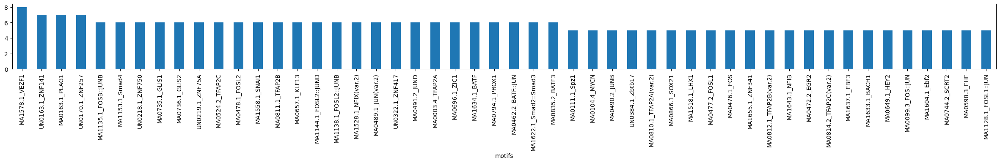

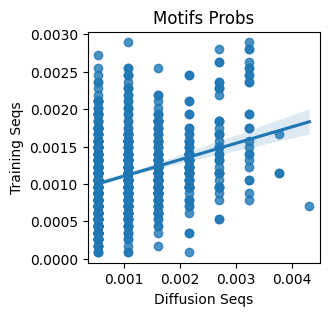

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001615,0.001052
1,MA0106.3_TP53,0.002153,0.002104
2,MA0816.1_Ascl2,0.000538,0.001490
3,MA0831.2_TFE3,0.000538,0.001666
4,MA0635.1_BARHL2,0.000538,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000538,0.001315
878,MA1538.1_NR2F1(var.3),0.001076,0.000877
879,MA0608.1_Creb3l2,0.002691,0.001841
880,MA1530.1_NKX6-3,0.000538,0.000701


0.20756078104071926 KL
 Epoch 2610 Loss: 0.007925539277493954
 Epoch 2620 Loss: 0.022077901288866997
 Epoch 2630 Loss: 0.07294078916311264
 Epoch 2640 Loss: 0.048812493681907654
 Epoch 2650 Loss: 0.09529270976781845
 Epoch 2660 Loss: 0.0029394803568720818
 Epoch 2670 Loss: 0.011701984331011772
 Epoch 2680 Loss: 0.061217982321977615
 Epoch 2690 Loss: 0.0051642730832099915
 Epoch 2700 Loss: 0.008120124228298664
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

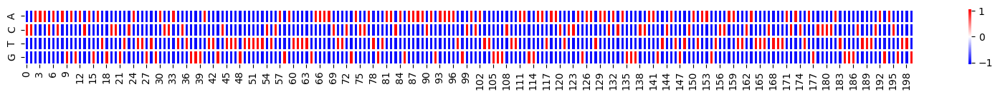

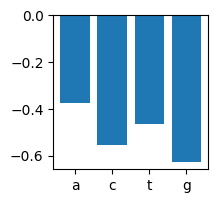

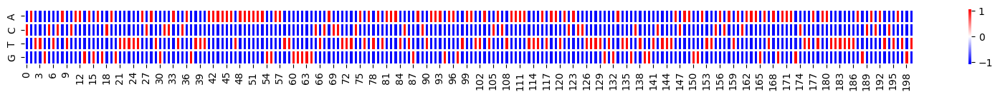

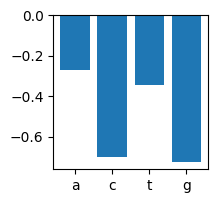

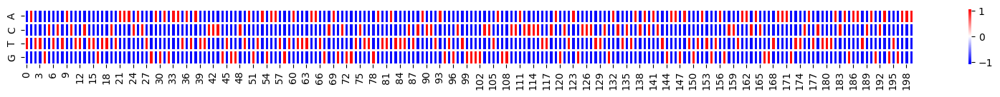

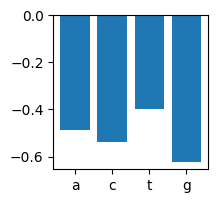

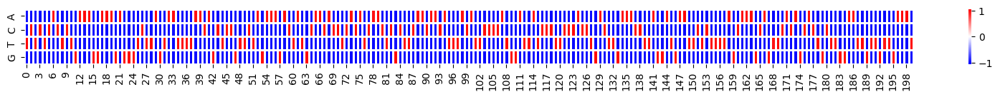

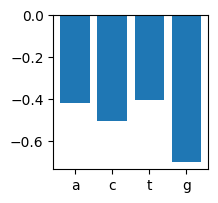

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.51 sequences/s]


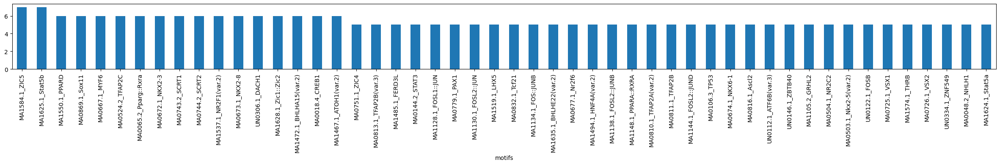

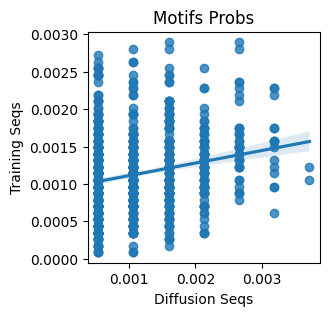

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001594,0.001052
1,MA0106.3_TP53,0.002657,0.002104
2,MA0816.1_Ascl2,0.002657,0.001490
3,MA0831.2_TFE3,0.000531,0.001666
4,MA0635.1_BARHL2,0.000531,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002657,0.001315
878,MA1538.1_NR2F1(var.3),0.000531,0.000877
879,MA0608.1_Creb3l2,0.001594,0.001841
880,MA1530.1_NKX6-3,0.000531,0.000701


0.21440786098443043 KL
 Epoch 2710 Loss: 0.006059303414076567
 Epoch 2720 Loss: 0.10511667281389236
 Epoch 2730 Loss: 0.020050637423992157
 Epoch 2740 Loss: 0.013114320114254951
 Epoch 2750 Loss: 0.021955739706754684
 Epoch 2760 Loss: 0.052076514810323715
 Epoch 2770 Loss: 0.017908019945025444
 Epoch 2780 Loss: 0.00788541603833437
 Epoch 2790 Loss: 0.08602258563041687
 Epoch 2800 Loss: 0.0497671514749527
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

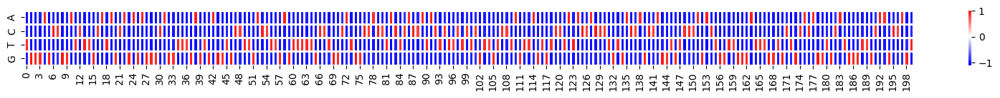

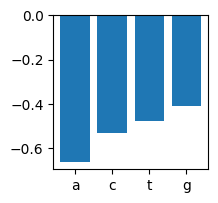

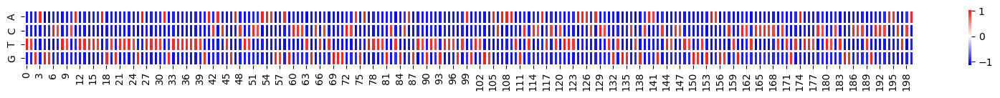

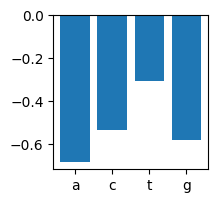

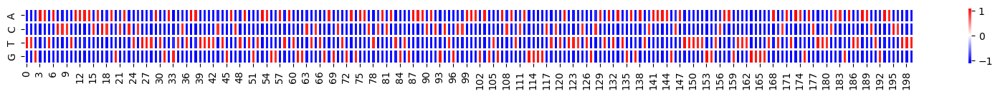

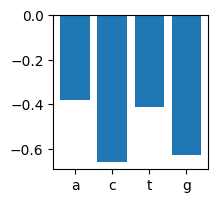

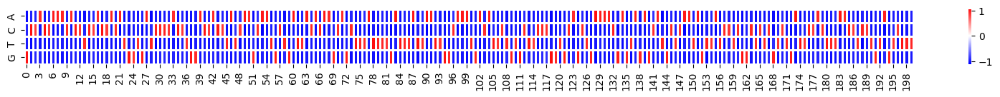

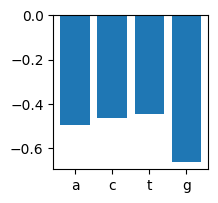

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.80 sequences/s]


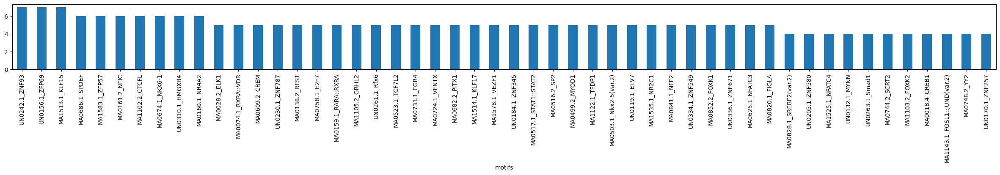

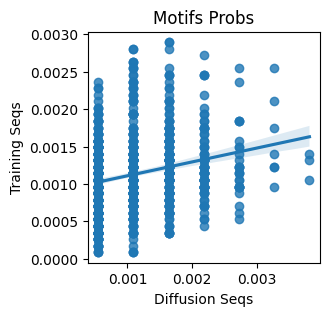

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001091,0.001052
1,MA0106.3_TP53,0.001091,0.002104
2,MA0816.1_Ascl2,0.001636,0.001490
3,MA0831.2_TFE3,0.001636,0.001666
4,MA0635.1_BARHL2,0.001091,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000545,0.001315
878,MA1538.1_NR2F1(var.3),0.001091,0.000877
879,MA0608.1_Creb3l2,0.001636,0.001841
880,MA1530.1_NKX6-3,0.000545,0.000701


0.20053889028973726 KL
 Epoch 2810 Loss: 0.03012501262128353
 Epoch 2820 Loss: 0.008677615784108639
 Epoch 2830 Loss: 0.0995476096868515
 Epoch 2840 Loss: 0.07839900255203247
 Epoch 2850 Loss: 0.0878019779920578
 Epoch 2860 Loss: 0.011817282065749168
 Epoch 2870 Loss: 0.07417894899845123
 Epoch 2880 Loss: 0.04068012908101082
 Epoch 2890 Loss: 0.0744880735874176
 Epoch 2900 Loss: 0.010251129977405071
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

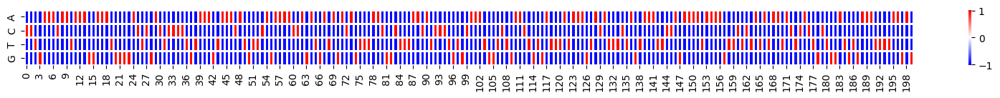

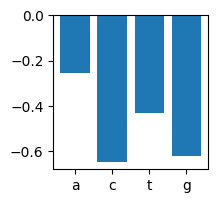

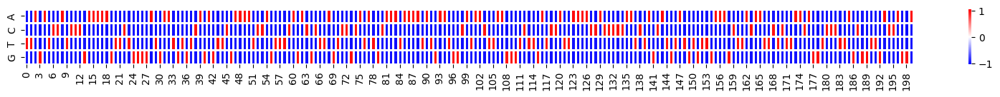

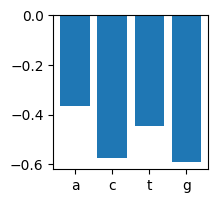

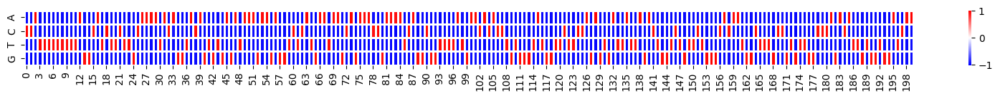

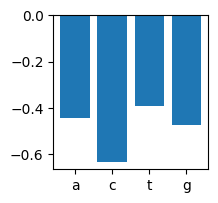

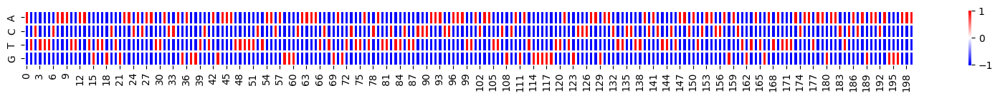

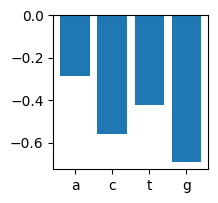

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.50 sequences/s]


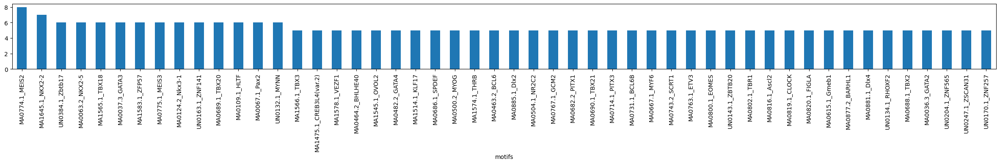

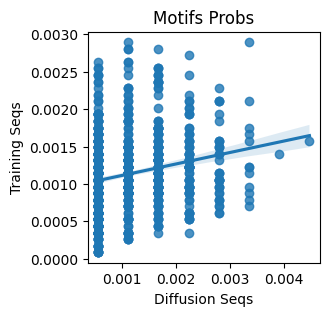

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000559,0.001052
1,MA0106.3_TP53,0.000559,0.002104
2,MA0816.1_Ascl2,0.002795,0.001490
3,MA0831.2_TFE3,0.000559,0.001666
4,MA0635.1_BARHL2,0.000559,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001677,0.001315
878,MA1538.1_NR2F1(var.3),0.002236,0.000877
879,MA0608.1_Creb3l2,0.001677,0.001841
880,MA1530.1_NKX6-3,0.000559,0.000701


0.2209127977946147 KL
 Epoch 2910 Loss: 0.0033711218275129795
 Epoch 2920 Loss: 0.10092511773109436
 Epoch 2930 Loss: 0.10589778423309326
 Epoch 2940 Loss: 0.047227174043655396
 Epoch 2950 Loss: 0.07983992993831635
 Epoch 2960 Loss: 0.0048779649659991264
 Epoch 2970 Loss: 0.0780574381351471
 Epoch 2980 Loss: 0.01775810867547989
 Epoch 2990 Loss: 0.06578318029642105
 Epoch 3000 Loss: 0.11007510125637054
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

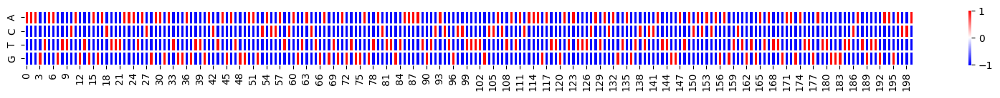

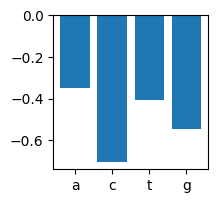

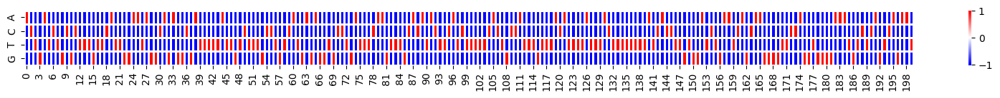

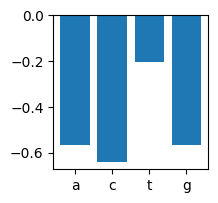

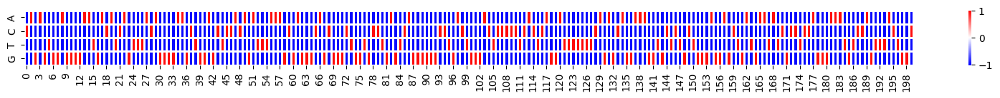

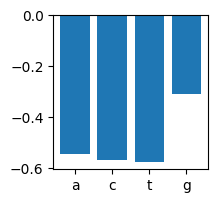

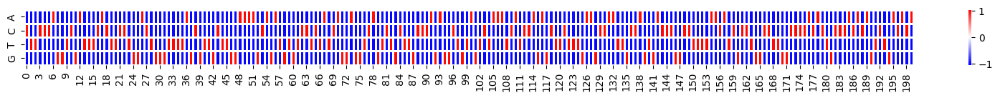

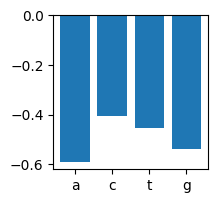

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.63 sequences/s]


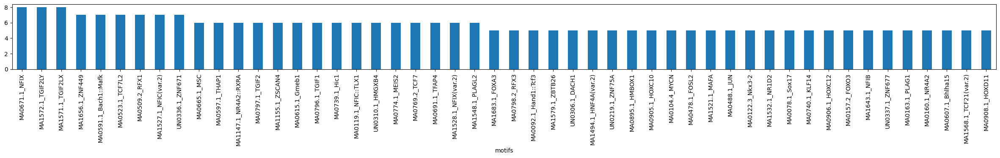

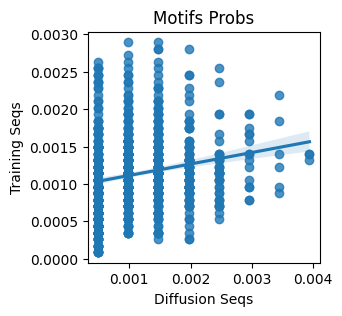

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001477,0.001052
1,MA0106.3_TP53,0.001477,0.002104
2,MA0816.1_Ascl2,0.000492,0.001490
3,MA0831.2_TFE3,0.000492,0.001666
4,MA0635.1_BARHL2,0.000492,0.000964
...,...,...,...
877,MA1538.1_NR2F1(var.3),0.001969,0.000877
878,MA0608.1_Creb3l2,0.001969,0.001841
879,MA1654.1_ZNF16,0.000492,0.001315
880,MA1530.1_NKX6-3,0.000492,0.000701


0.20696362250067668 KL
 Epoch 3010 Loss: 0.002113639609888196
 Epoch 3020 Loss: 0.01047541107982397
 Epoch 3030 Loss: 0.016952231526374817
 Epoch 3040 Loss: 0.017630837857723236
 Epoch 3050 Loss: 0.0006453124806284904
 Epoch 3060 Loss: 0.050067681819200516
 Epoch 3070 Loss: 0.061105549335479736
 Epoch 3080 Loss: 0.04747579246759415
 Epoch 3090 Loss: 0.016930129379034042
 Epoch 3100 Loss: 0.10708576440811157
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

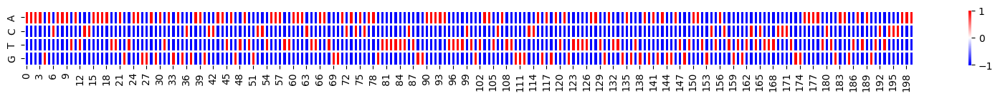

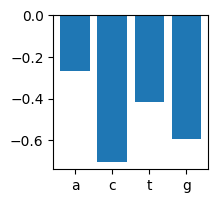

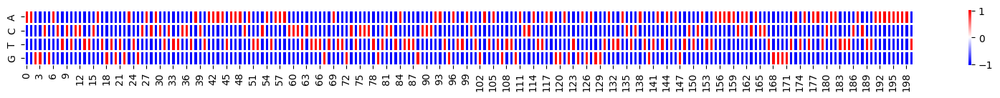

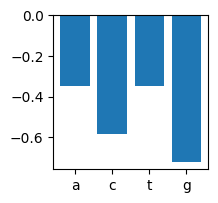

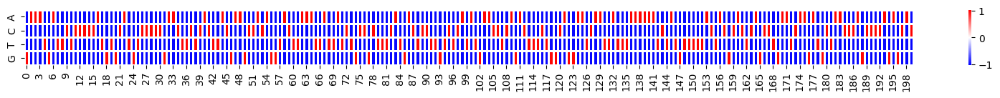

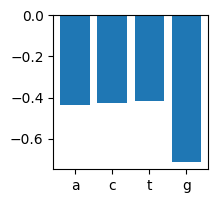

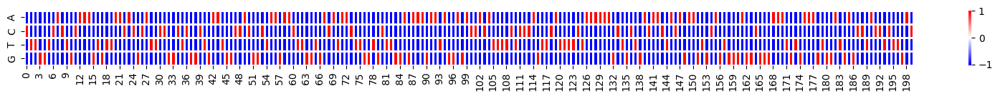

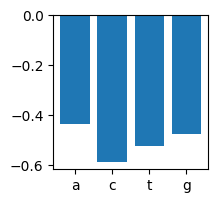

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 33.90 sequences/s]


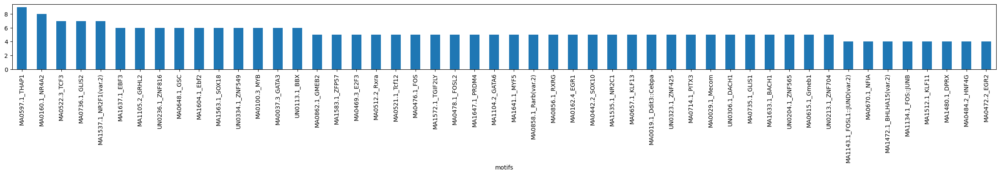

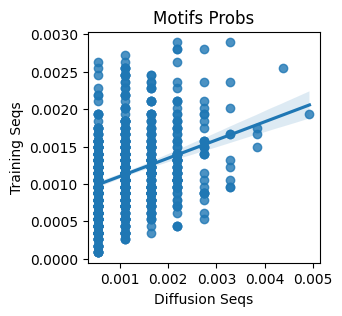

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001095,0.001052
1,MA0106.3_TP53,0.000548,0.002104
2,MA0816.1_Ascl2,0.001643,0.001490
3,MA0831.2_TFE3,0.001643,0.001666
4,MA0635.1_BARHL2,0.000548,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000548,0.001315
878,MA1538.1_NR2F1(var.3),0.000548,0.000877
879,MA0608.1_Creb3l2,0.001095,0.001841
880,MA1530.1_NKX6-3,0.001095,0.000701


0.1827278039683539 KL
 Epoch 3110 Loss: 0.0033331774175167084
 Epoch 3120 Loss: 0.07273001968860626
 Epoch 3130 Loss: 0.0006195192108862102
 Epoch 3140 Loss: 0.0030310708098113537
 Epoch 3150 Loss: 0.11551600694656372
 Epoch 3160 Loss: 0.1021498516201973
 Epoch 3170 Loss: 0.10252976417541504
 Epoch 3180 Loss: 0.026702232658863068
 Epoch 3190 Loss: 0.01998724788427353
 Epoch 3200 Loss: 0.0526520200073719
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

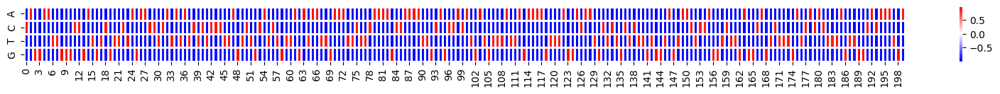

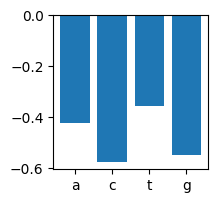

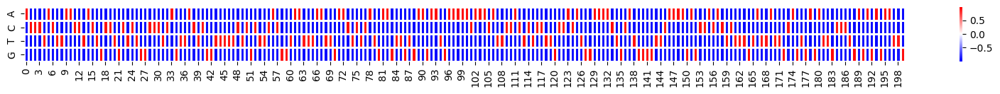

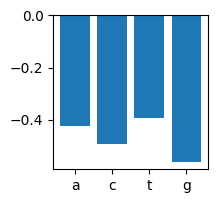

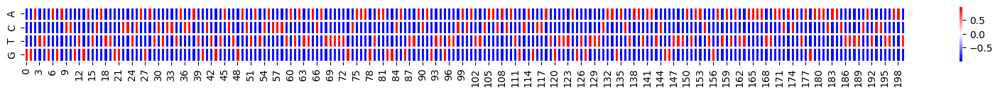

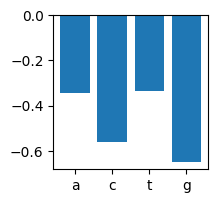

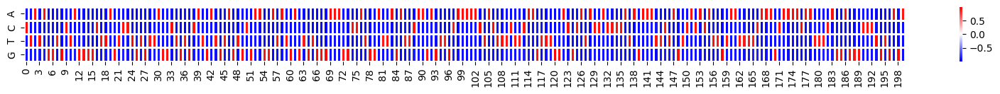

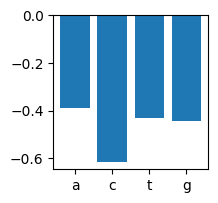

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.92 sequences/s]


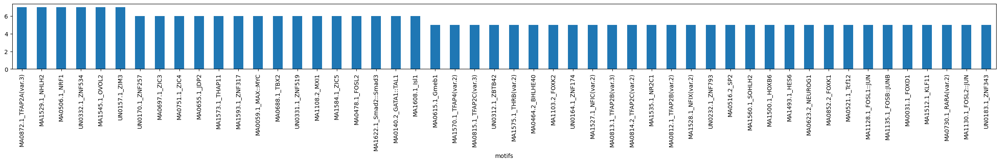

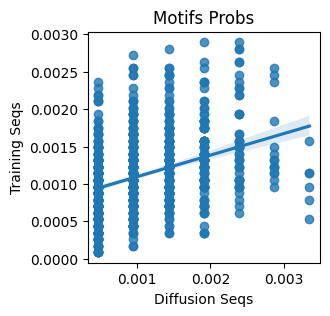

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001910,0.001052
1,MA0106.3_TP53,0.000955,0.002104
2,MA0816.1_Ascl2,0.001433,0.001490
3,MA0831.2_TFE3,0.001433,0.001666
4,MA0635.1_BARHL2,0.000478,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000955,0.001315
878,MA1538.1_NR2F1(var.3),0.000478,0.000877
879,MA0608.1_Creb3l2,0.000955,0.001841
880,MA1530.1_NKX6-3,0.000478,0.000701


0.16384632149728467 KL
 Epoch 3210 Loss: 0.02229965664446354
 Epoch 3220 Loss: 0.005356950685381889
 Epoch 3230 Loss: 0.09777110069990158
 Epoch 3240 Loss: 0.05918781831860542
 Epoch 3250 Loss: 0.0013596147764474154
 Epoch 3260 Loss: 0.0034460793249309063
 Epoch 3270 Loss: 0.03001808375120163
 Epoch 3280 Loss: 0.004921411629766226
 Epoch 3290 Loss: 0.030028779059648514
 Epoch 3300 Loss: 0.08195393532514572
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

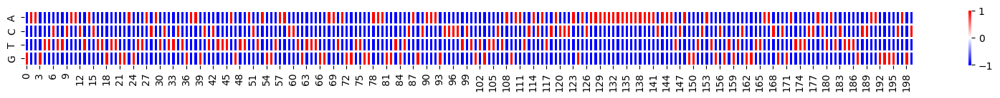

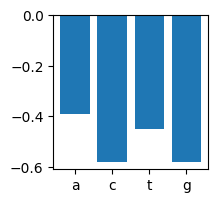

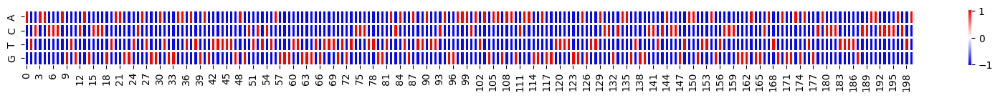

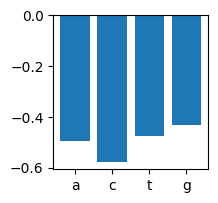

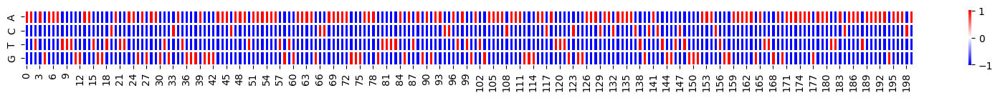

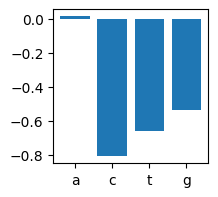

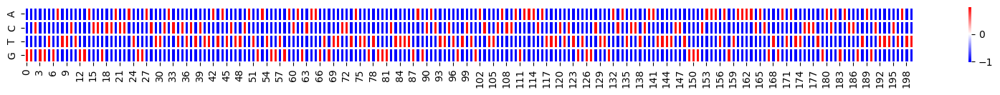

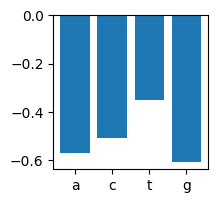

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 34.86 sequences/s]


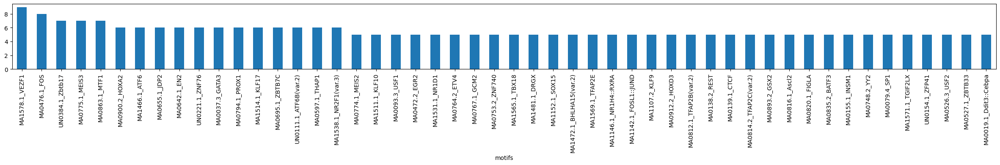

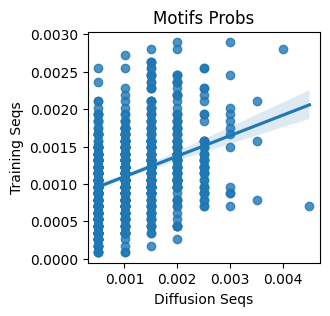

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002504,0.001052
1,MA0106.3_TP53,0.000501,0.002104
2,MA0816.1_Ascl2,0.002504,0.001490
3,MA0831.2_TFE3,0.002003,0.001666
4,MA0635.1_BARHL2,0.000501,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000501,0.001315
878,MA1538.1_NR2F1(var.3),0.003005,0.000877
879,MA0608.1_Creb3l2,0.000501,0.001841
880,MA1530.1_NKX6-3,0.001502,0.000701


0.18130785260963214 KL
 Epoch 3310 Loss: 0.033138517290353775
 Epoch 3320 Loss: 0.10992243885993958
 Epoch 3330 Loss: 0.0009341362165287137
 Epoch 3340 Loss: 0.09995847195386887
 Epoch 3350 Loss: 0.028876179829239845
 Epoch 3360 Loss: 0.04959199205040932
 Epoch 3370 Loss: 0.09604813903570175
 Epoch 3380 Loss: 0.11414099484682083
 Epoch 3390 Loss: 0.10202372819185257
 Epoch 3400 Loss: 0.012247197329998016
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

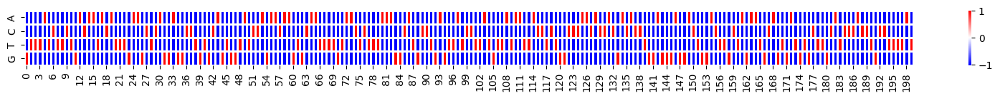

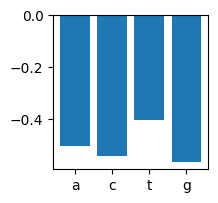

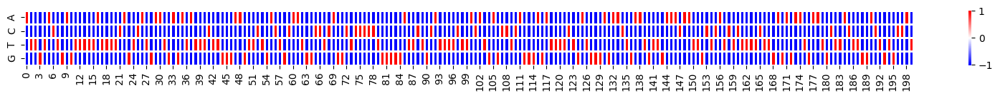

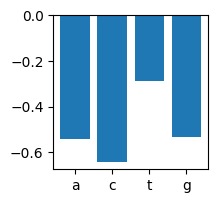

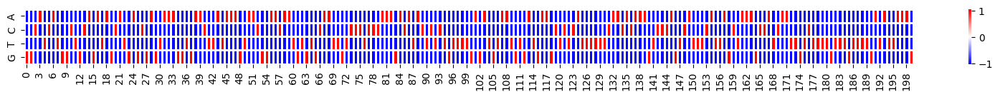

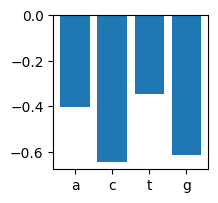

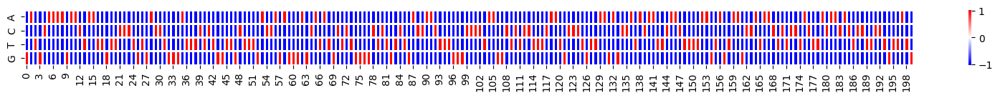

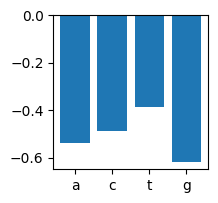

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.59 sequences/s]


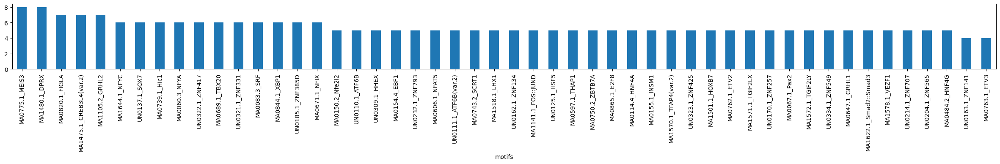

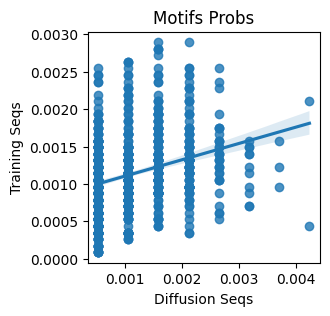

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002647,0.001052
1,MA0106.3_TP53,0.002118,0.002104
2,MA0816.1_Ascl2,0.000529,0.001490
3,MA0831.2_TFE3,0.001059,0.001666
4,MA0635.1_BARHL2,0.000529,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000529,0.001315
878,MA1538.1_NR2F1(var.3),0.001588,0.000877
879,MA0608.1_Creb3l2,0.001588,0.001841
880,MA1530.1_NKX6-3,0.000529,0.000701


0.1948235644758874 KL
 Epoch 3410 Loss: 0.05737220123410225
 Epoch 3420 Loss: 0.00512107415124774
 Epoch 3430 Loss: 0.05505364388227463
 Epoch 3440 Loss: 0.06988071650266647
 Epoch 3450 Loss: 0.05335049331188202
 Epoch 3460 Loss: 0.0016116282204166055
 Epoch 3470 Loss: 0.10865700989961624
 Epoch 3480 Loss: 0.09072519838809967
 Epoch 3490 Loss: 0.10761245340108871
 Epoch 3500 Loss: 0.0041690729558467865
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

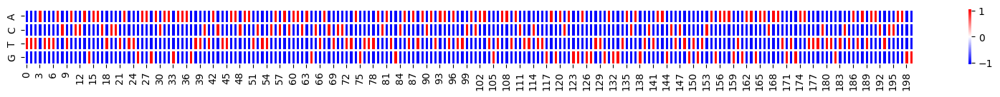

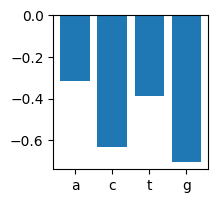

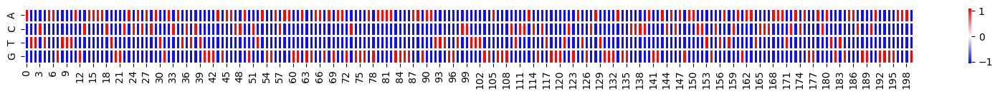

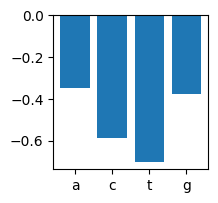

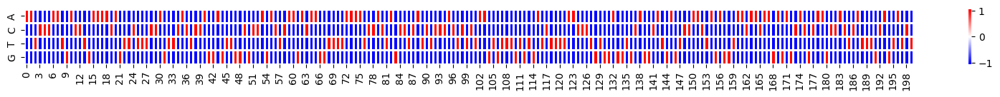

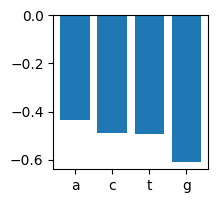

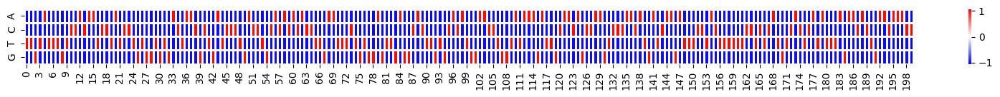

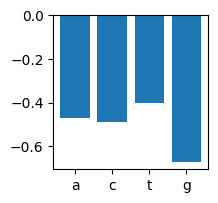

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.75 sequences/s]


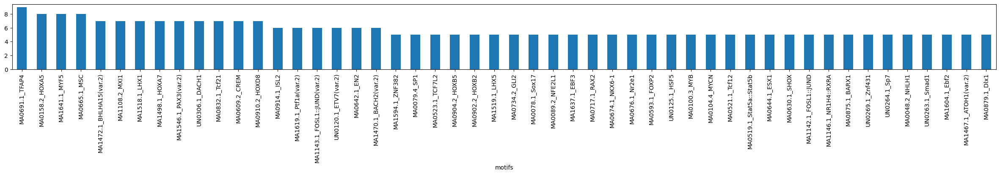

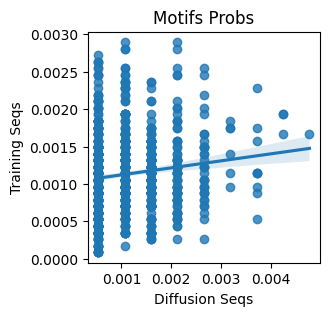

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002653,0.001052
1,MA0106.3_TP53,0.001061,0.002104
2,MA0816.1_Ascl2,0.001592,0.001490
3,MA0831.2_TFE3,0.000531,0.001666
4,MA0635.1_BARHL2,0.001592,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000531,0.001315
878,MA1538.1_NR2F1(var.3),0.001592,0.000877
879,MA0608.1_Creb3l2,0.000531,0.001841
880,MA1530.1_NKX6-3,0.001061,0.000701


0.2459308171695292 KL
 Epoch 3510 Loss: 0.014615197665989399
 Epoch 3520 Loss: 0.04339529946446419
 Epoch 3530 Loss: 0.0544695220887661
 Epoch 3540 Loss: 0.004892130382359028
 Epoch 3550 Loss: 0.007318346761167049
 Epoch 3560 Loss: 0.014753174968063831
 Epoch 3570 Loss: 0.024796050041913986
 Epoch 3580 Loss: 0.08325456827878952
 Epoch 3590 Loss: 0.09971631318330765
 Epoch 3600 Loss: 0.031899016350507736
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

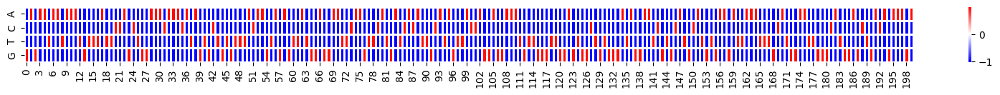

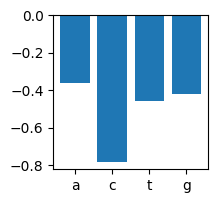

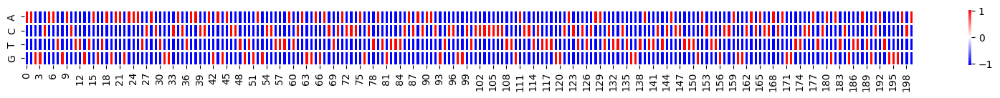

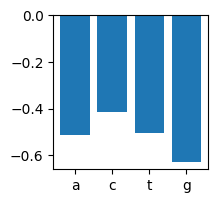

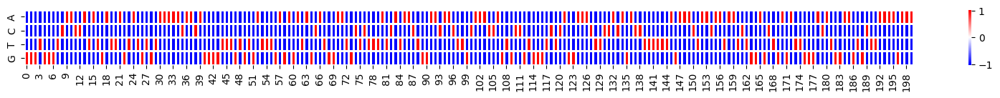

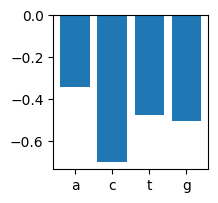

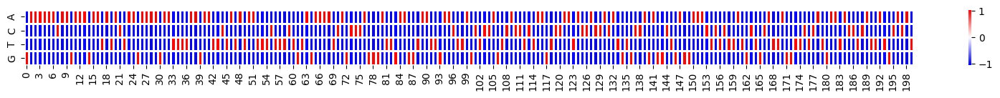

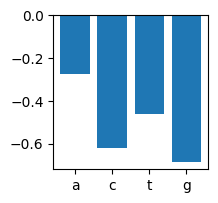

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.91 sequences/s]


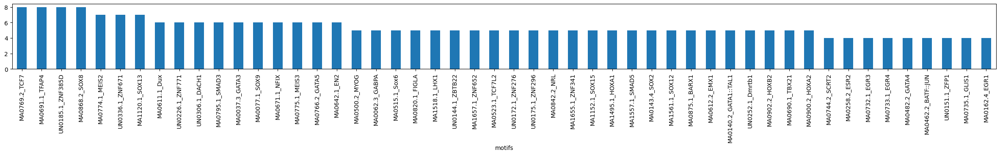

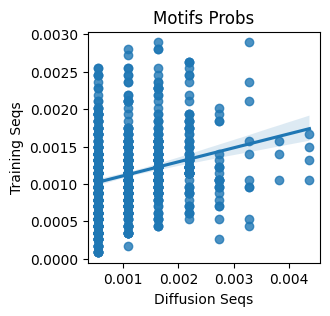

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001638,0.001052
1,MA0106.3_TP53,0.000546,0.002104
2,MA0816.1_Ascl2,0.002185,0.001490
3,MA0831.2_TFE3,0.001092,0.001666
4,MA0635.1_BARHL2,0.001092,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001638,0.001315
878,MA1538.1_NR2F1(var.3),0.001638,0.000877
879,MA0608.1_Creb3l2,0.000546,0.001841
880,MA1530.1_NKX6-3,0.000546,0.000701


0.200748026707365 KL
 Epoch 3610 Loss: 0.037131085991859436
 Epoch 3620 Loss: 0.09026189148426056
 Epoch 3630 Loss: 0.06301974505186081
 Epoch 3640 Loss: 0.06378719955682755
 Epoch 3650 Loss: 0.11214181035757065
 Epoch 3660 Loss: 0.04162568598985672
 Epoch 3670 Loss: 0.026336004957556725
 Epoch 3680 Loss: 0.08416948467493057
 Epoch 3690 Loss: 0.10326958447694778
 Epoch 3700 Loss: 0.07089205831289291
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

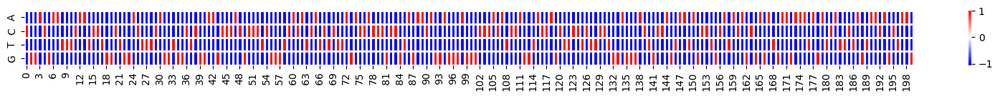

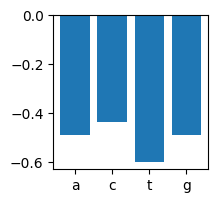

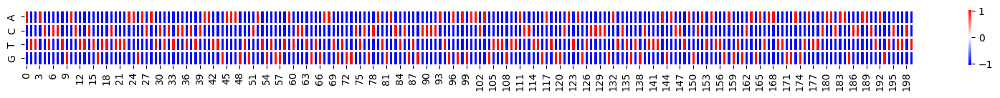

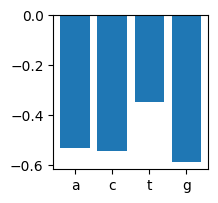

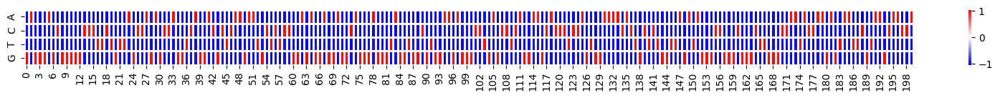

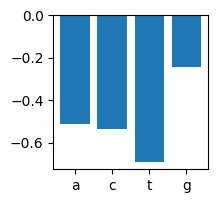

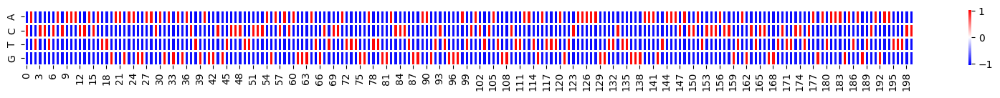

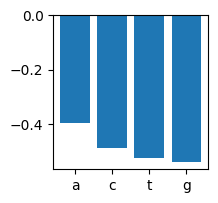

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.07 sequences/s]


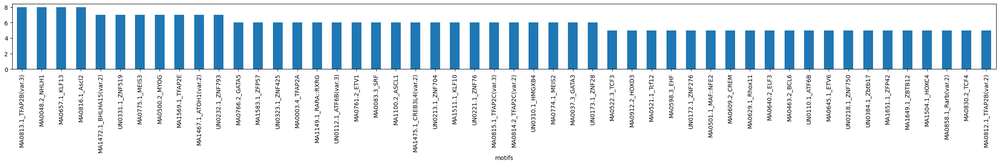

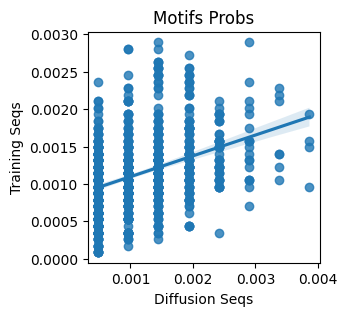

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001449,0.001052
1,MA0106.3_TP53,0.000966,0.002104
2,MA0816.1_Ascl2,0.003865,0.001490
3,MA0831.2_TFE3,0.000483,0.001666
4,MA0635.1_BARHL2,0.000483,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001449,0.001315
878,MA1538.1_NR2F1(var.3),0.000966,0.000877
879,MA0608.1_Creb3l2,0.000483,0.001841
880,MA1530.1_NKX6-3,0.001932,0.000701


0.17619304168961514 KL
 Epoch 3710 Loss: 0.10099419951438904
 Epoch 3720 Loss: 0.11280835419893265
 Epoch 3730 Loss: 0.0773053765296936
 Epoch 3740 Loss: 0.006152704823762178
 Epoch 3750 Loss: 0.07642292976379395
 Epoch 3760 Loss: 0.014311564154922962
 Epoch 3770 Loss: 0.09174848347902298
 Epoch 3780 Loss: 0.0045887259766459465
 Epoch 3790 Loss: 0.07798390090465546
 Epoch 3800 Loss: 0.09188902378082275
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

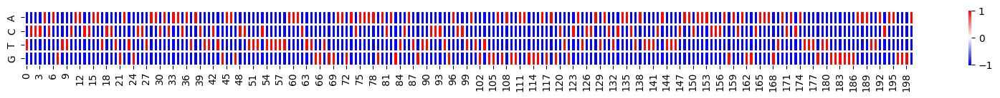

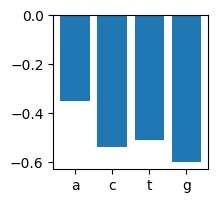

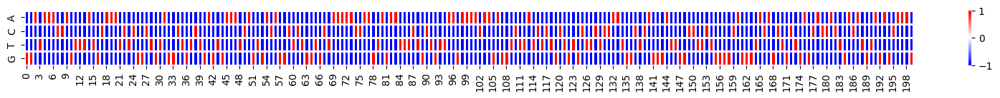

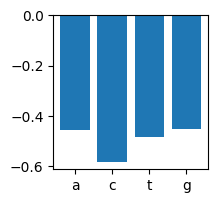

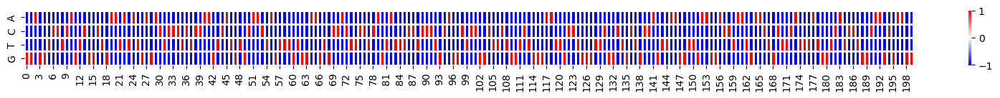

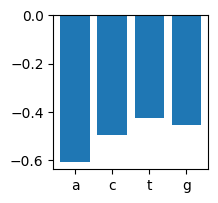

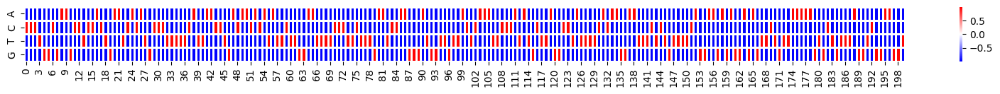

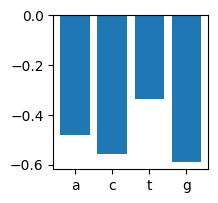

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.83 sequences/s]


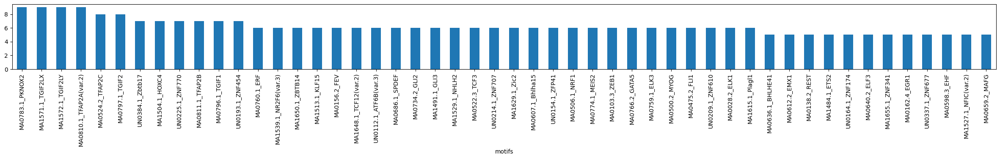

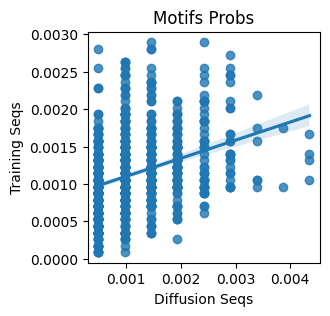

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000484,0.001052
1,MA0106.3_TP53,0.001451,0.002104
2,MA0816.1_Ascl2,0.001451,0.001490
3,MA0831.2_TFE3,0.000968,0.001666
4,MA0635.1_BARHL2,0.000968,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000484,0.001315
878,MA1538.1_NR2F1(var.3),0.001451,0.000877
879,MA0608.1_Creb3l2,0.000968,0.001841
880,MA1530.1_NKX6-3,0.001451,0.000701


0.18841560662330809 KL
 Epoch 3810 Loss: 0.10271748155355453
 Epoch 3820 Loss: 0.10007093846797943
 Epoch 3830 Loss: 0.0019514000741764903
 Epoch 3840 Loss: 0.01444366667419672
 Epoch 3850 Loss: 0.08185749500989914
 Epoch 3860 Loss: 0.04169617220759392
 Epoch 3870 Loss: 0.07045155018568039
 Epoch 3880 Loss: 0.0025822026655077934
 Epoch 3890 Loss: 0.0012929374352097511
 Epoch 3900 Loss: 0.003020394826307893
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

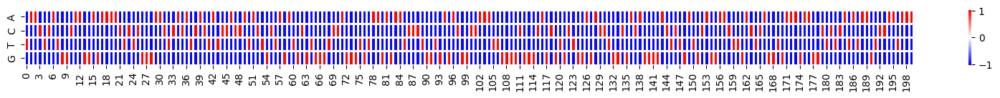

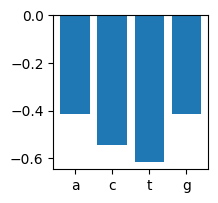

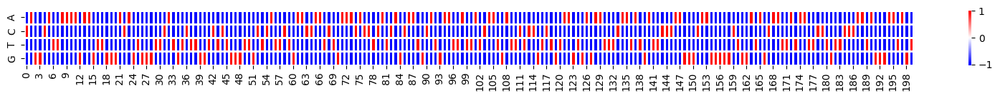

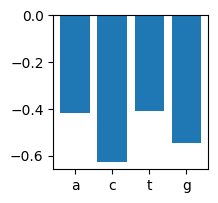

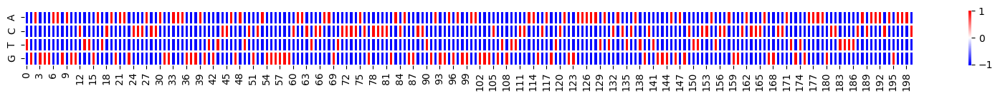

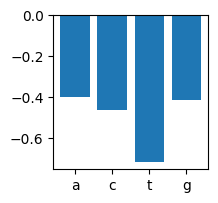

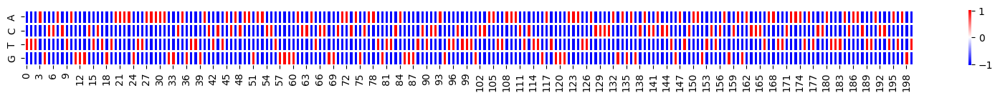

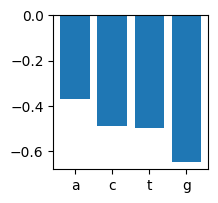

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 36.46 sequences/s]


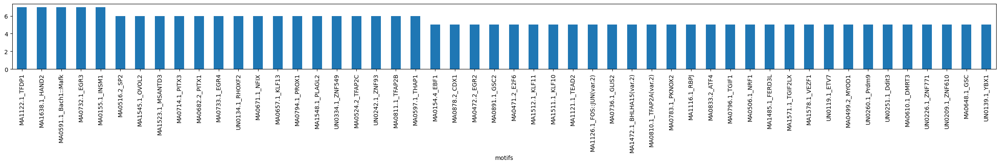

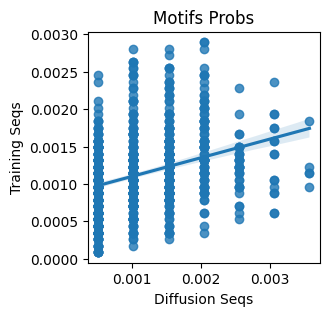

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.001020,0.001052
1,MA0106.3_TP53,0.001020,0.002104
2,MA0816.1_Ascl2,0.002041,0.001490
3,MA0831.2_TFE3,0.000510,0.001666
4,MA0635.1_BARHL2,0.001531,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000510,0.001315
878,MA1538.1_NR2F1(var.3),0.001531,0.000877
879,MA0608.1_Creb3l2,0.000510,0.001841
880,MA1530.1_NKX6-3,0.000510,0.000701


0.180800155262383 KL
 Epoch 3910 Loss: 0.006300690583884716
 Epoch 3920 Loss: 0.08498707413673401
 Epoch 3930 Loss: 0.019467808306217194
 Epoch 3940 Loss: 0.06522329151630402
 Epoch 3950 Loss: 0.0007205160800367594
 Epoch 3960 Loss: 0.0017083078855648637
 Epoch 3970 Loss: 0.01033481489866972
 Epoch 3980 Loss: 0.0029870360158383846
 Epoch 3990 Loss: 0.01844969391822815
 Epoch 4000 Loss: 0.0348774679005146
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

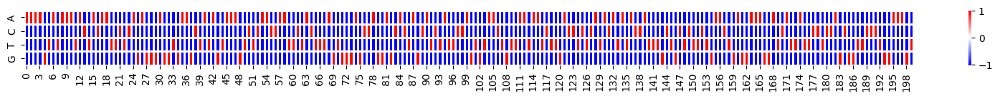

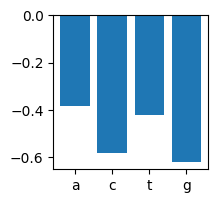

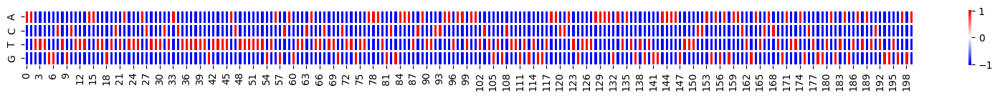

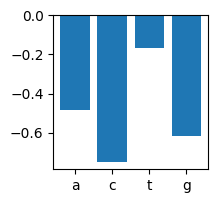

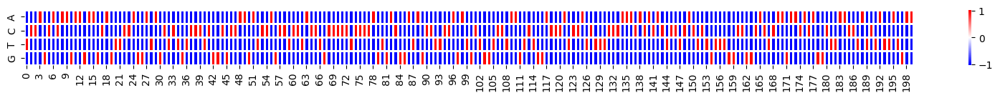

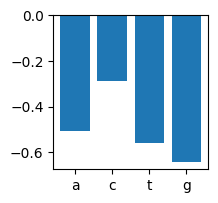

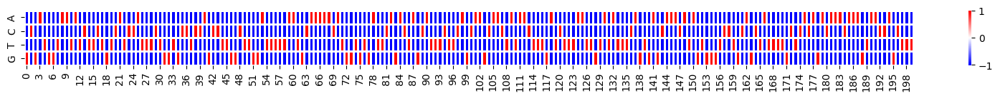

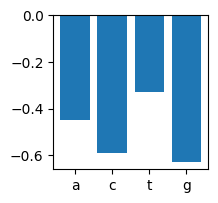

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.29 sequences/s]


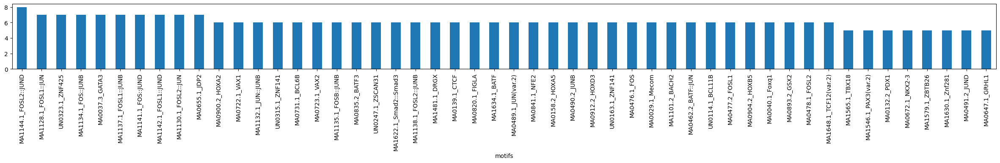

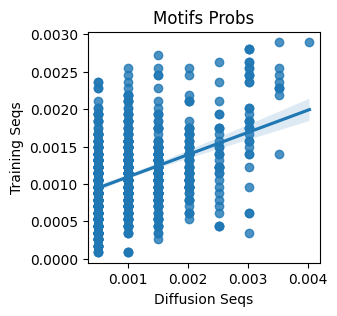

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002011,0.001052
1,MA0106.3_TP53,0.001508,0.002104
2,MA0816.1_Ascl2,0.001006,0.001490
3,MA0831.2_TFE3,0.000503,0.001666
4,MA0635.1_BARHL2,0.000503,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.001508,0.001315
878,MA1538.1_NR2F1(var.3),0.001006,0.000877
879,MA0608.1_Creb3l2,0.000503,0.001841
880,MA1530.1_NKX6-3,0.000503,0.000701


0.18088631477838701 KL
 Epoch 4010 Loss: 0.10804138332605362
 Epoch 4020 Loss: 0.0025897426530718803
 Epoch 4030 Loss: 0.054956670850515366
 Epoch 4040 Loss: 0.007465053349733353
 Epoch 4050 Loss: 0.01922760345041752
 Epoch 4060 Loss: 0.10313758999109268
 Epoch 4070 Loss: 0.041943714022636414
 Epoch 4080 Loss: 0.08249888569116592
 Epoch 4090 Loss: 0.10055337101221085
 Epoch 4100 Loss: 0.04913143813610077
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

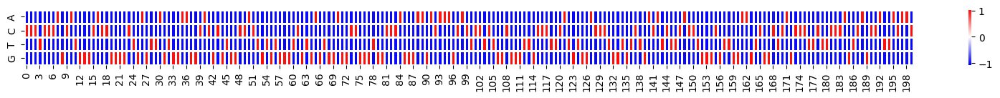

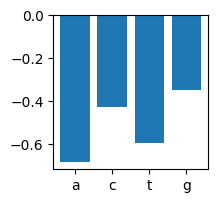

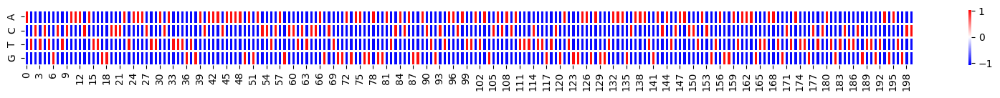

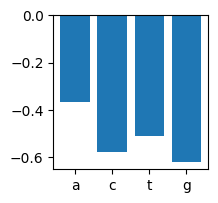

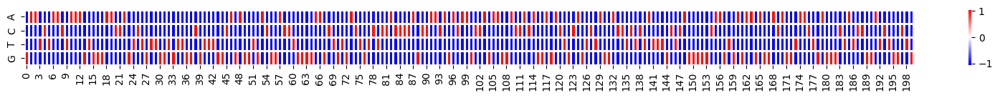

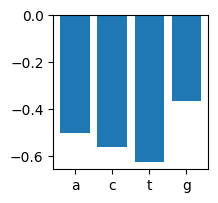

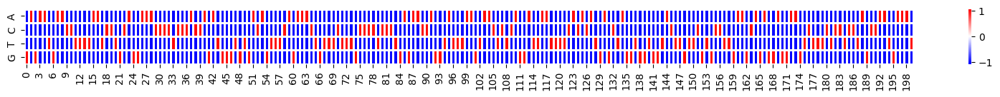

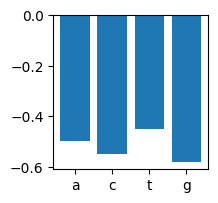

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.02 sequences/s]


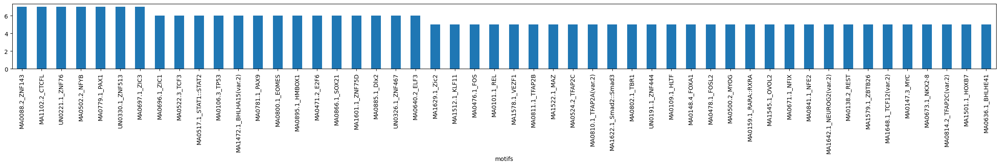

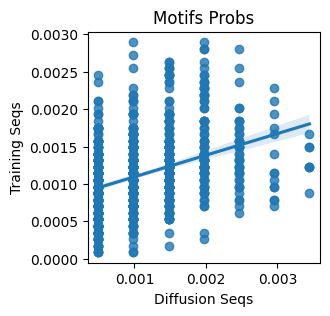

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.000493,0.001052
1,MA0106.3_TP53,0.002956,0.002104
2,MA0816.1_Ascl2,0.001970,0.001490
3,MA0831.2_TFE3,0.001478,0.001666
4,MA0635.1_BARHL2,0.000493,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.000493,0.001315
878,MA1538.1_NR2F1(var.3),0.000493,0.000877
879,MA0608.1_Creb3l2,0.001970,0.001841
880,MA1530.1_NKX6-3,0.000985,0.000701


0.16598867306978335 KL
 Epoch 4110 Loss: 0.0052434541285037994
 Epoch 4120 Loss: 0.0384976789355278
 Epoch 4130 Loss: 0.10916581004858017
 Epoch 4140 Loss: 0.004085912834852934
 Epoch 4150 Loss: 0.07355380803346634
 Epoch 4160 Loss: 0.0370747447013855
 Epoch 4170 Loss: 0.01846221089363098
 Epoch 4180 Loss: 0.007976760156452656
 Epoch 4190 Loss: 0.002991433022543788
 Epoch 4200 Loss: 0.0009773271158337593
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

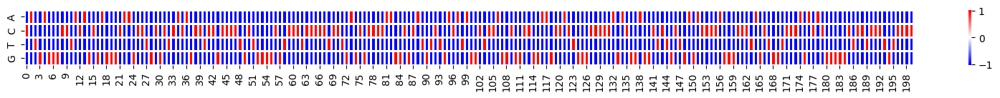

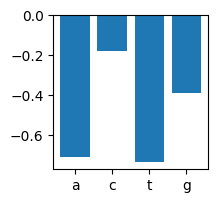

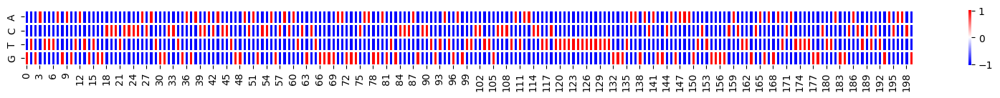

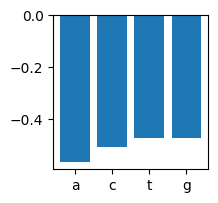

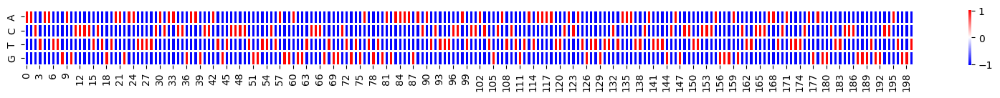

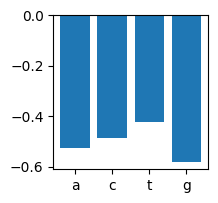

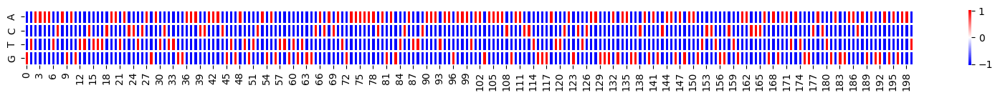

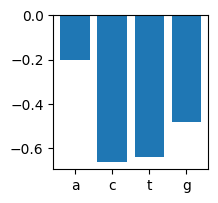

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.78 sequences/s]


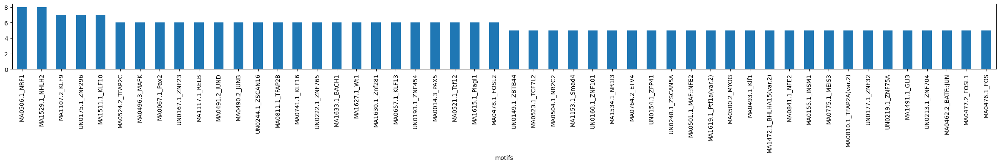

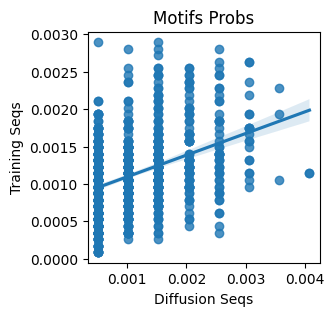

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.00153,0.001052
1,MA0106.3_TP53,0.00204,0.002104
2,MA0816.1_Ascl2,0.00153,0.001490
3,MA0831.2_TFE3,0.00102,0.001666
4,MA0635.1_BARHL2,0.00153,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.00102,0.001315
878,MA1538.1_NR2F1(var.3),0.00051,0.000877
879,MA0608.1_Creb3l2,0.00051,0.001841
880,MA1530.1_NKX6-3,0.00051,0.000701


0.17472132504865262 KL
 Epoch 4210 Loss: 0.003123270347714424
 Epoch 4220 Loss: 0.012216565199196339
 Epoch 4230 Loss: 0.08030188083648682
 Epoch 4240 Loss: 0.10578996688127518
 Epoch 4250 Loss: 0.011614490300416946
 Epoch 4260 Loss: 0.02791975624859333
 Epoch 4270 Loss: 0.07115085422992706
 Epoch 4280 Loss: 0.04263327270746231
 Epoch 4290 Loss: 0.054122194647789
 Epoch 4300 Loss: 0.08496429026126862
saving


sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

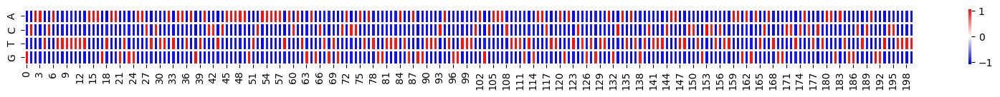

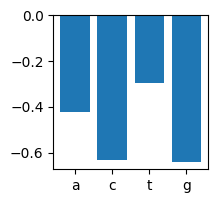

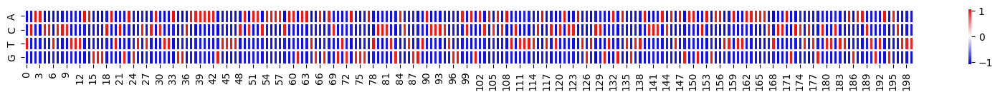

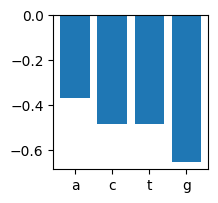

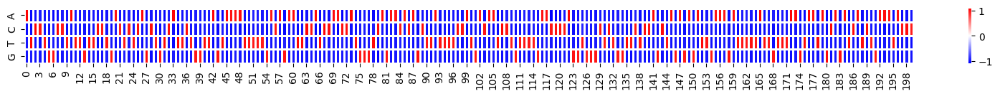

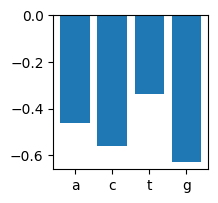

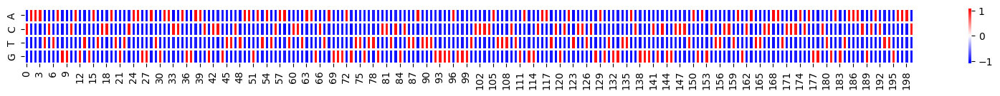

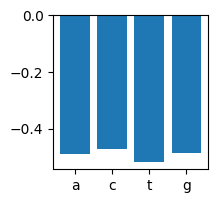

/tmp/ipykernel_182858/3205353829.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n_a in tqdm_notebook(range(20)): # generating 20*10 sequences


  0%|          | 0/20 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/200 [00:00<?, ?it/s]

scanning: 100%|███████████████████████| 200/200 [00:05<00:00, 35.65 sequences/s]


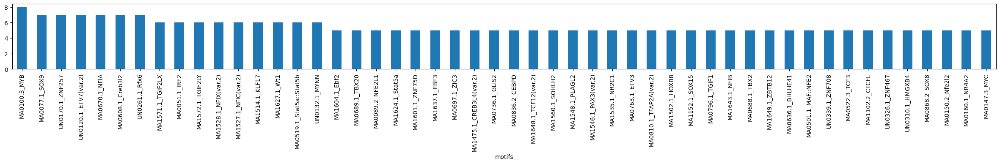

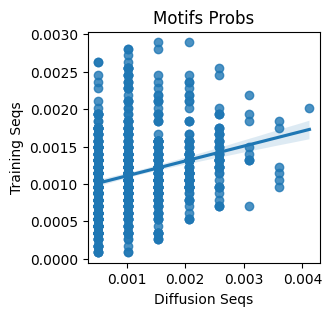

,motif,motif_a,motif_b
0,UN0125.1_HSF5,0.002060,0.001052
1,MA0106.3_TP53,0.001030,0.002104
2,MA0816.1_Ascl2,0.001030,0.001490
3,MA0831.2_TFE3,0.002060,0.001666
4,MA0635.1_BARHL2,0.001545,0.000964
...,...,...,...
877,MA1624.1_Stat5a,0.002575,0.001315
878,MA1538.1_NR2F1(var.3),0.001545,0.000877
879,MA0608.1_Creb3l2,0.003605,0.001841
880,MA1530.1_NKX6-3,0.000515,0.000701


0.19841488034121862 KL
 Epoch 4310 Loss: 0.04591189697384834
 Epoch 4320 Loss: 0.11236421763896942
 Epoch 4330 Loss: 0.000764540396630764
 Epoch 4340 Loss: 0.10866256803274155
 Epoch 4350 Loss: 0.007730802521109581


KeyboardInterrupt: 

In [114]:
epochs =10000
save_and_sample_every = 100
epochs_loss_show = 10 

for epoch in tqdm_notebook(range(epochs)):
    for step, batch in enumerate(train_dl):

        optimizer.zero_grad()
        #print (batch[0].dtype)
        batch_size = batch[0].shape[0]
        batch = batch.type(torch.float32)
        batch = batch.to(device)


        # batch_size = batch["pixel_values"].shape[0]
        # batch = batch["pixel_values"].to(device)


        # Algorithm 1 line 3: sample t uniformally for every example in the batch
        t = torch.randint(0, timesteps, (batch_size,), device=device).long() # sampling a t to generate t and t+1
        #print (t.dtype)



        #loss = p_losses(model, batch, t, loss_type="l2")
        loss = p_losses(model, batch, t, loss_type="huber")


        loss.backward()
        optimizer.step()
    
    if (epoch % epochs_loss_show) == 0:

        print(f" Epoch {epoch} Loss:", loss.item())

  

    # save generated images
    if epoch != 0 and epoch % save_and_sample_every == 0:
        print ('saving')
        milestone = step // save_and_sample_every
        samples = sample(model, image_size=image_size, batch_size=5, channels=1)
        n_print = 0
        for image in samples[-1]:
          if n_print < 4:
            plt.rcParams["figure.figsize"] = (20,1)
            pd_seq = pd.DataFrame(image.reshape(4,200))
            pd_seq.index = nucleotides
            sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
            plt.show()
            plt.rcParams["figure.figsize"] = (2,2)

            plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)

            plt.show()
            n_print = n_print + 1
        synt_df = sampling_to_metric()
        print(compare_motif_list(synt_df, df_results_seq_guime_count), 'KL' )





  

In [ ]:
#plot a log2d samples similarity

# Create an diffusion animation

In [ ]:
# sample sequences
samples = sample(model, image_size=image_size, batch_size=10, channels=1)

random_index = 0
!rm image_temp
!mkdir image_temp
fig = plt.figure()
ims = []
for i in range(timesteps):
      plt.rcParams["figure.figsize"] = (20,1)
      pd_seq = pd.DataFrame(samples[i][random_index].reshape(4,200))
      pd_seq.index = nucleotides

      sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
      plt.savefig(f'image_temp/{i}_temp.jpg')
      plt.show()
      plt.clf()

In [ ]:
def make_gif():
    images_to_sort = !ls image_temp -lt
    #print (images_to_sort)
    images_reverse  =[x.split(' ')[-1] for x in images_to_sort][1:]
    images_reverse = images_reverse[::-1]
    
    frames = [Image.open(f'image_temp/{image}') for image in images_reverse]
    #print (len(frames))
    frame_one = frames[0]
    frame_one.save("diff_first.gif", format="GIF", append_images=frames,
               save_all=True, duration=30, loop=0)

In [ ]:
make_gif()